In [124]:
import torch
from torch import nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchsummary import summary
import torch.nn.functional as F

import numpy as np
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

In [57]:
BATCH_SIZE = 64

transform = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

dataset = datasets.MNIST(root="dataset/", transform=transform, download=True)
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [152]:
#### models
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes=256, planes=256, stride=1, nonlin = 'leaky_relu'):
        super(BasicBlock, self).__init__()
        self.nonlin = nonlin
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        
        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )
        self.nonlin = nonlin
        self.initialise_weights()

    def forward(self, x):
        if self.nonlin == 'leaky_relu':
            out = F.leaky_relu(self.bn1(self.conv1(x)), negative_slope=0.02)
            out = self.bn2(self.conv2(out))
            out = out + self.shortcut(x)
            out = F.leaky_relu(out, negative_slope=0.02)
            return out
        elif self.nonlin == 'relu':
            out = F.relu(self.bn1(self.conv1(x)))
            out = self.bn2(self.conv2(out))
            out = out + self.shortcut(x)
            out = F.relu(out)
            return out
        else: raise NotImplementedError
            
    def initialise_weights(self):
        for m in self.modules():
            if type(m)== nn.Conv2d or type(m)==nn.Linear:
                torch.nn.init.kaiming_normal_(m.weight, nonlinearity=self.nonlin)
            
class gen1(nn.Module):
    def __init__(self, block, device):
        super(gen1, self).__init__()
        self.embed = nn.Conv2d(1,127, kernel_size=3, padding=1)
        self.b1 = block(in_planes=128, planes=128, stride=1,  nonlin = 'leaky_relu')
        self.b5 = block(in_planes=128, planes=64, stride=1, nonlin = 'leaky_relu')
        self.b6 = block(in_planes=64, planes=32, stride=1, nonlin = 'leaky_relu')
#         self.b7 = block(in_planes=32, planes=16, stride=1, nonlin = 'leaky_relu')
        self.final = nn.Conv2d(32,1, kernel_size=3, padding=1)
        self.upscale = torch.nn.UpsamplingBilinear2d(scale_factor=2)
        
    def forward(self, x, noise):
        x = F.relu(self.embed(x))
        x = torch.cat((x,noise), axis=1)
        x = self.b1(x)
        x = self.b5(self.upscale(x))
        x = self.b6(self.upscale(x))
#         x = self.b7(self.upscale(x))
        x = torch.sigmoid(self.final(x))
        return x
        
    

class disc1(nn.Module):
    def __init__(self, block, nonlin = 'leaky_relu'):
        super(disc1, self).__init__()
        hr_block = []
        lr_block = []
        inplanes = 1
        for planes in [32, 64]:
            hr_block.append(block(in_planes = inplanes, planes=planes, stride=2, nonlin = nonlin))
            lr_block.append(block(in_planes = inplanes, planes=planes, stride=1, nonlin = nonlin))
            inplanes=planes
        self.hr_block1 = nn.Sequential(*hr_block)
        self.lr_block1 = nn.Sequential(*lr_block)
#         self.hr_block2 = nn.Sequential(block(in_planes=64, planes=64, stride=1, nonlin = nonlin))#, block(in_planes=256, planes=256, stride=1, nonlin = nonlin))
        self.lr_block2 = nn.Sequential(block(in_planes=128, planes=64, stride=1, nonlin = nonlin))#,block(in_planes=256, planes=256, stride=1, nonlin = nonlin))
#         self.dense1 = nn.Linear(128, 64)
        self.dense1 = nn.Linear(64, 64)
        self.dense2 = nn.Linear(64, 1)
        

    def forward(self, cond, sample):
        hr = self.hr_block1(sample)
#         print(hr.shape)
        lr = self.lr_block1(cond)
#         print(lr.shape)
        lr = torch.cat((lr,hr), axis=1)
#         hr = self.hr_block2(hr)
        lr = self.lr_block2(lr)
#         hr = nn.AvgPool2d(COND_SIZE)(hr)
        lr = nn.AvgPool2d(COND_SIZE)(lr)
#         out = torch.cat((torch.squeeze(hr), torch.squeeze(lr)), axis=1)
        out = torch.squeeze(lr)
        out = F.leaky_relu(self.dense1(out), negative_slope=0.02)
        out = self.dense2(out)
        return torch.sigmoid(out)
        


In [153]:

def loss_D(target,cond,noise,G,D):
    fake = G(cond, noise)
    D_real = D(cond, target)
    D_fake = D(cond, fake)
    loss_func = nn.BCELoss()
    D_real_loss = loss_func(D_real, torch.ones_like(D_real))
    D_fake_loss = loss_func(D_fake, torch.zeros_like(D_fake))
    l = D_real_loss + D_fake_loss
#     epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
#     gradient = get_gradient(D, lr, real, fake.detach(), epsilon)
#     grad_penalty = gradient_penalty(gradient)
#     l+= lam*grad_penalty
    return l
    
def loss_G(cond, noise, G, D):
    fake = G(cond, noise)
    D_fake = D(cond, fake)
    loss_func = nn.BCELoss()
    return loss_func(D_fake, torch.ones_like(D_fake))

In [154]:
def plot_sample(cond, target, gen, k=1):
    with torch.no_grad():
        noise = torch.randn(cond.shape[0], 1, cond.shape[2], cond.shape[3]).to(device)
        preds = gen(cond.to(device), noise).detach().cpu().numpy()
    
    for i in range(k):
        lr = cond[i, 0].detach().cpu().numpy()
        hr = target[i, 0].detach().cpu().numpy()
        pred = preds[i, 0]

        mn = np.min([np.min(lr), np.min(hr), np.min(pred)])
        mx = np.max([np.max(lr), np.max(hr), np.max(pred)])

        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
        im = ax1.imshow(lr, vmin=mn, vmax=mx, cmap='gist_ncar_r')
        plt.colorbar(im, ax=ax1, shrink=0.7)
        im = ax2.imshow(pred, vmin=mn, vmax=mx, cmap='gist_ncar_r')
        plt.colorbar(im, ax=ax2, shrink=0.7)
        im = ax3.imshow(hr, vmin=mn, vmax=mx, cmap='gist_ncar_r')
        plt.colorbar(im, ax=ax3, shrink=0.7)
        plt.show()


In [161]:
COND_SIZE = 7
def label_to_cond(label):
    cond = torch.zeros(label.shape[0],COND_SIZE**2)
    cond[:, :10] = nn.functional.one_hot(label, num_classes=10)
    cond = torch.reshape(cond, (label.shape[0], 1, COND_SIZE, COND_SIZE))
    return cond

In [162]:
true_sample, label_sample = iter(loader).next()
cond_sample = label_to_cond(label_sample)
true_sample, cond_sample = true_sample.to(device), cond_sample.to(device)

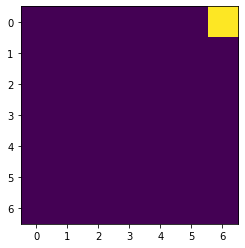

In [163]:
plt.imshow(cond_sample.detach().cpu()[8][0])

In [164]:
D = disc1(BasicBlock).to(device)
G = gen1(BasicBlock, device).to(device)

In [165]:
noise = torch.randn(cond_sample.shape[0], 1, cond_sample.shape[2], cond_sample.shape[3]).to(device)
print(G(cond_sample, noise).shape)
D(cond_sample, G(cond_sample, noise)).shape

torch.Size([64, 1, 28, 28])


torch.Size([64, 1])

Layer (type:depth-idx)                   Param #
├─Conv2d: 1-1                            1,270
├─BasicBlock: 1-2                        --
|    └─Conv2d: 2-1                       147,456
|    └─BatchNorm2d: 2-2                  256
|    └─Conv2d: 2-3                       147,456
|    └─BatchNorm2d: 2-4                  256
|    └─Sequential: 2-5                   --
├─BasicBlock: 1-3                        --
|    └─Conv2d: 2-6                       73,728
|    └─BatchNorm2d: 2-7                  128
|    └─Conv2d: 2-8                       36,864
|    └─BatchNorm2d: 2-9                  128
|    └─Sequential: 2-10                  --
|    |    └─Conv2d: 3-1                  8,192
|    |    └─BatchNorm2d: 3-2             128
├─BasicBlock: 1-4                        --
|    └─Conv2d: 2-11                      18,432
|    └─BatchNorm2d: 2-12                 64
|    └─Conv2d: 2-13                      9,216
|    └─BatchNorm2d: 2-14                 64
|    └─Sequential: 2-15            

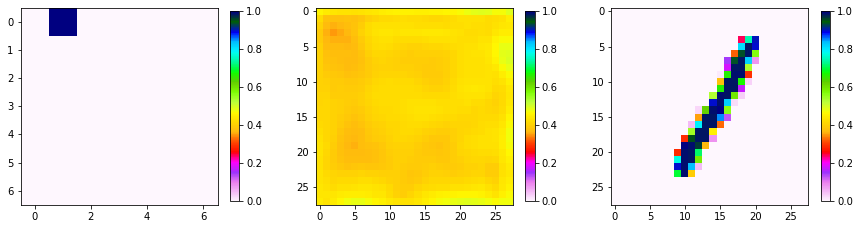

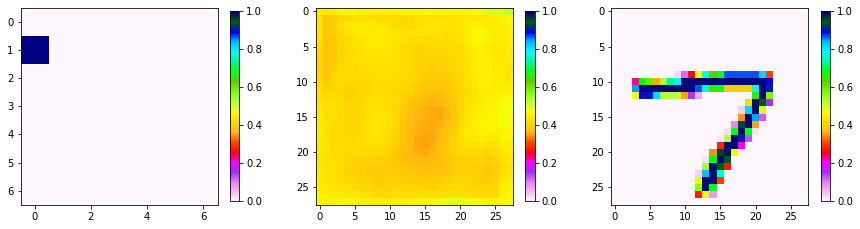

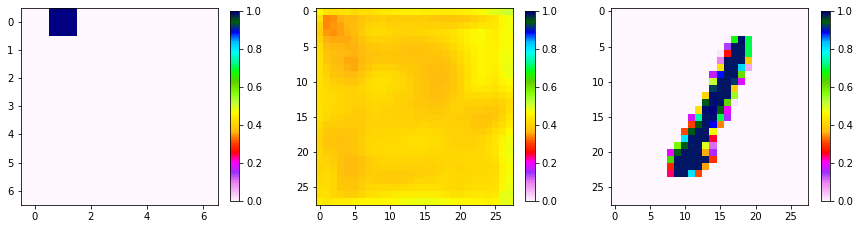

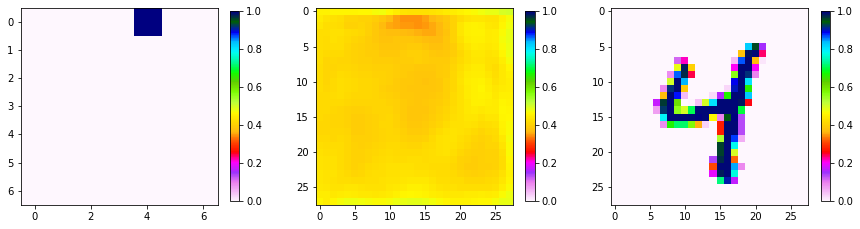

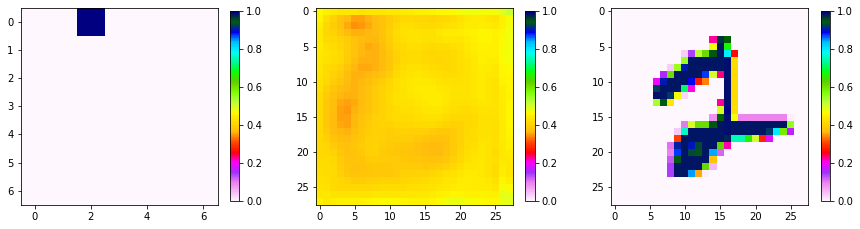

epoch 1.0
Gen train loss: 0.47533149004746705
Disc train loss: 0.6935638415686628


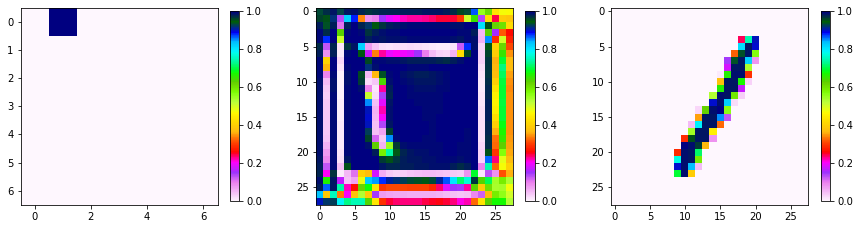

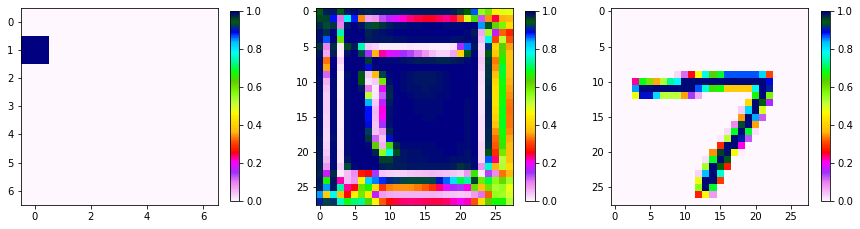

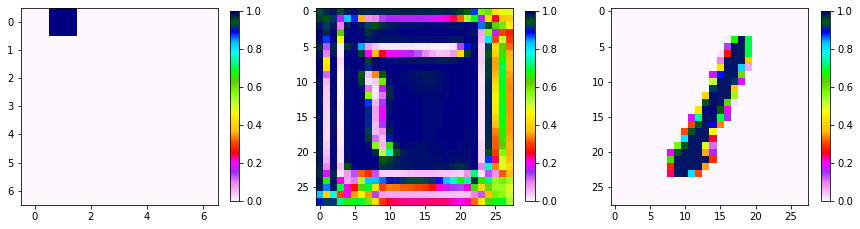

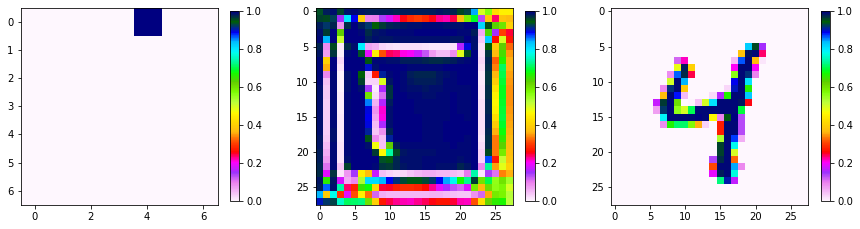

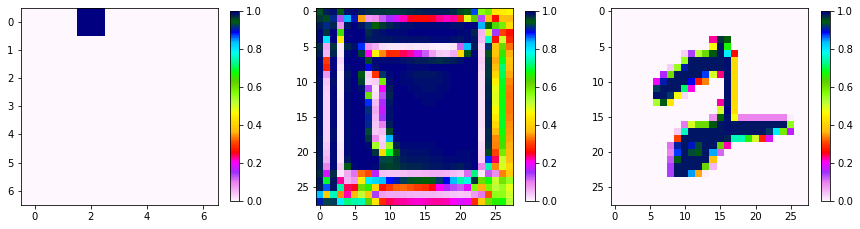

epoch 2.0
Gen train loss: 0.0722543466677691
Disc train loss: 0.06397895207708208


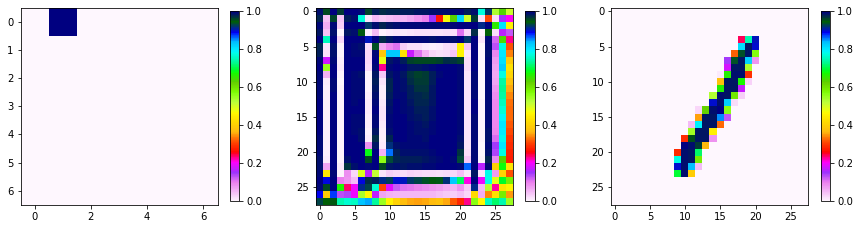

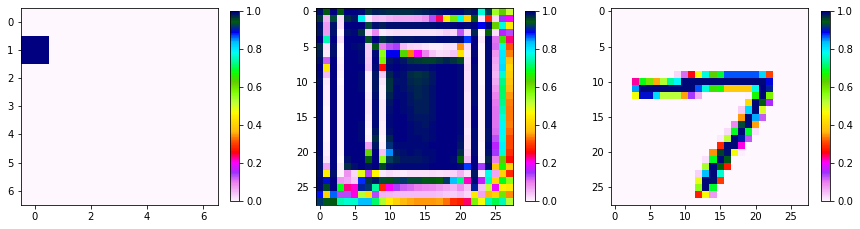

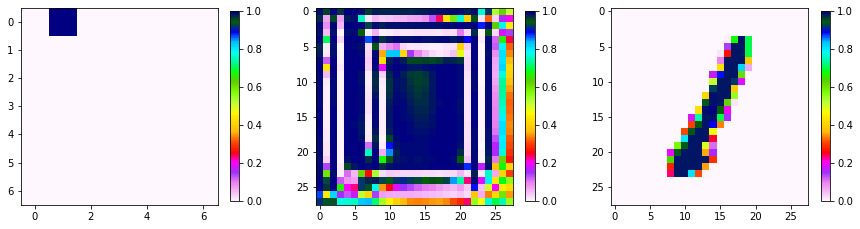

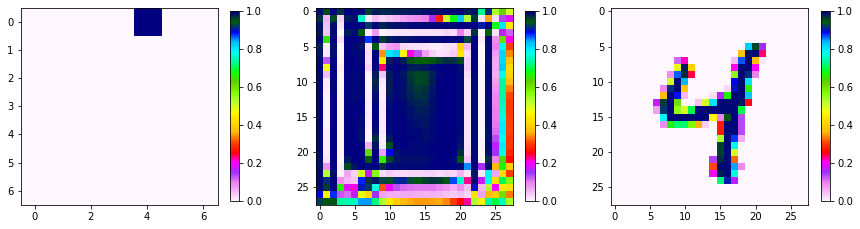

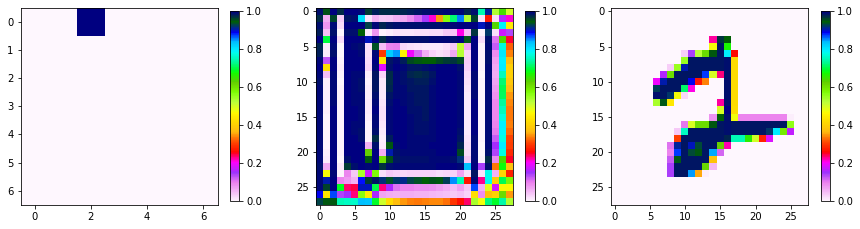

epoch 3.0
Gen train loss: 0.011500962195981644
Disc train loss: 0.016897974416930625


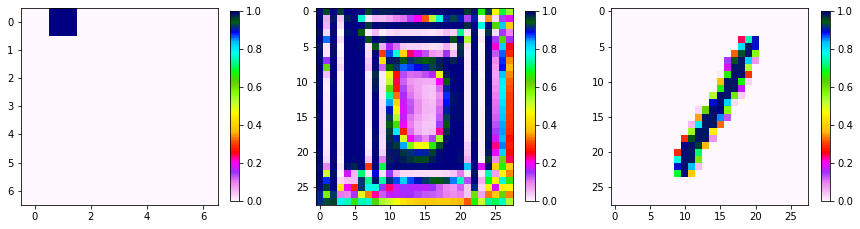

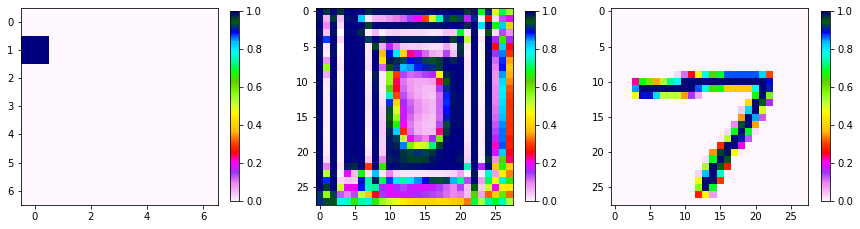

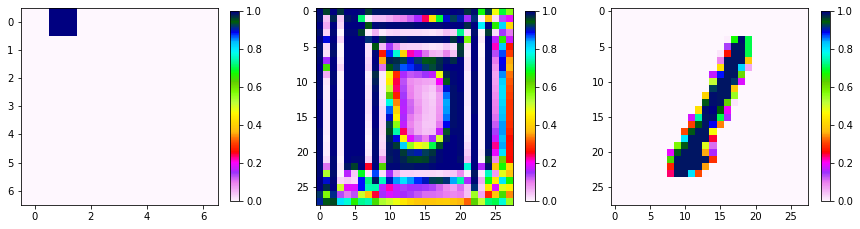

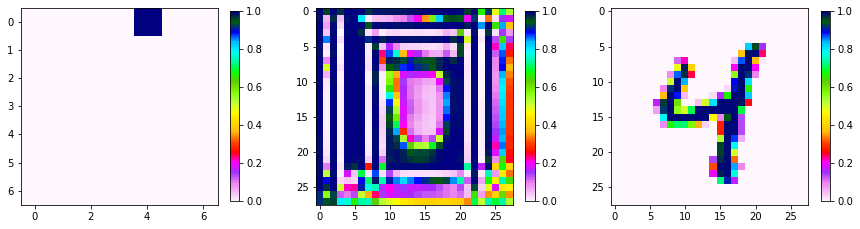

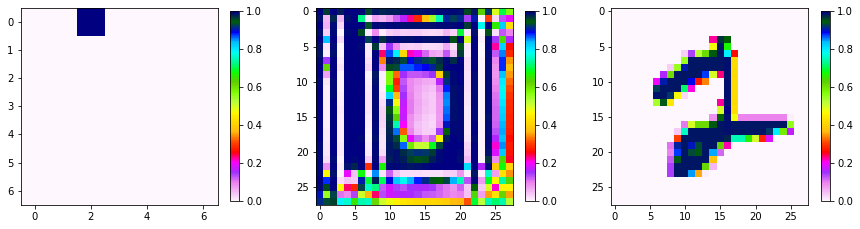

epoch 4.0
Gen train loss: 0.007652453315305583
Disc train loss: 0.007701743706567292


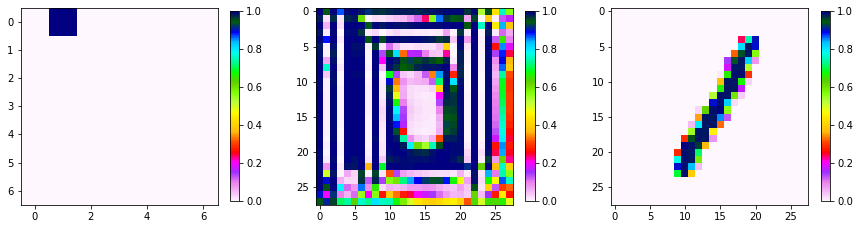

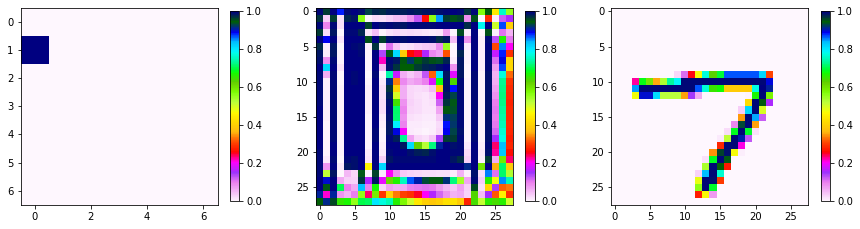

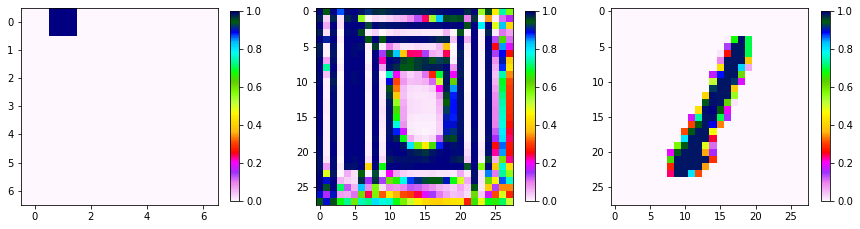

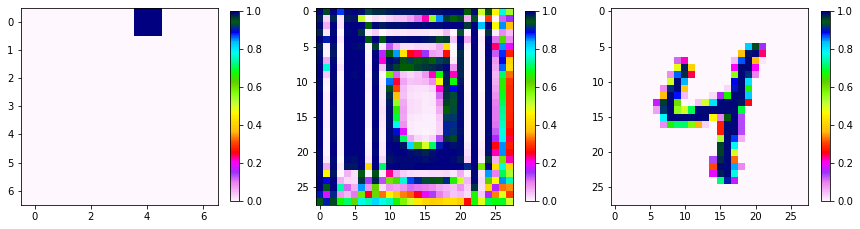

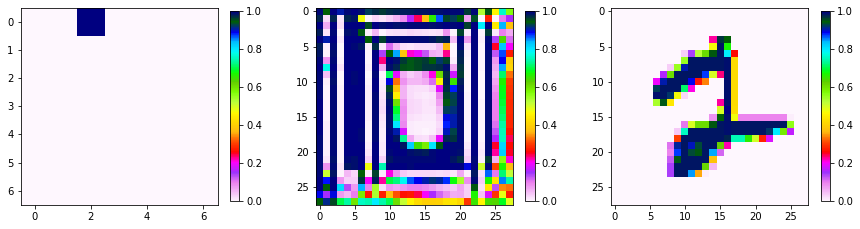

epoch 5.0
Gen train loss: 0.003280212809172515
Disc train loss: 0.00412116087081426


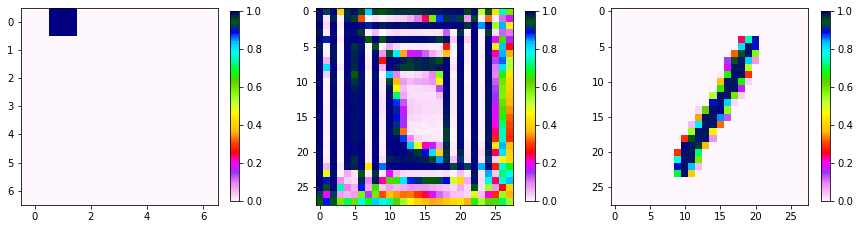

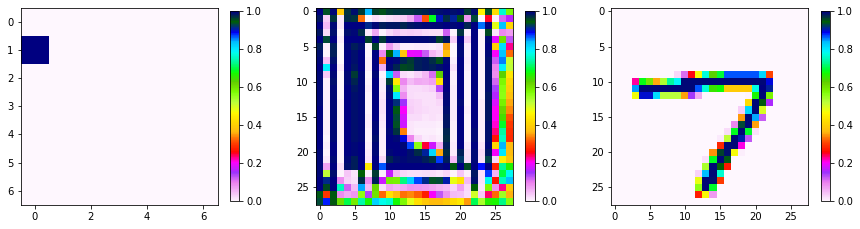

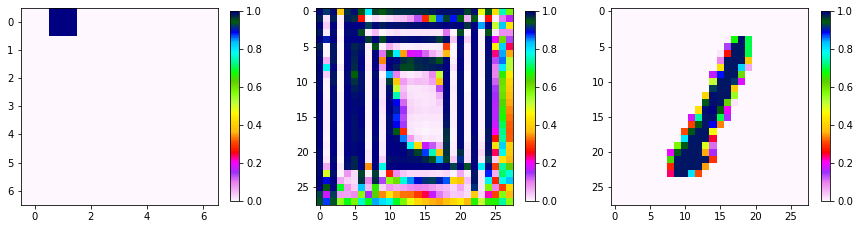

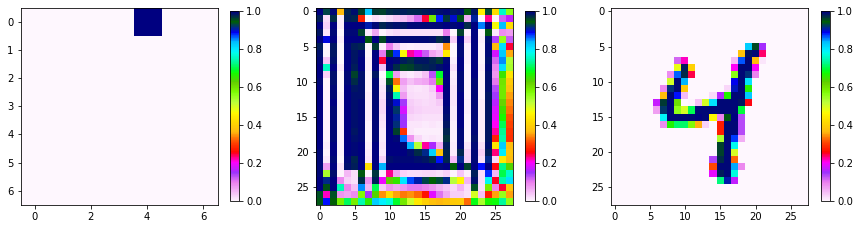

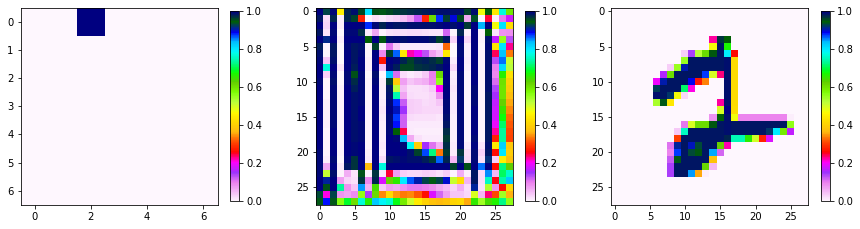

epoch 6.0
Gen train loss: 0.0015241502107992927
Disc train loss: 0.0025440699552209713


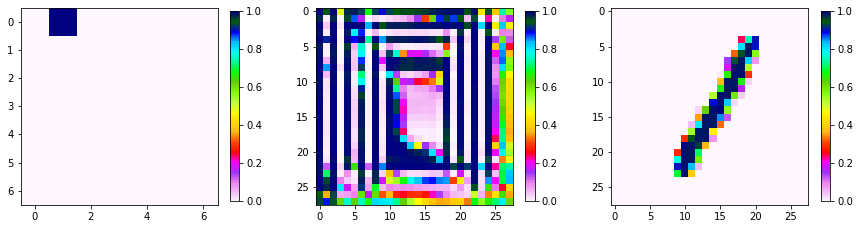

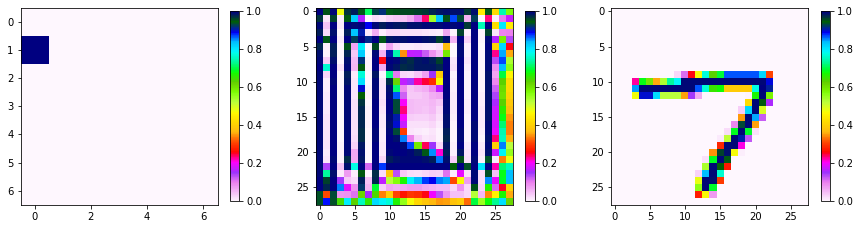

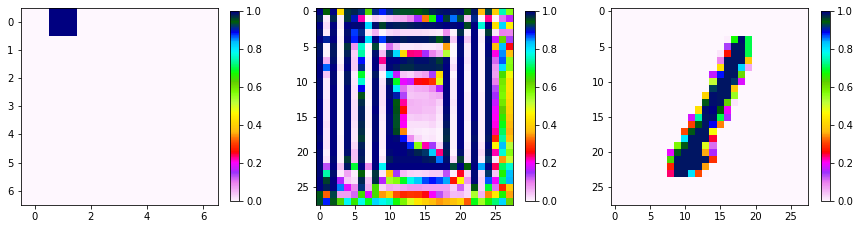

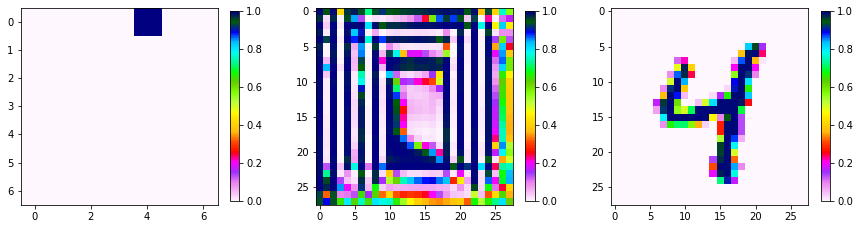

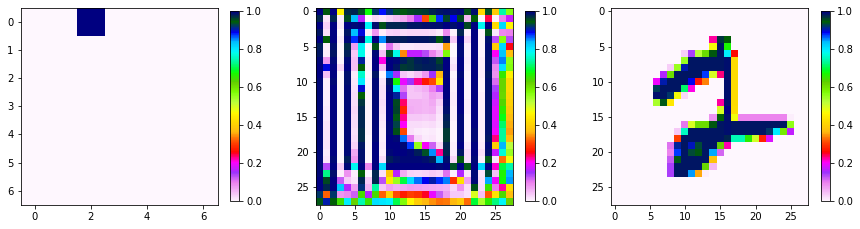

epoch 7.0
Gen train loss: 0.0005652126155915058
Disc train loss: 0.0015715611122667473


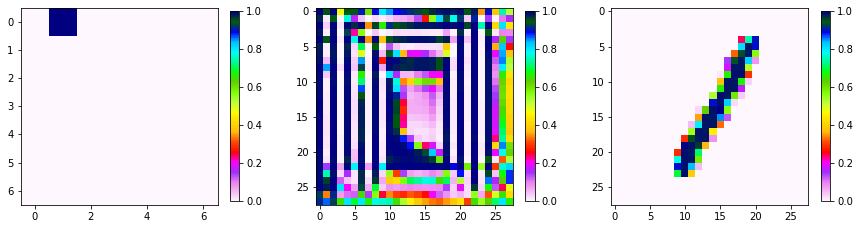

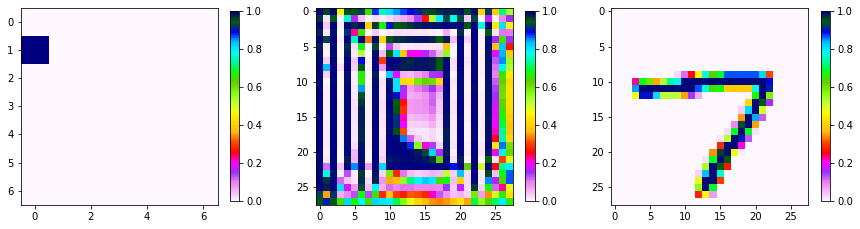

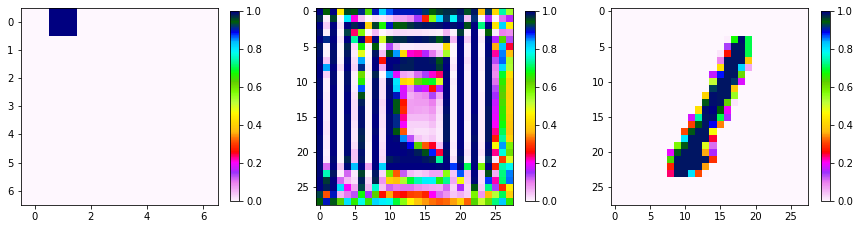

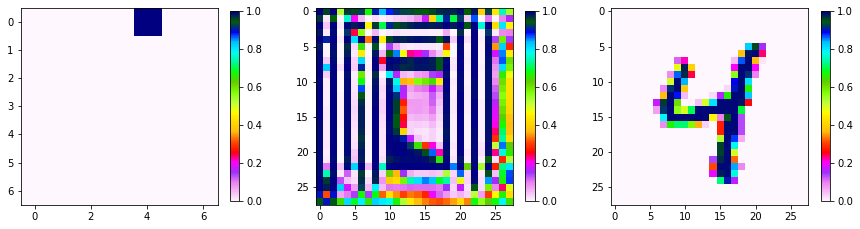

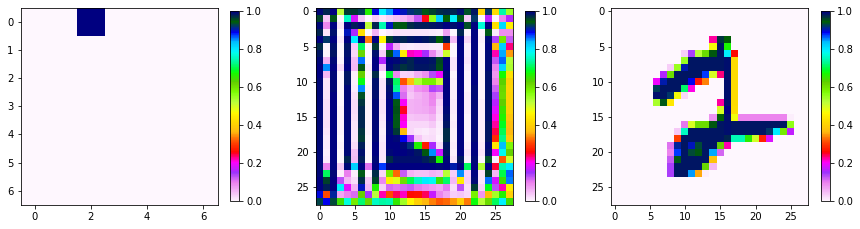

epoch 8.0
Gen train loss: 0.00028631981738416995
Disc train loss: 0.001016444018166353


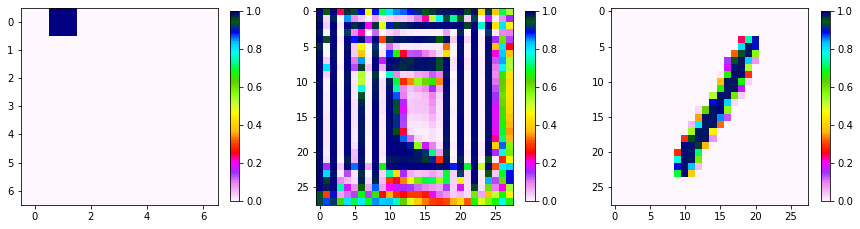

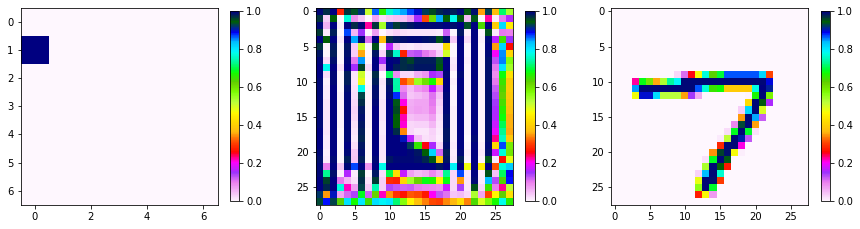

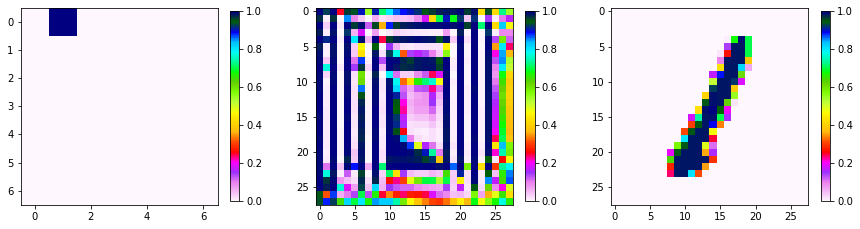

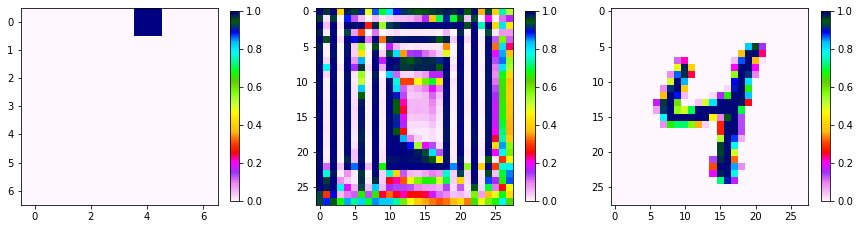

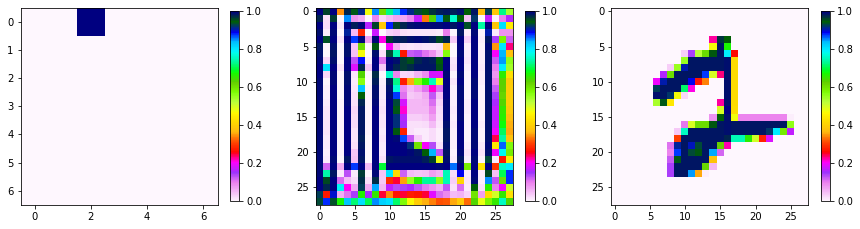

epoch 9.0
Gen train loss: 0.00016864315177807506
Disc train loss: 0.0006594770275888608


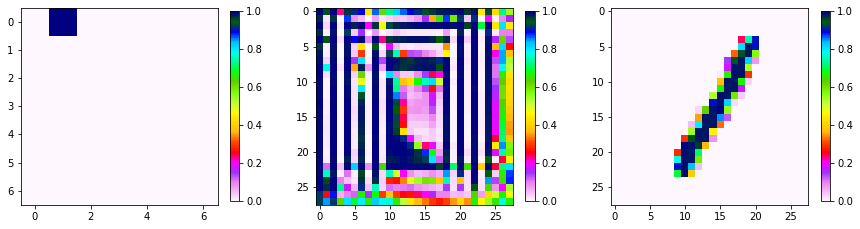

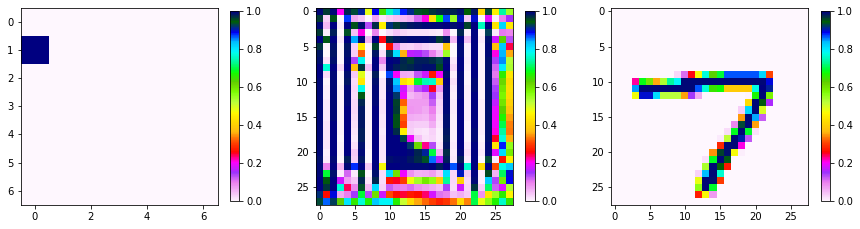

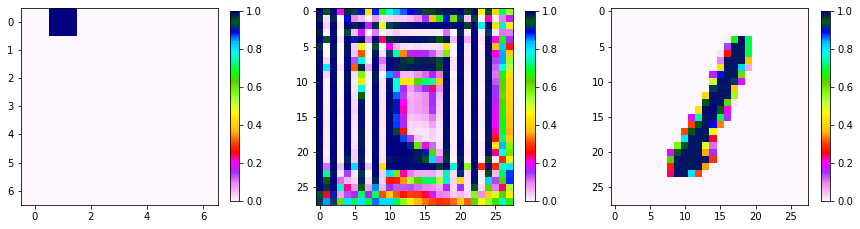

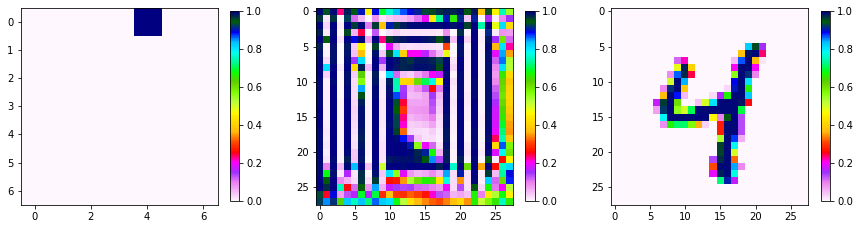

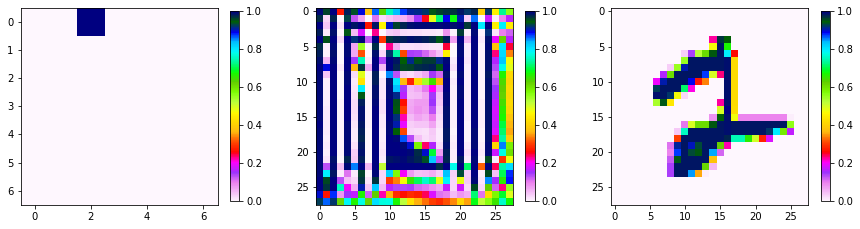

KeyboardInterrupt: 

In [167]:
rounds = 5000

train_disc = True
disc_steps = 5
gen_steps = 1

lam = 10

gen_train_loss = []
disc_train_loss = []
epoch_gen_train_loss = []
epoch_disc_train_loss = []
gen_val_loss = []
disc_val_loss = []

D = disc1(BasicBlock).to(device)
G = gen1(BasicBlock, device).to(device)

summary(G)
summary(D)


# for m in D.modules():
#     if type(m)== nn.Conv2d or type(m)==nn.Linear:
#         m = torch.nn.utils.spectral_norm(m)
#         print(m)
        
d_opt  = torch.optim.Adam(D.parameters(), lr=0.0001)
g_opt = torch.optim.Adam(G.parameters(), lr=0.0001, weight_decay=0.0001)

it = 0
steps_per_epoch = len(loader)/(disc_steps + gen_steps)

for step in range(rounds):
    if step % steps_per_epoch == 0:
        print(f"epoch {step/steps_per_epoch}")
        dtl = np.mean(epoch_disc_train_loss)
        gtl = np.mean(epoch_gen_train_loss)
        print("Gen train loss:", gtl)
        print("Disc train loss:", dtl)
        gen_train_loss.append(gtl)
        disc_train_loss.append(dtl)
        epoch_gen_train_loss = []
        epoch_disc_train_loss = []
        plot_sample(cond_sample, true_sample, G, k=5)
        
    if train_disc:
        D.train(True)
        G.train(False)
        
        for i in range(disc_steps):
            target, label = next(iter(loader))
            cond = label_to_cond(label)
            target = target.to(device)
            cond = cond.to(device)
            d_opt.zero_grad()
            noise = torch.randn(cond.shape[0], 1, cond.shape[2], cond.shape[3]).to(device)
            loss = loss_D(target, cond, noise, G, D)
            loss.backward()
            epoch_disc_train_loss.append(loss.item())
            d_opt.step()
            it+=1
        train_disc = not train_disc
        continue
    
    elif not train_disc:
        D.train(False)
        G.train(True)
        
        for i in range(gen_steps):
            target, label = next(iter(loader))
            cond = label_to_cond(label)
            target = target.to(device)
            cond = cond.to(device)
            g_opt.zero_grad()
            noise = torch.randn(cond.shape[0], 1, cond.shape[2], cond.shape[3]).to(device)
            loss = loss_G(cond, noise, G, D)
            loss.backward()
            epoch_gen_train_loss.append(loss.item())
            g_opt.step()
            it+=1
            
#         print(epoch_gen_train_loss)
        train_disc = not train_disc
        continue
        
    

Epoch [0/50] Batch 0/1875                       Loss D: 0.7432, loss G: 0.7349


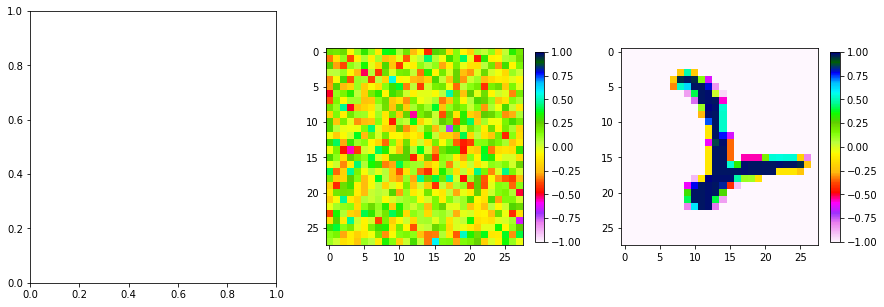

Epoch [1/50] Batch 0/1875                       Loss D: 0.2272, loss G: 2.0038


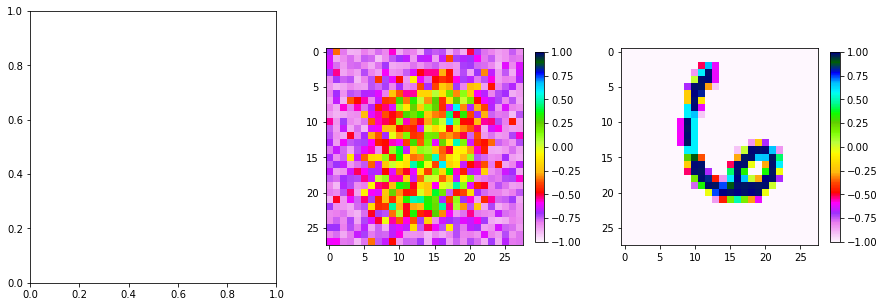

Epoch [2/50] Batch 0/1875                       Loss D: 0.6862, loss G: 0.8406


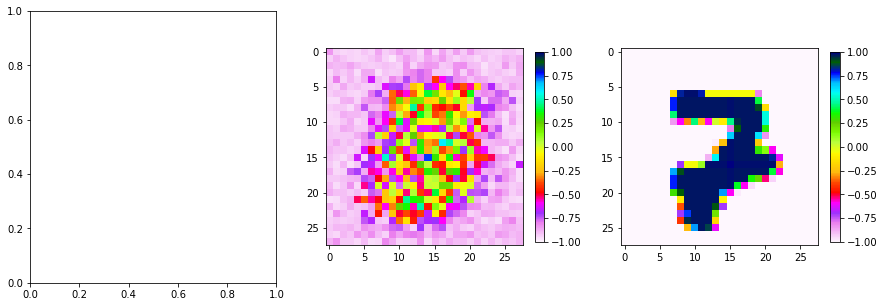

Epoch [3/50] Batch 0/1875                       Loss D: 0.8707, loss G: 0.9287


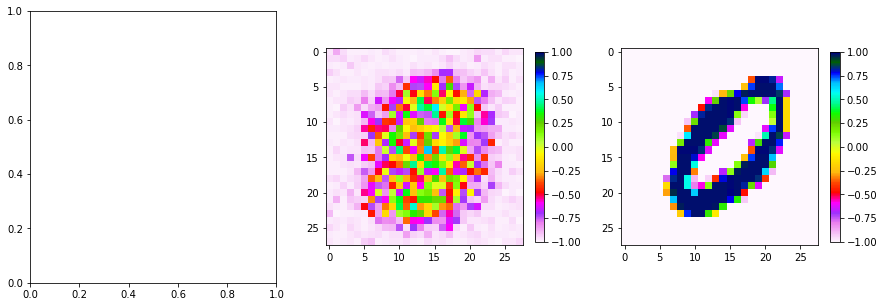

Epoch [4/50] Batch 0/1875                       Loss D: 0.7037, loss G: 0.9076


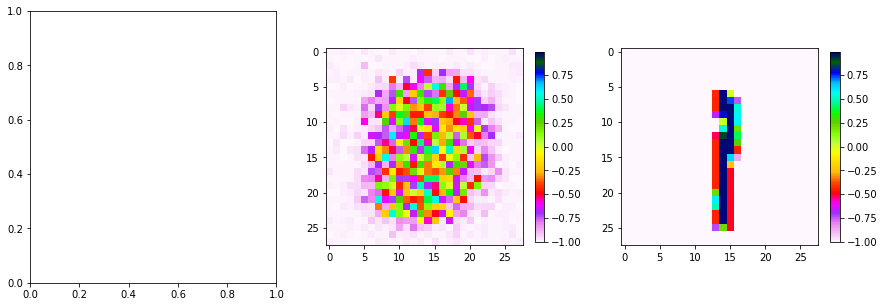

Epoch [5/50] Batch 0/1875                       Loss D: 0.4984, loss G: 1.2555


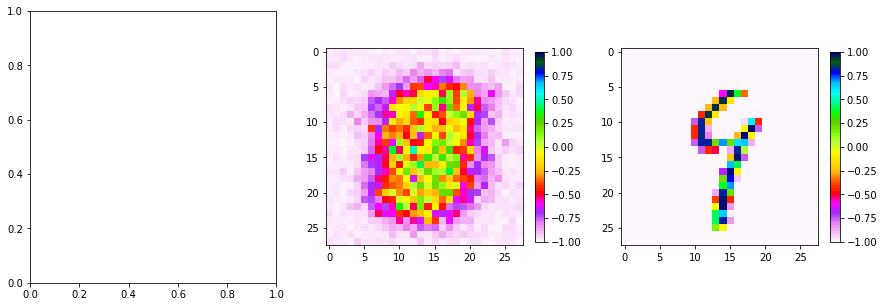

Epoch [6/50] Batch 0/1875                       Loss D: 0.6583, loss G: 1.3860


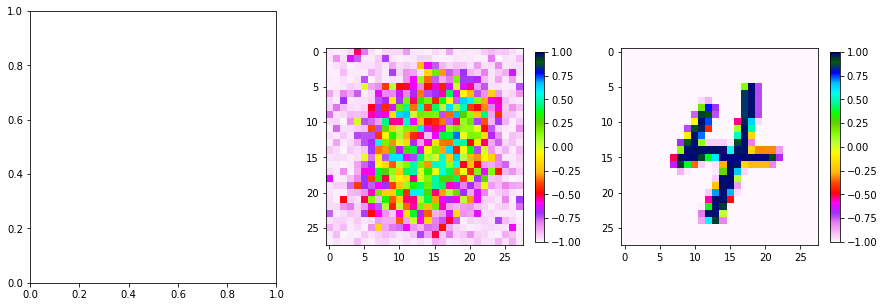

Epoch [7/50] Batch 0/1875                       Loss D: 0.7720, loss G: 1.0611


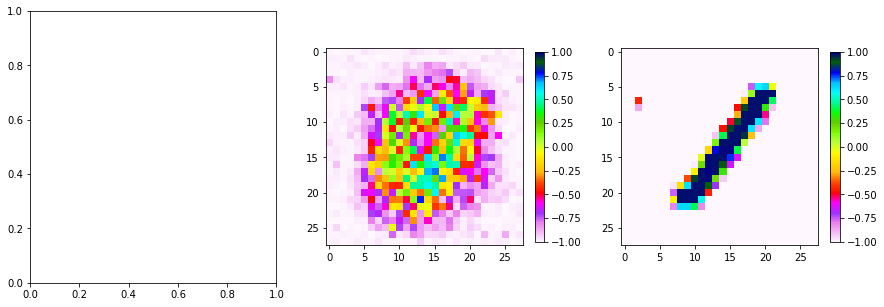

Epoch [8/50] Batch 0/1875                       Loss D: 0.3379, loss G: 2.6526


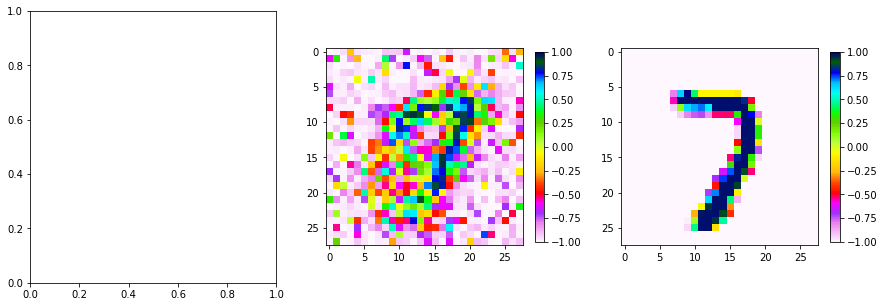

Epoch [9/50] Batch 0/1875                       Loss D: 0.3795, loss G: 1.5583


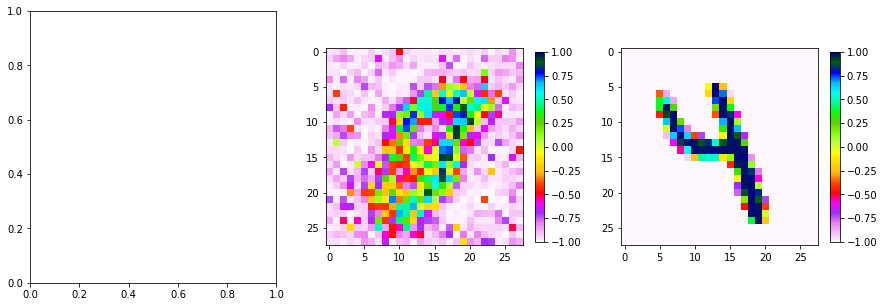

Epoch [10/50] Batch 0/1875                       Loss D: 0.3461, loss G: 2.1176


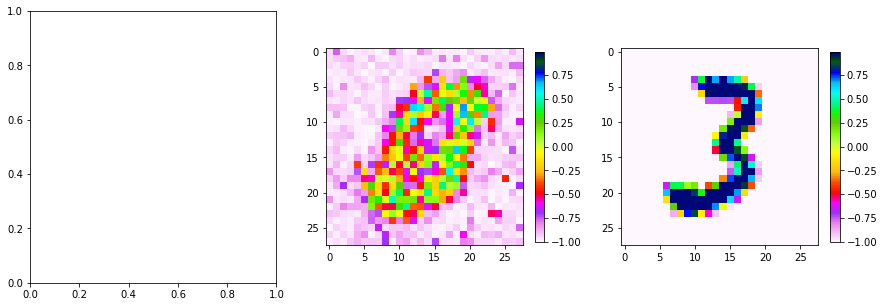

Epoch [11/50] Batch 0/1875                       Loss D: 0.7192, loss G: 1.0782


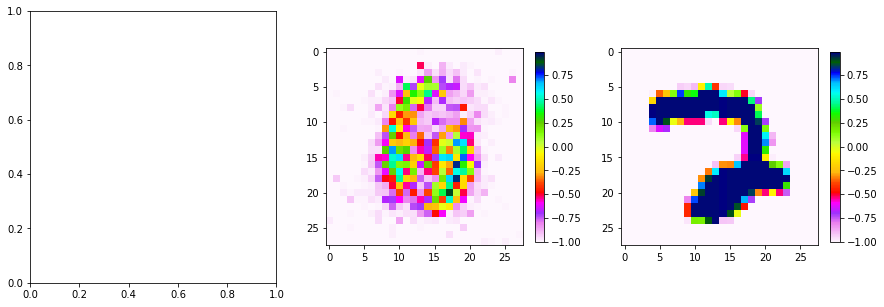

Epoch [12/50] Batch 0/1875                       Loss D: 0.7964, loss G: 1.4189


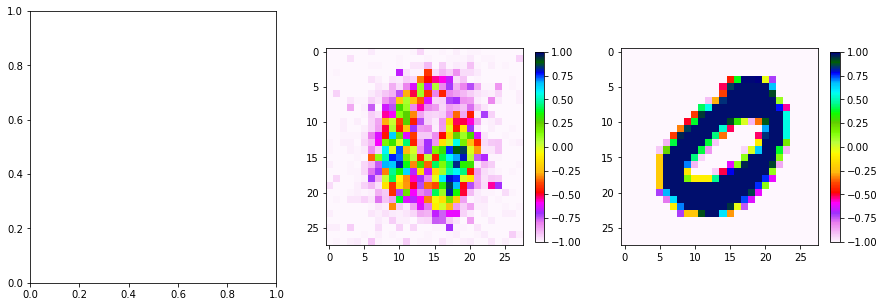

Epoch [13/50] Batch 0/1875                       Loss D: 0.3475, loss G: 2.0619


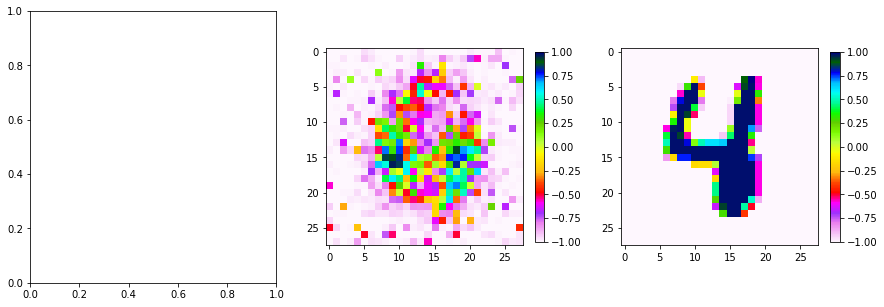

Epoch [14/50] Batch 0/1875                       Loss D: 0.5870, loss G: 1.5167


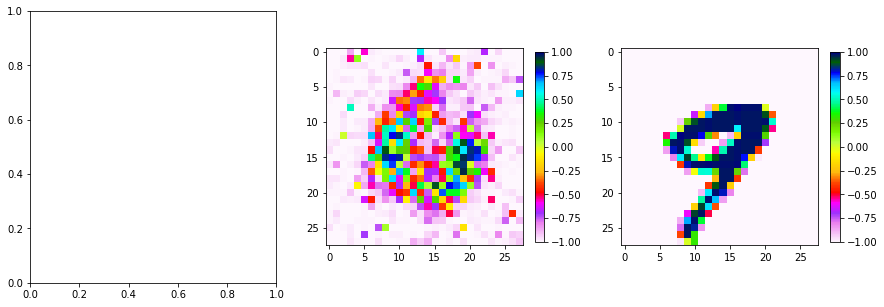

Epoch [15/50] Batch 0/1875                       Loss D: 0.3581, loss G: 1.9601


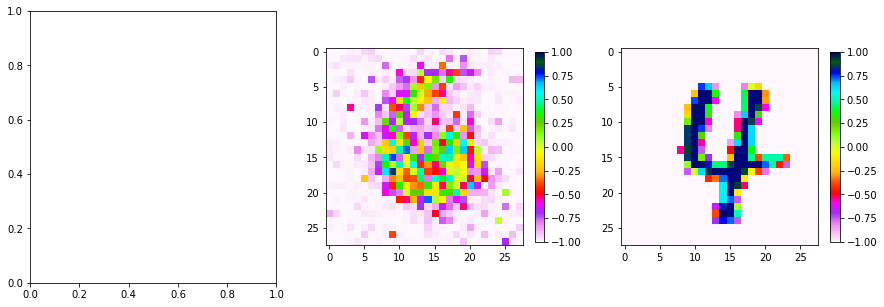

Epoch [16/50] Batch 0/1875                       Loss D: 0.4541, loss G: 2.0150


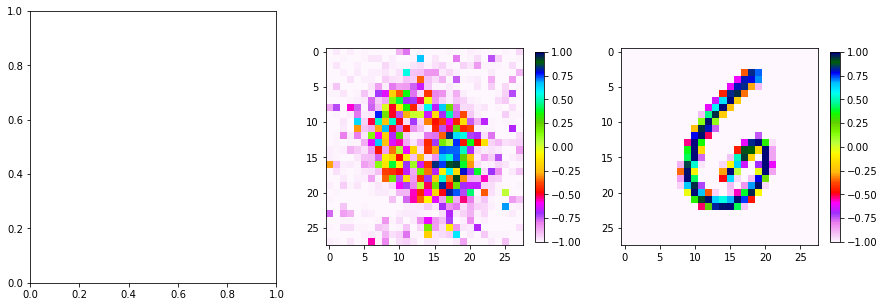

Epoch [17/50] Batch 0/1875                       Loss D: 0.5205, loss G: 1.1758


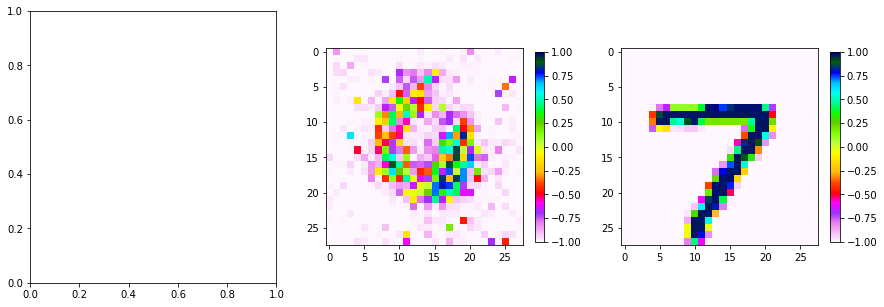

Epoch [18/50] Batch 0/1875                       Loss D: 0.4981, loss G: 1.4180


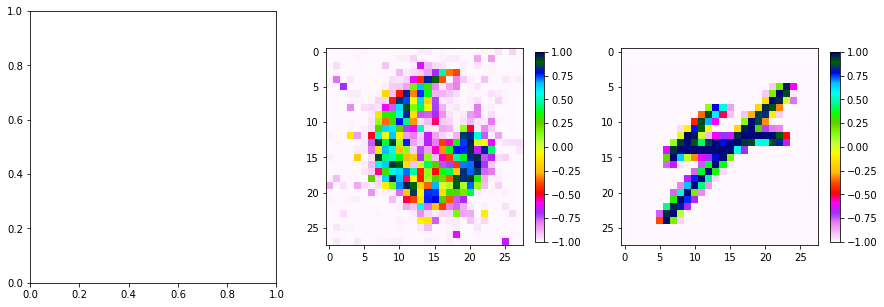

Epoch [19/50] Batch 0/1875                       Loss D: 0.6301, loss G: 1.9568


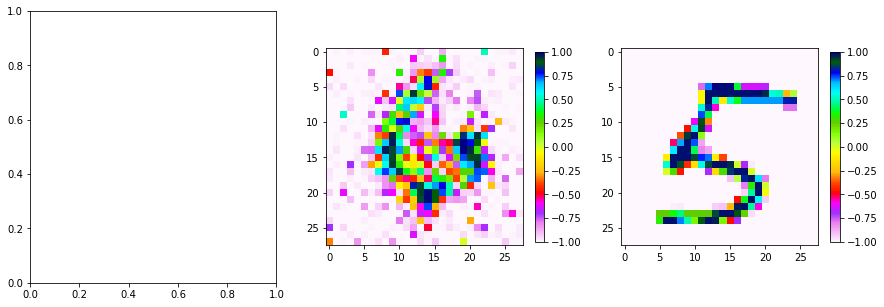

Epoch [20/50] Batch 0/1875                       Loss D: 0.7052, loss G: 1.3239


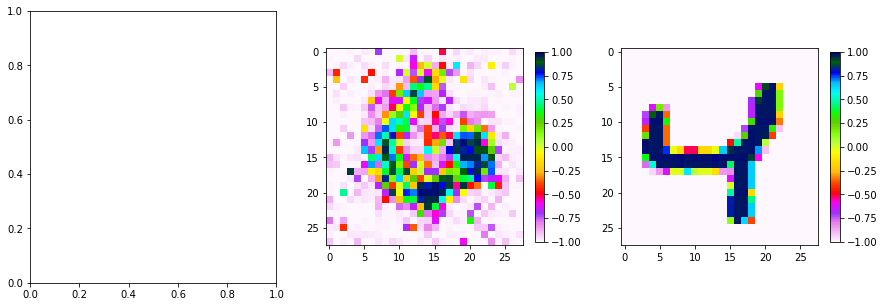

Epoch [21/50] Batch 0/1875                       Loss D: 0.4750, loss G: 1.9598


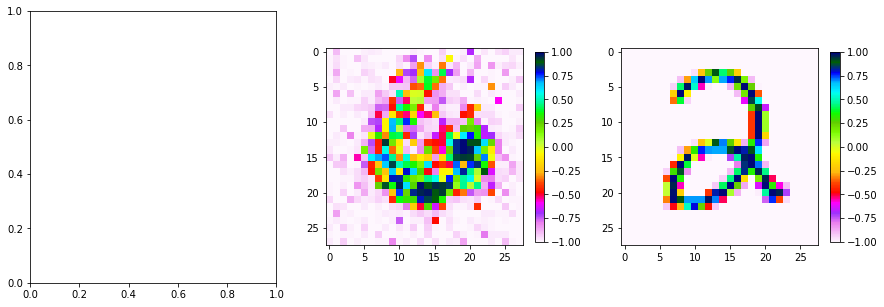

Epoch [22/50] Batch 0/1875                       Loss D: 0.7198, loss G: 1.0846


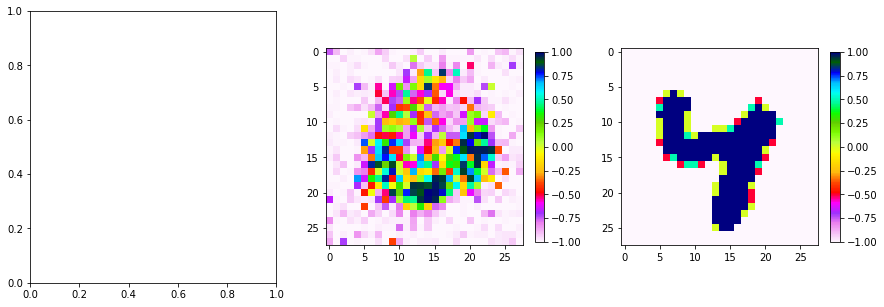

Epoch [23/50] Batch 0/1875                       Loss D: 0.5715, loss G: 1.4369


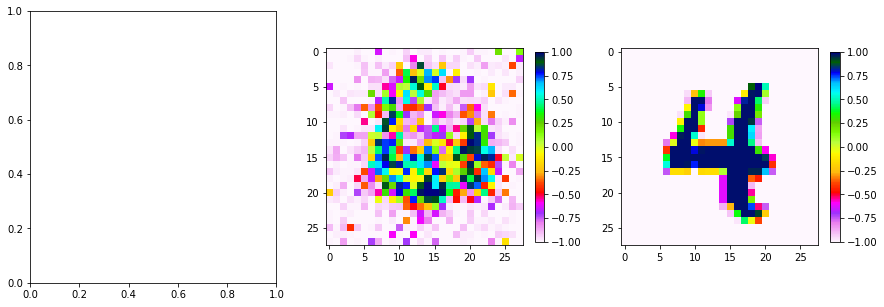

Epoch [24/50] Batch 0/1875                       Loss D: 0.5870, loss G: 1.1947


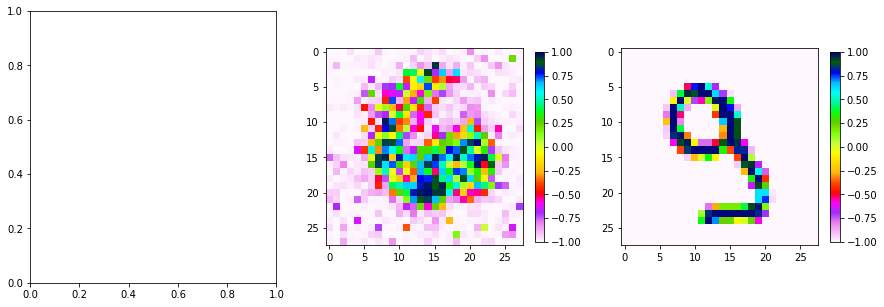

Epoch [25/50] Batch 0/1875                       Loss D: 0.6689, loss G: 1.7772


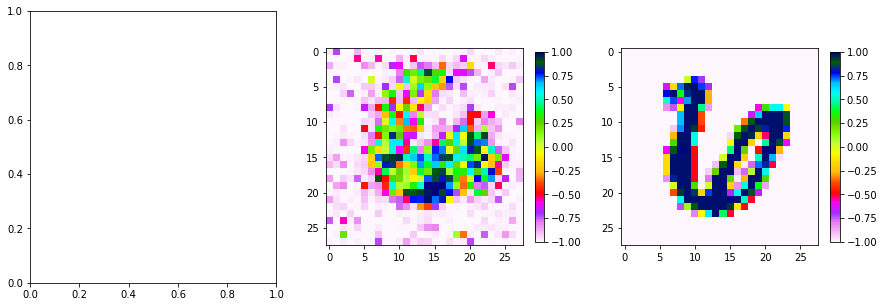

Epoch [26/50] Batch 0/1875                       Loss D: 0.9017, loss G: 1.2626


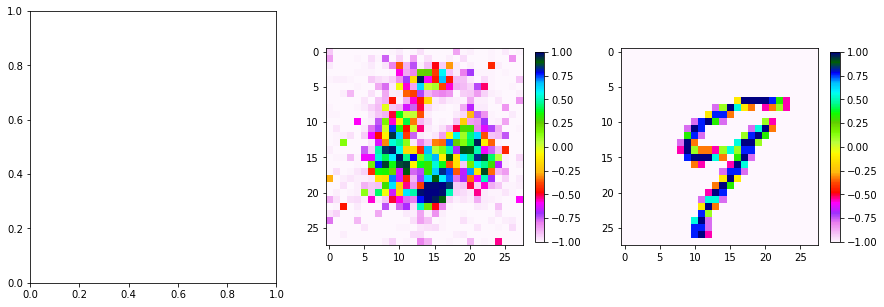

Epoch [27/50] Batch 0/1875                       Loss D: 0.4836, loss G: 2.0528


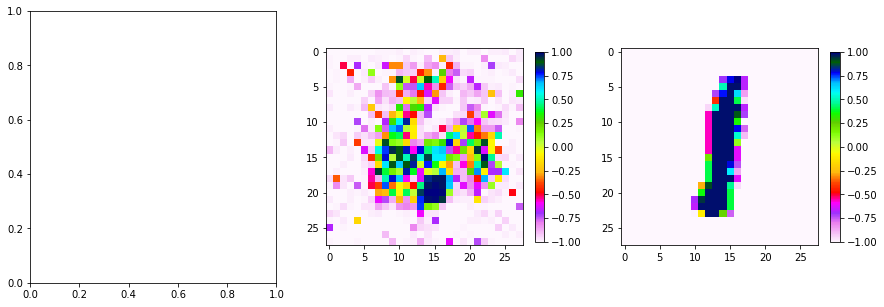

Epoch [28/50] Batch 0/1875                       Loss D: 0.4856, loss G: 1.8885


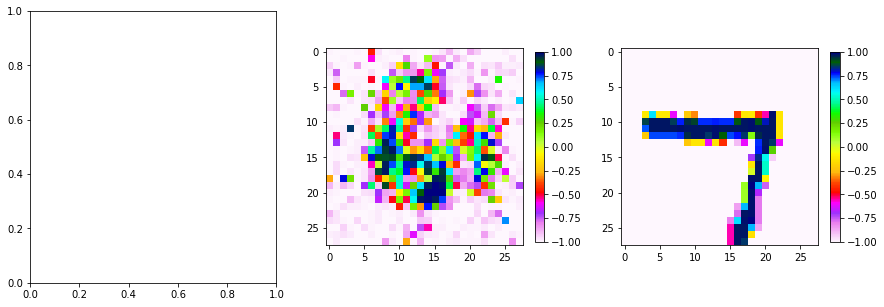

Epoch [29/50] Batch 0/1875                       Loss D: 0.5700, loss G: 1.6953


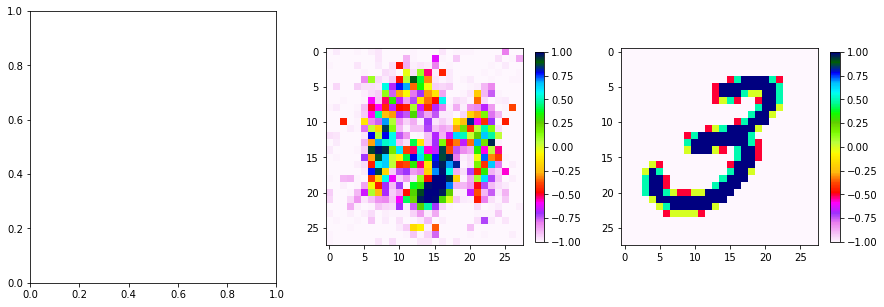

Epoch [30/50] Batch 0/1875                       Loss D: 0.6553, loss G: 1.2762


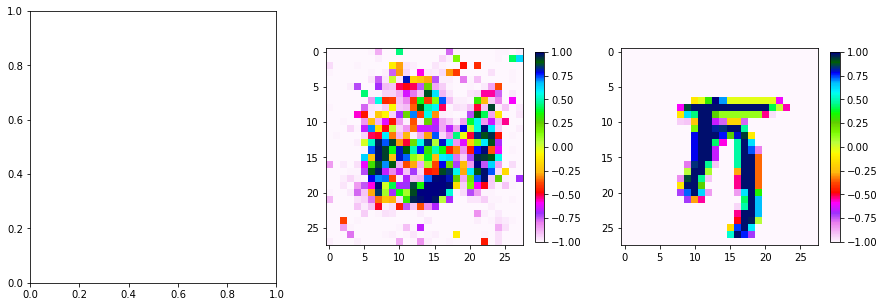

Epoch [31/50] Batch 0/1875                       Loss D: 0.6720, loss G: 0.9873


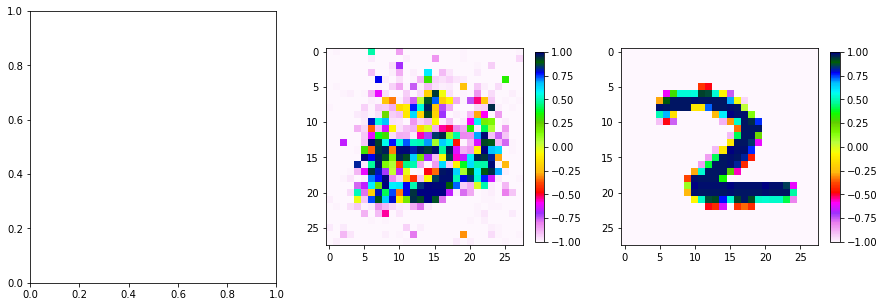

KeyboardInterrupt: 

In [173]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter  # to print to tensorboard


class Discriminator(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.LeakyReLU(0.01),
            nn.Linear(128, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super().__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.01),
            nn.Linear(256, img_dim),
            nn.Tanh(),  # normalize inputs to [-1, 1] so make outputs [-1, 1]
        )

    def forward(self, x):
        return self.gen(x)

def plot_sample(noise, target, gen, k=1):
    with torch.no_grad():
        preds = gen(noise).reshape(-1, 1, 28, 28).detach().cpu().numpy()
    
    for i in range(k):
#         lr = cond[i, 0].detach().cpu().numpy()
        hr = target[i, 0].detach().cpu().numpy()
        pred = preds[i, 0]
#         print(pred)

        mn = np.min([np.min(lr), np.min(hr), np.min(pred)])
        mx = np.max([np.max(lr), np.max(hr), np.max(pred)])

        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
#         im = ax1.imshow(lr, vmin=mn, vmax=mx, cmap='gist_ncar_r')
#         plt.colorbar(im, ax=ax1, shrink=0.7)
        im = ax2.imshow(pred, vmin=mn, vmax=mx, cmap='gist_ncar_r')
        plt.colorbar(im, ax=ax2, shrink=0.7)
        im = ax3.imshow(hr, vmin=mn, vmax=mx, cmap='gist_ncar_r')
        plt.colorbar(im, ax=ax3, shrink=0.7)
        plt.show()
        
# Hyperparameters etc.
device = "cuda" if torch.cuda.is_available() else "cpu"
lr = 3e-4
z_dim = 64
image_dim = 28 * 28 * 1  # 784
batch_size = 32
num_epochs = 50

disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)
fixed_noise = torch.randn((batch_size, z_dim)).to(device)
transforms = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,)),]
)

dataset = datasets.MNIST(root="dataset/", transform=transforms, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
opt_disc = optim.Adam(disc.parameters(), lr=lr)
opt_gen = optim.Adam(gen.parameters(), lr=lr)
criterion = nn.BCELoss()
writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")
step = 0

for epoch in range(num_epochs):
    for batch_idx, (real, _) in enumerate(loader):
        real = real.view(-1, 784).to(device)
        batch_size = real.shape[0]

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        noise = torch.randn(batch_size, z_dim).to(device)
        fake = gen(noise)
        disc_real = disc(real).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake) / 2
        disc.zero_grad()
        lossD.backward(retain_graph=True)
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        # where the second option of maximizing doesn't suffer from
        # saturating gradients
        output = disc(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()

        if batch_idx == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(loader)} \
                      Loss D: {lossD:.4f}, loss G: {lossG:.4f}"
            )

            with torch.no_grad():
                fake = gen(fixed_noise).reshape(-1, 1, 28, 28)
                data = real.reshape(-1, 1, 28, 28)
                plot_sample(fixed_noise, data, gen)

# WGAN-GP

Epoch [0/30] Batch 0/938                   Loss D: 61.9928, loss G: 1.5113
(64, 1, 64, 64)


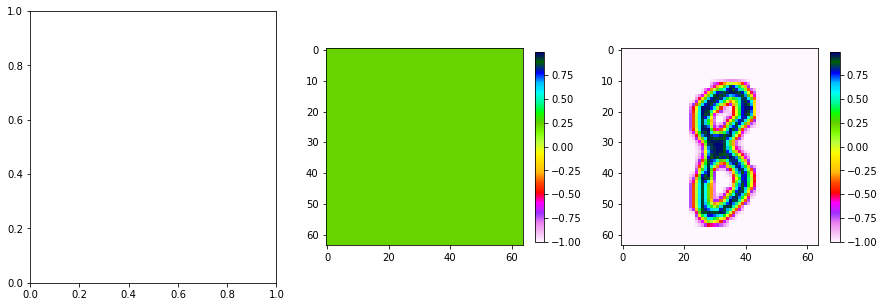

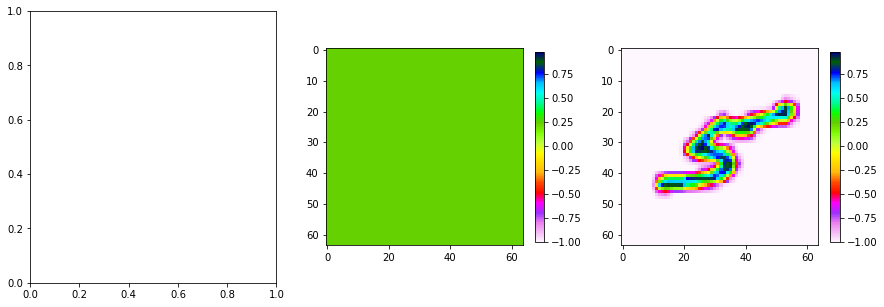

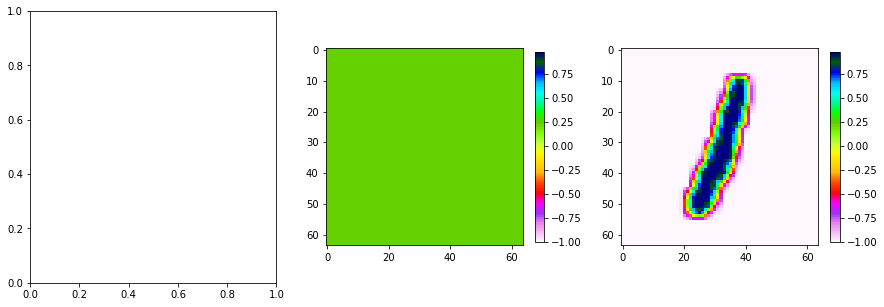

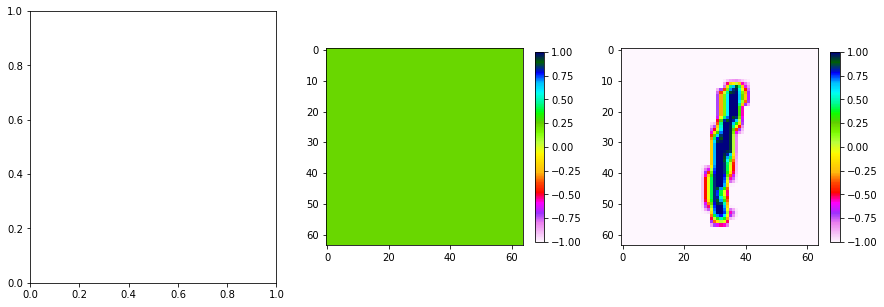

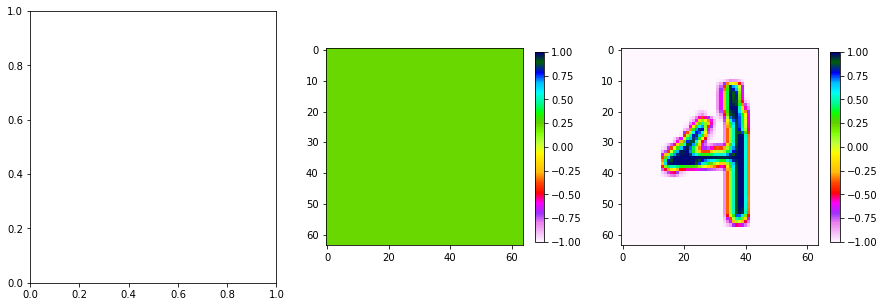

Epoch [0/30] Batch 100/938                   Loss D: -163.6259, loss G: 105.9314
(64, 1, 64, 64)


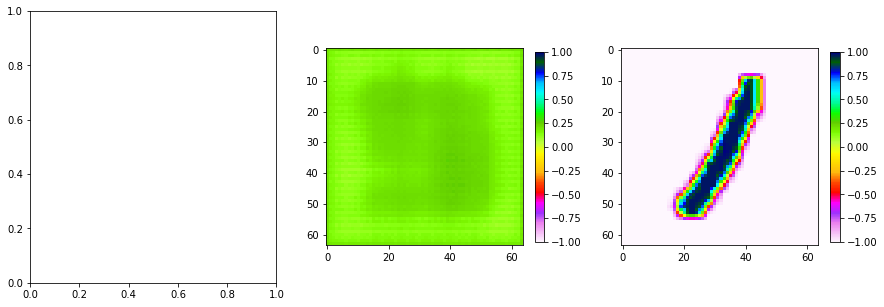

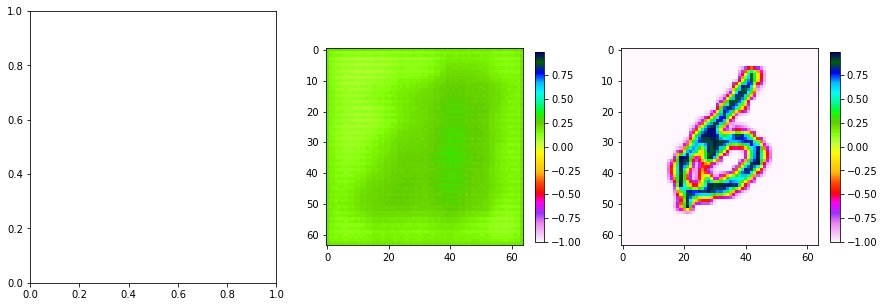

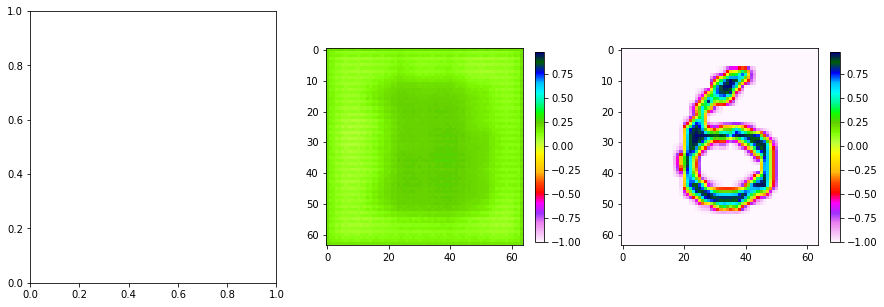

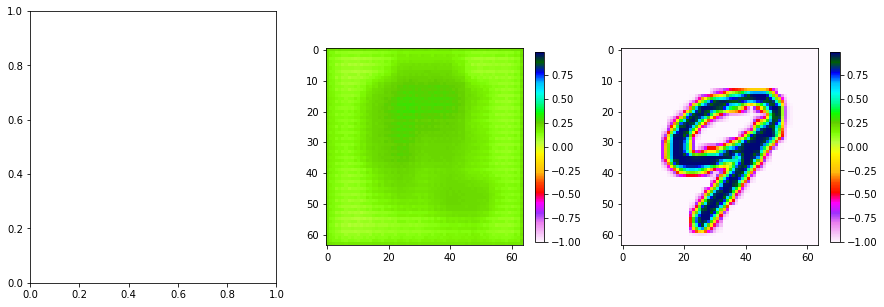

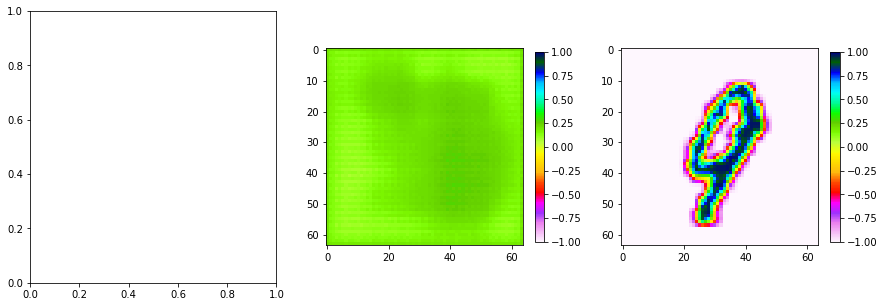

Epoch [0/30] Batch 200/938                   Loss D: -149.4878, loss G: 130.8795
(64, 1, 64, 64)


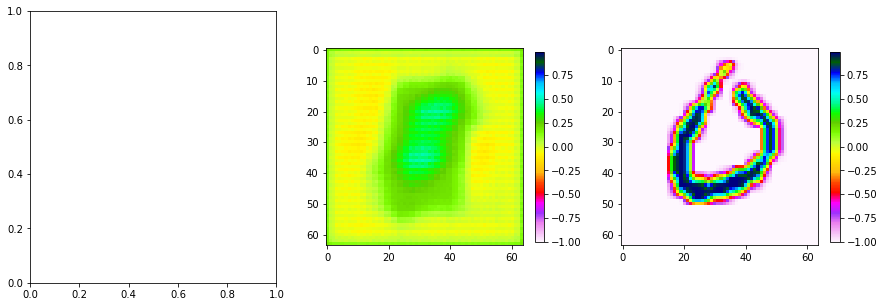

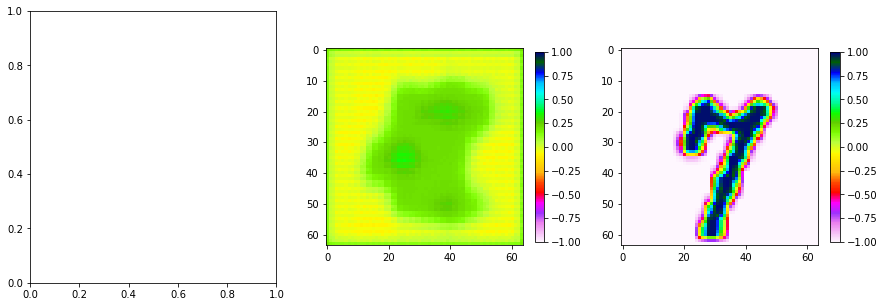

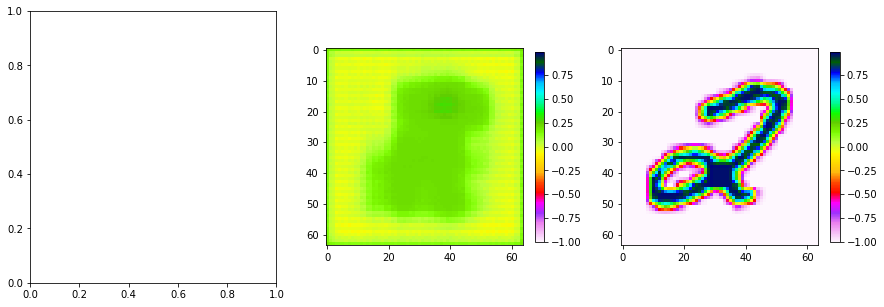

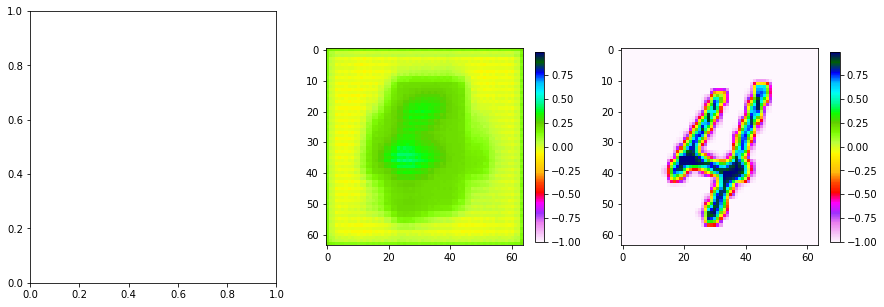

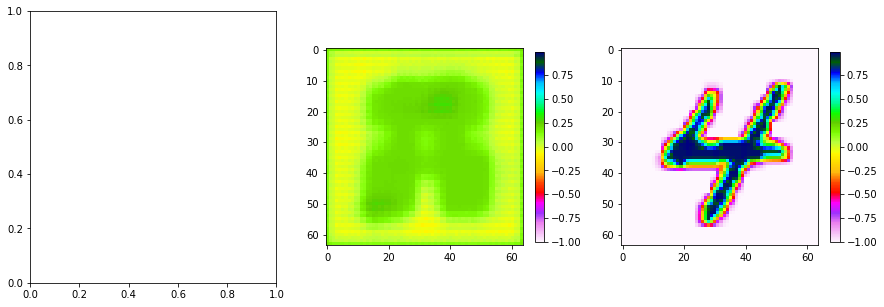

Epoch [0/30] Batch 300/938                   Loss D: -122.9443, loss G: 126.3010
(64, 1, 64, 64)


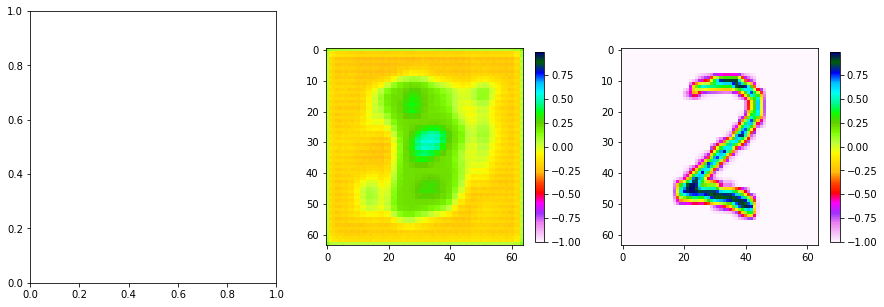

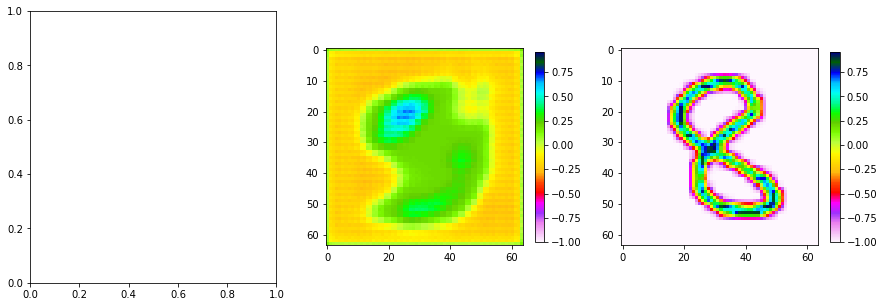

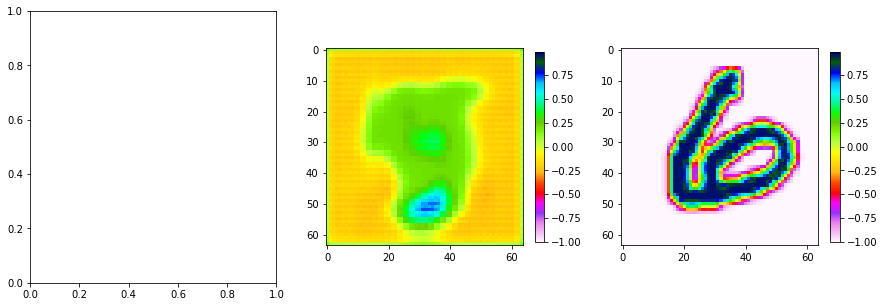

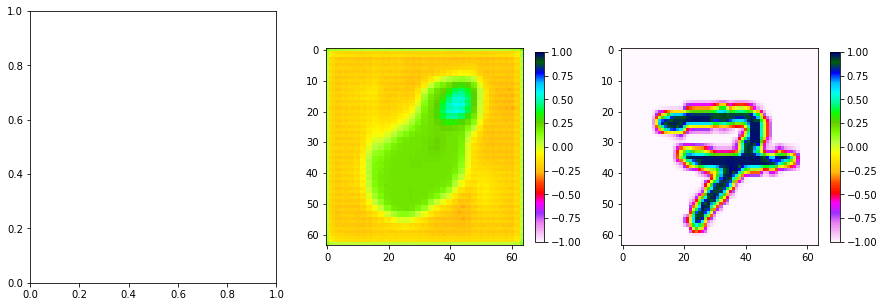

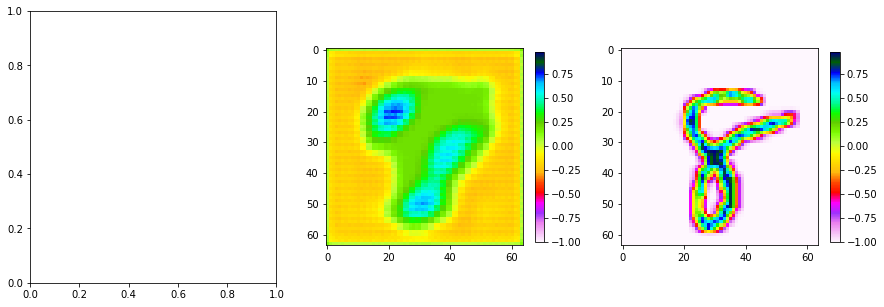

Epoch [0/30] Batch 400/938                   Loss D: -91.0874, loss G: 111.9084
(64, 1, 64, 64)


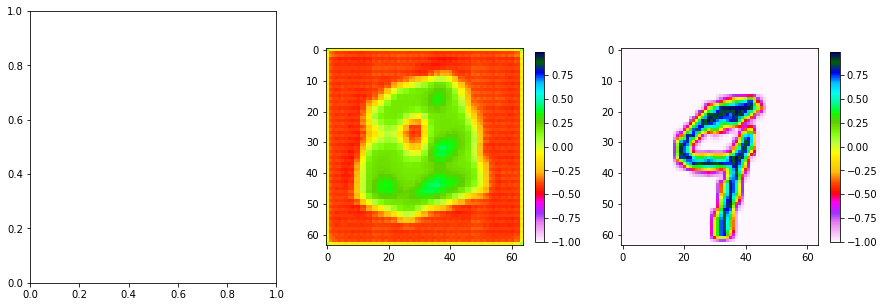

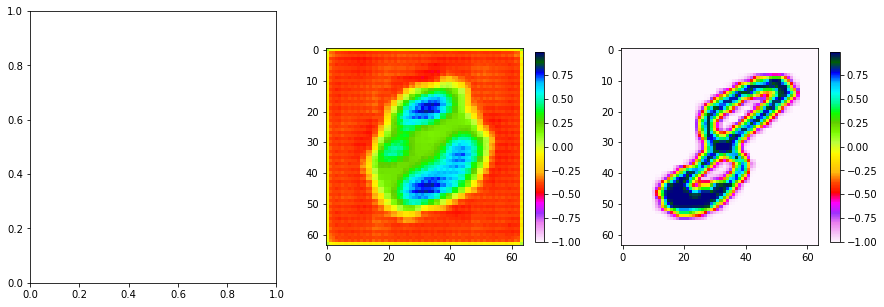

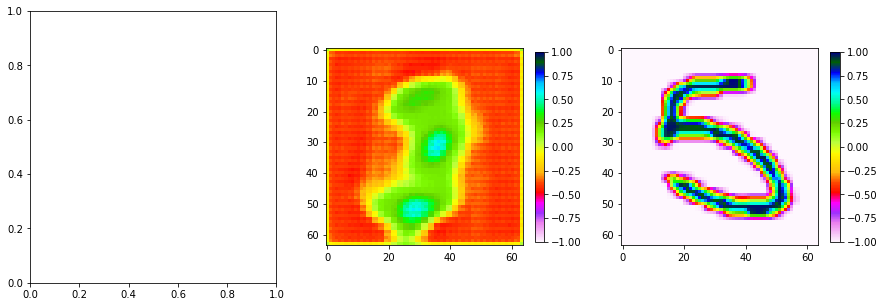

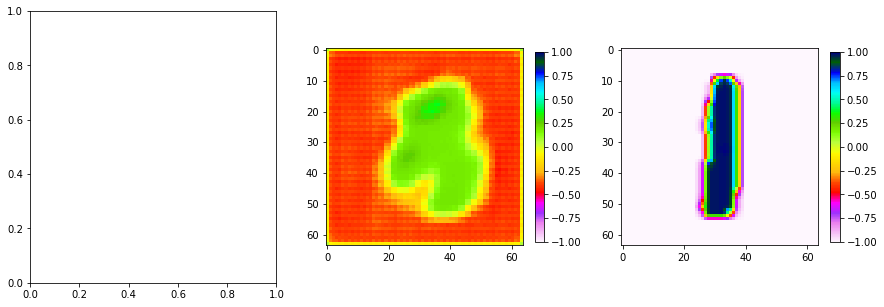

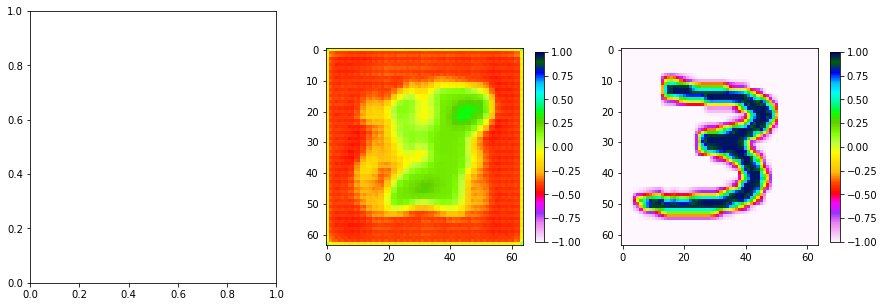

Epoch [0/30] Batch 500/938                   Loss D: -65.0291, loss G: 117.1001
(64, 1, 64, 64)


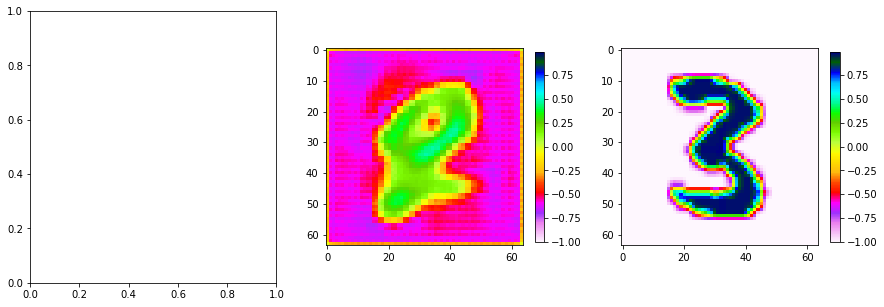

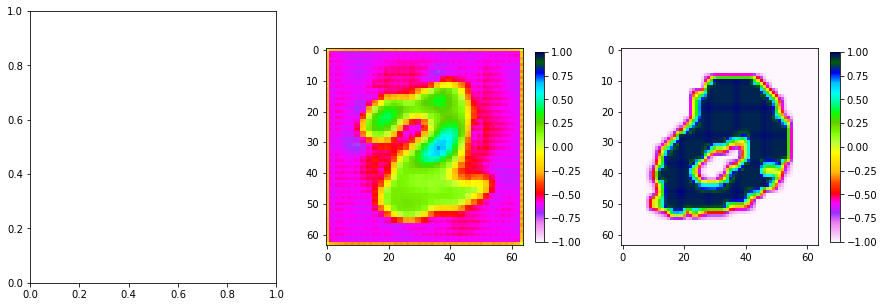

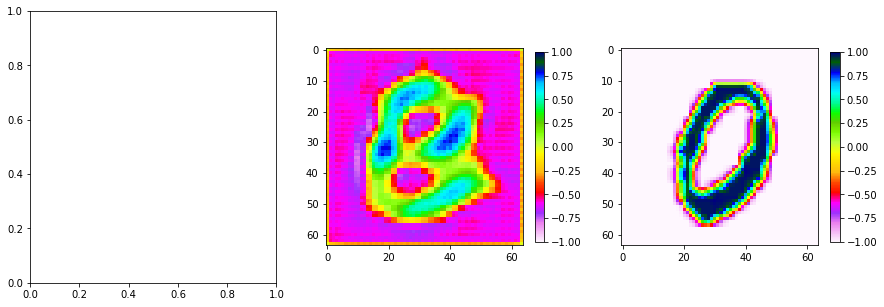

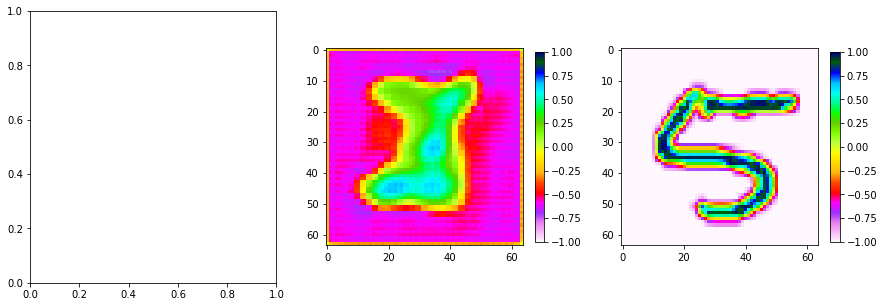

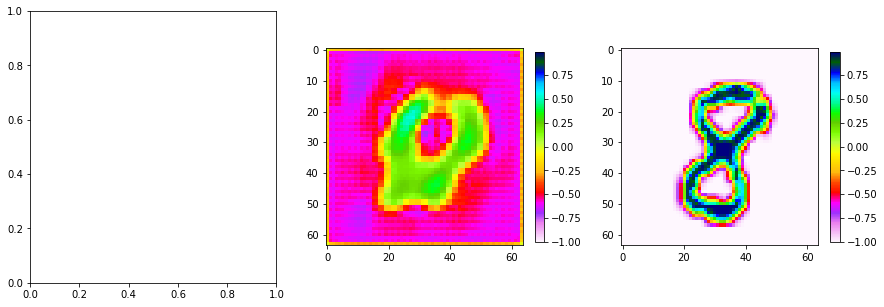

Epoch [0/30] Batch 600/938                   Loss D: -39.8950, loss G: 96.0765
(64, 1, 64, 64)


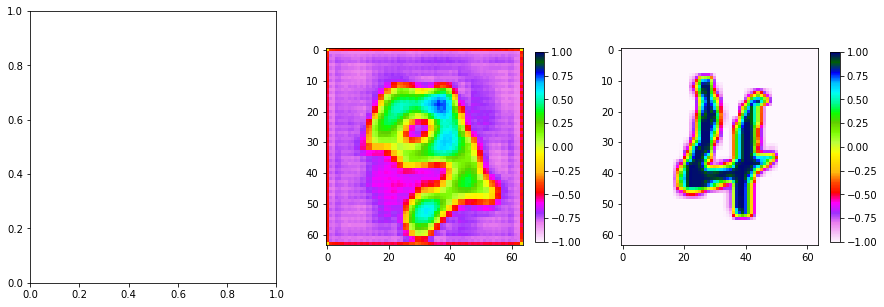

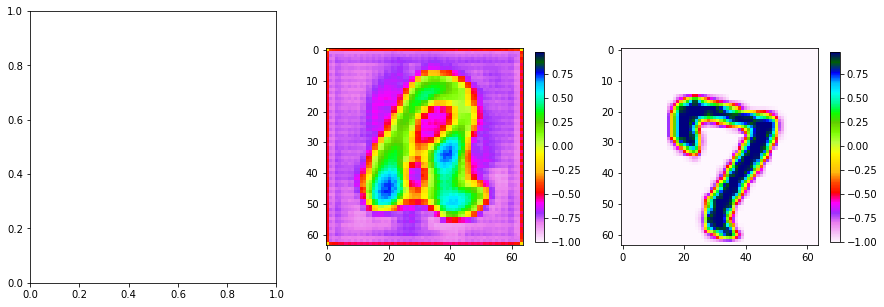

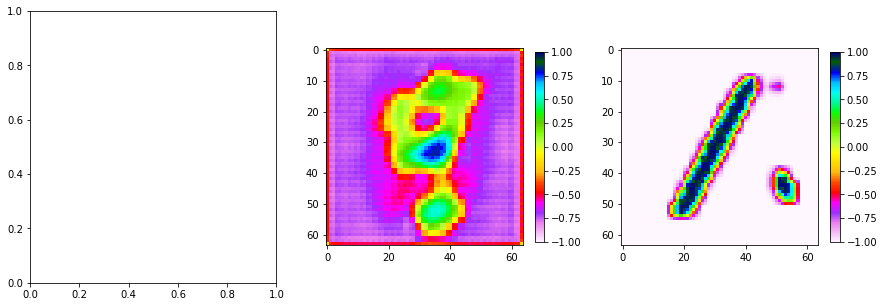

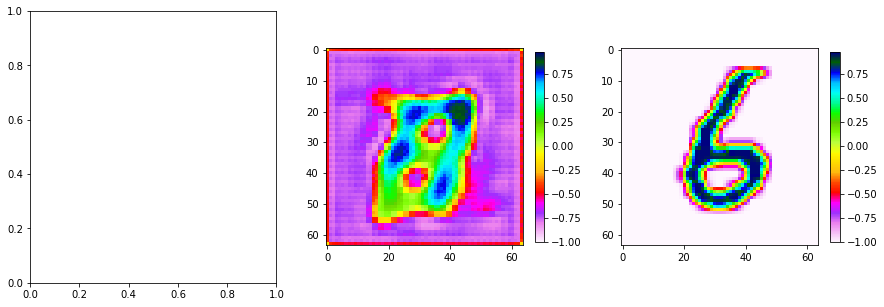

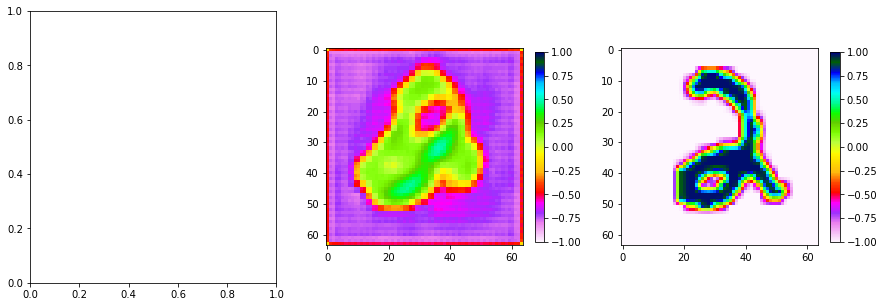

Epoch [0/30] Batch 700/938                   Loss D: -29.2290, loss G: 104.6633
(64, 1, 64, 64)


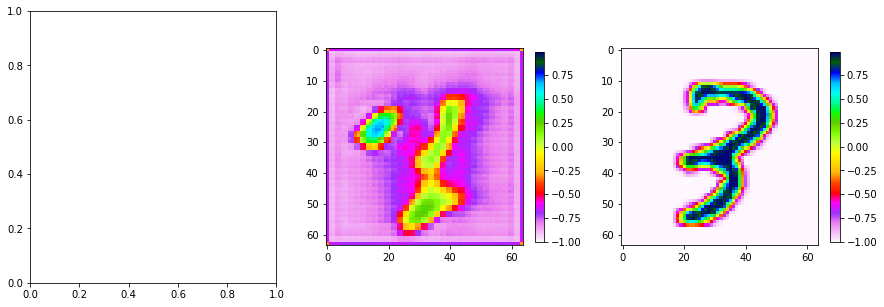

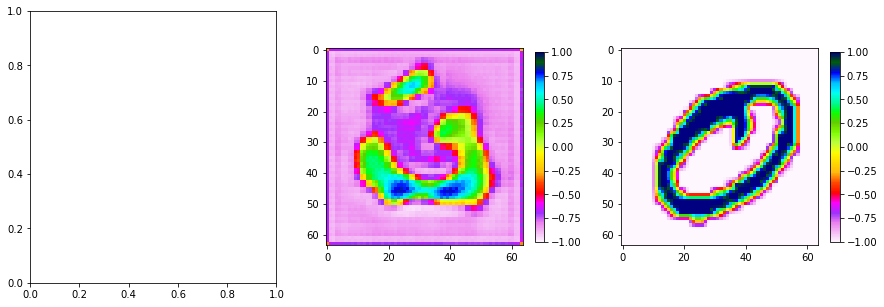

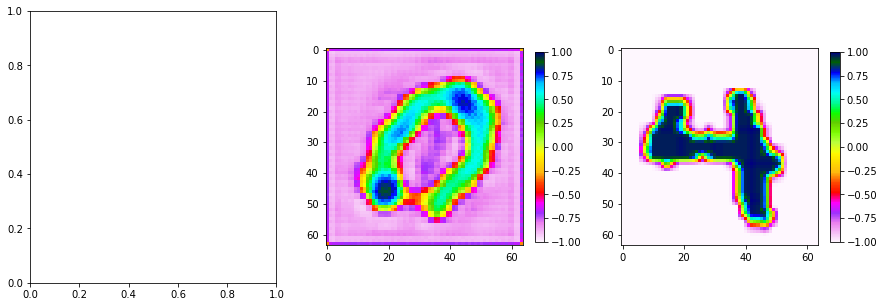

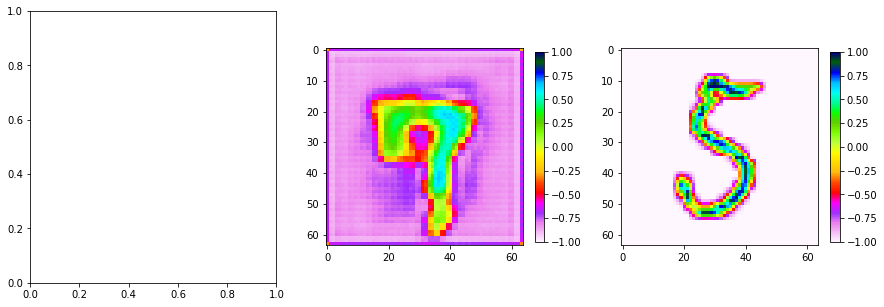

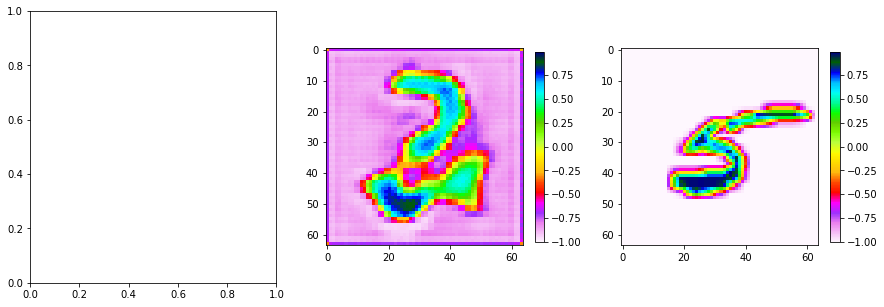

Epoch [0/30] Batch 800/938                   Loss D: -20.6947, loss G: 98.4492
(64, 1, 64, 64)


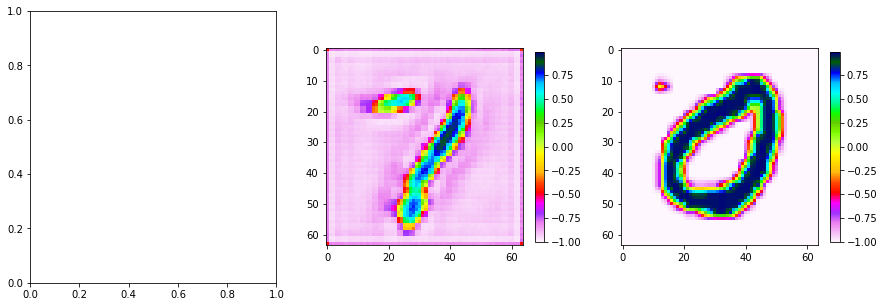

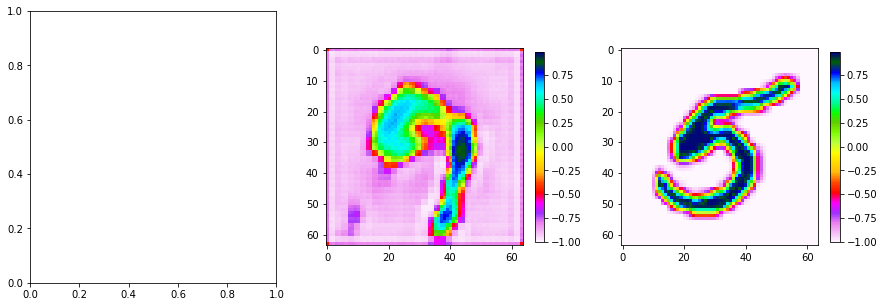

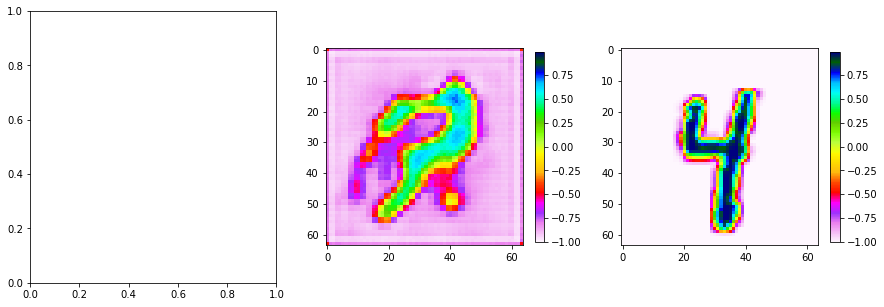

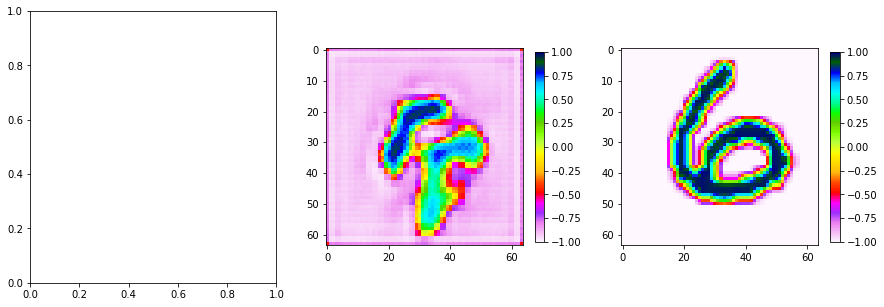

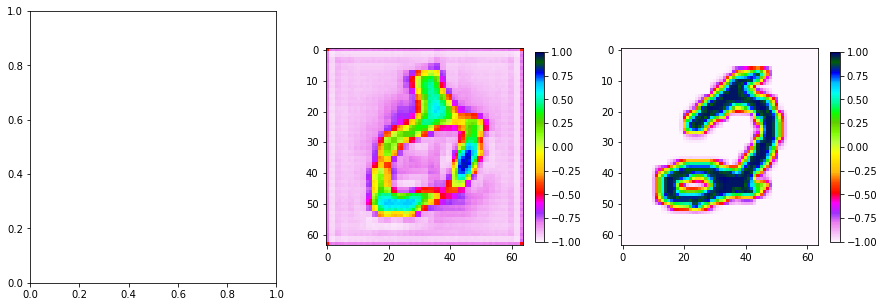

Epoch [0/30] Batch 900/938                   Loss D: -17.9091, loss G: 94.6688
(64, 1, 64, 64)


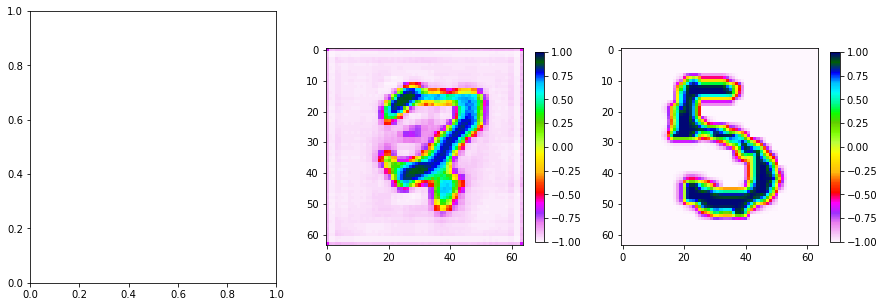

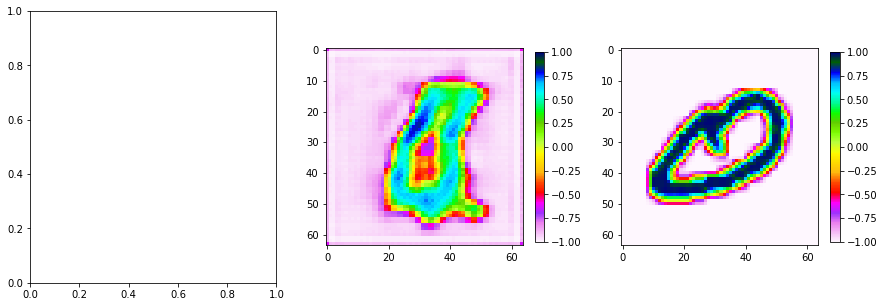

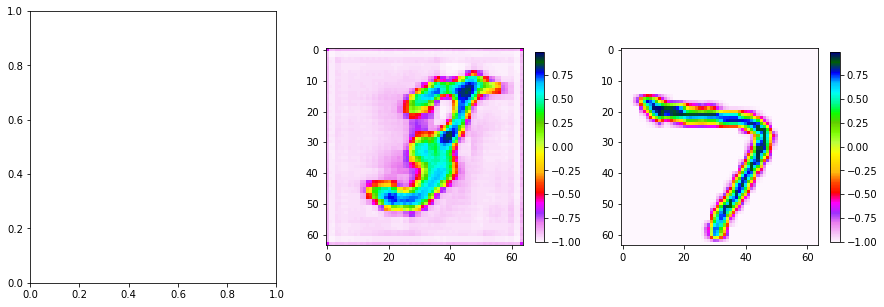

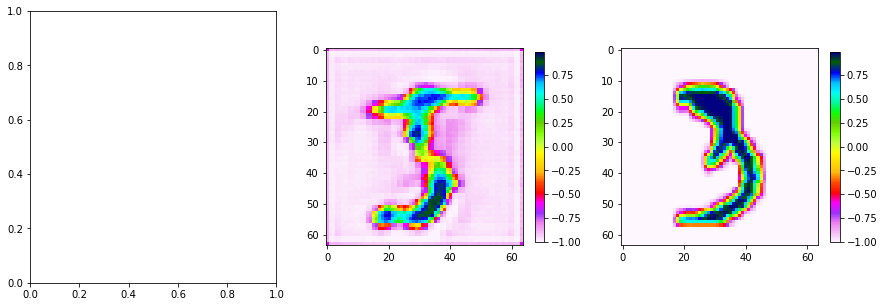

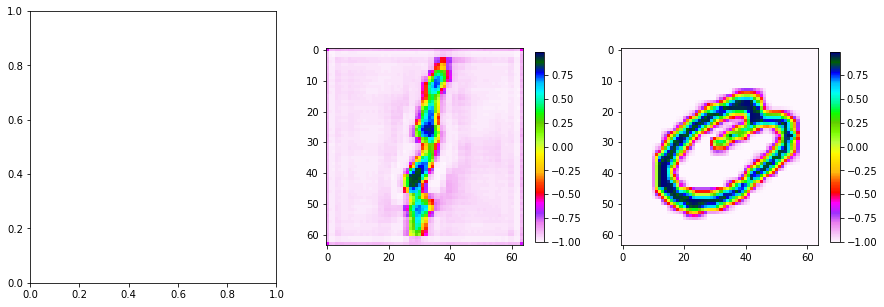

Epoch [1/30] Batch 0/938                   Loss D: -15.6078, loss G: 88.8107
(64, 1, 64, 64)


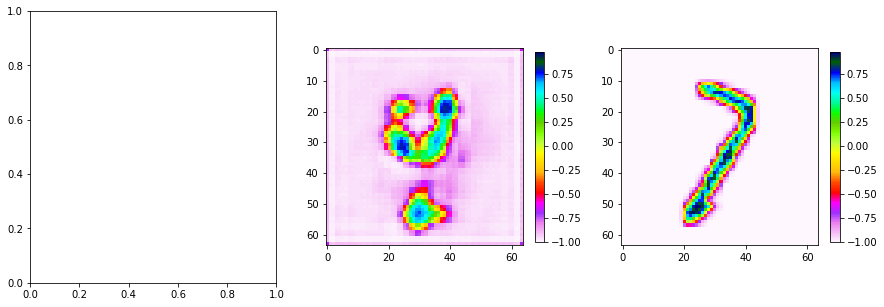

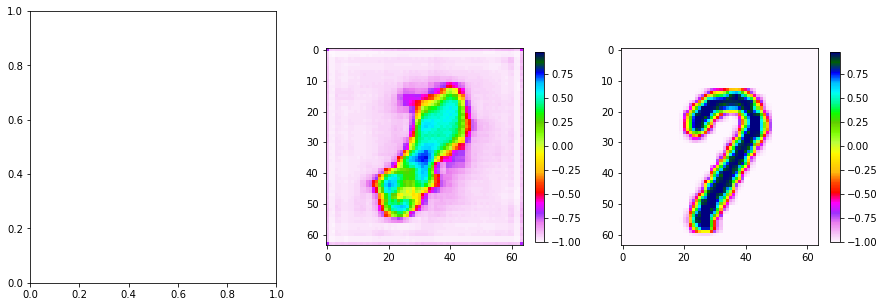

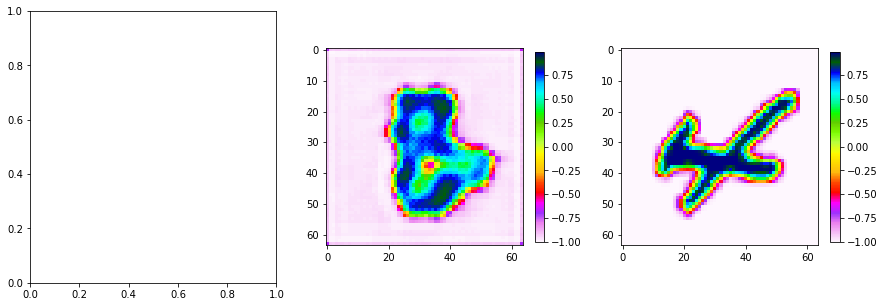

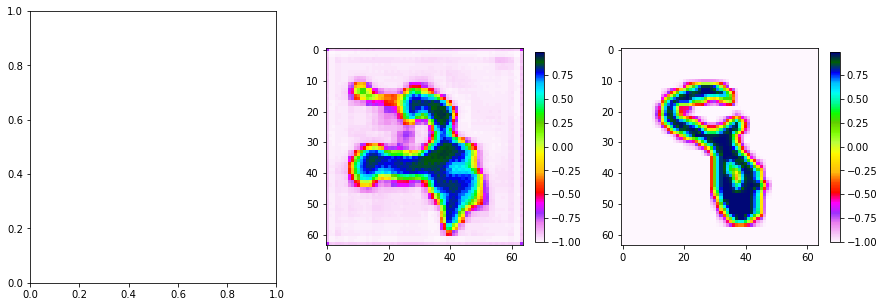

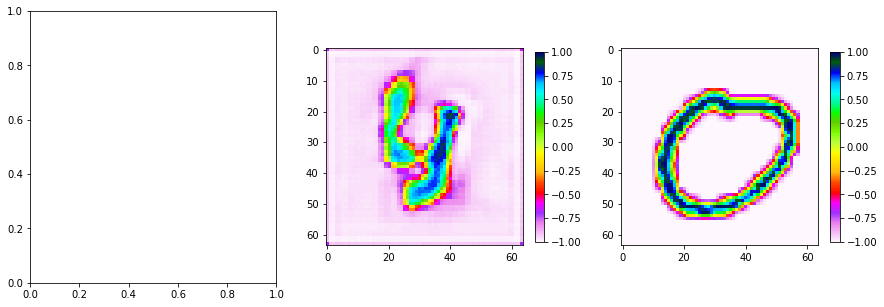

Epoch [1/30] Batch 100/938                   Loss D: -12.6479, loss G: 86.5341
(64, 1, 64, 64)


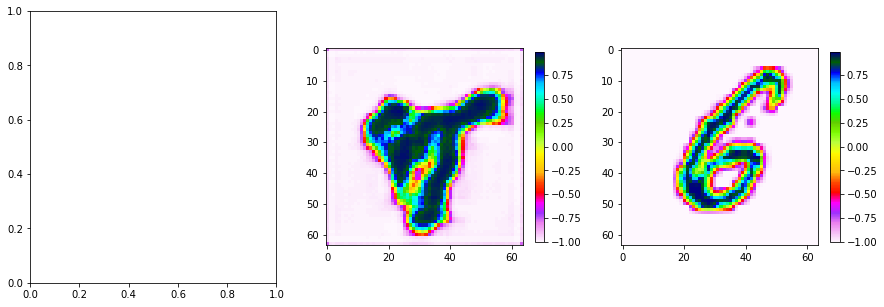

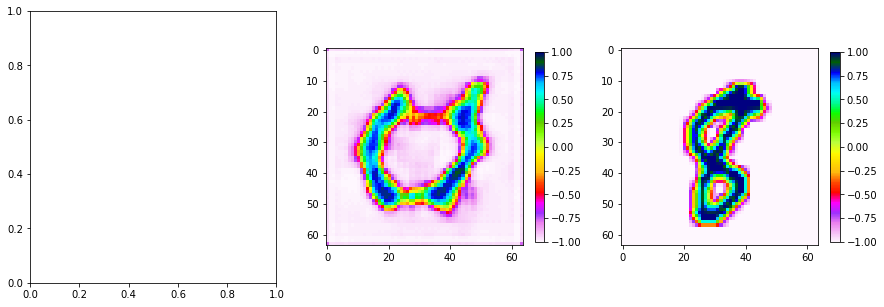

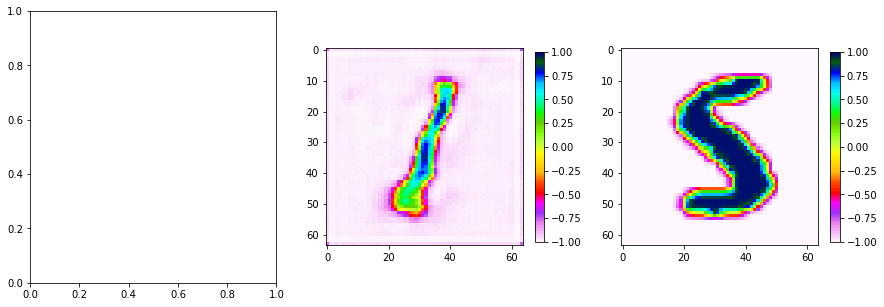

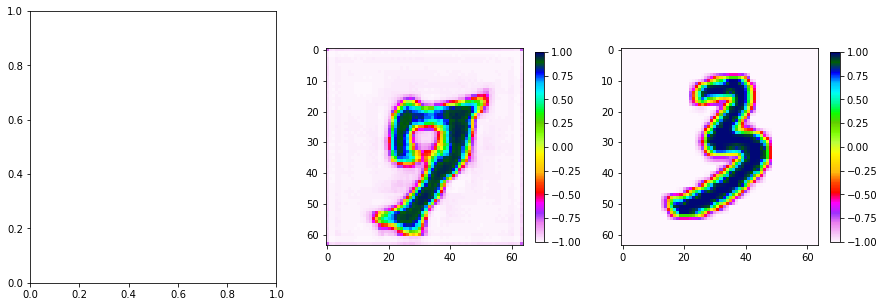

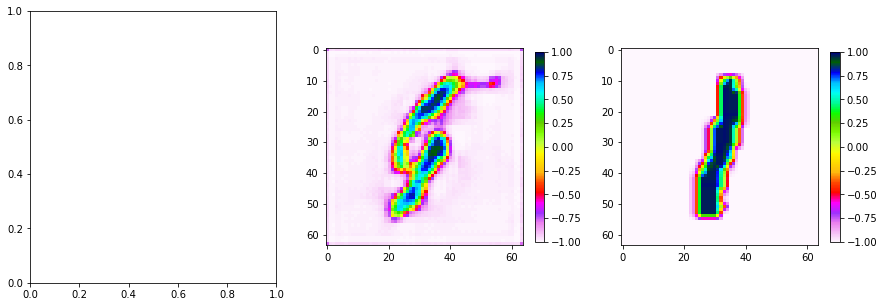

Epoch [1/30] Batch 200/938                   Loss D: -11.7900, loss G: 85.1537
(64, 1, 64, 64)


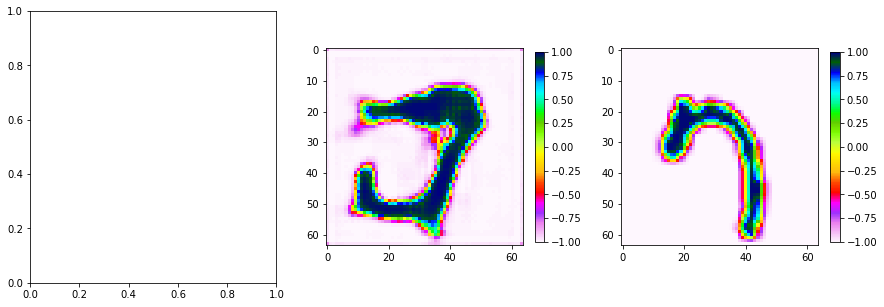

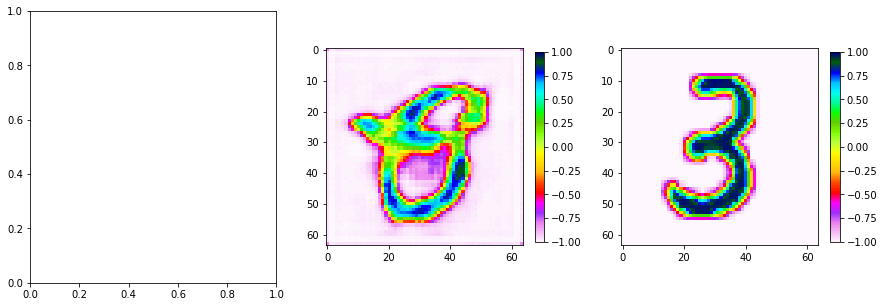

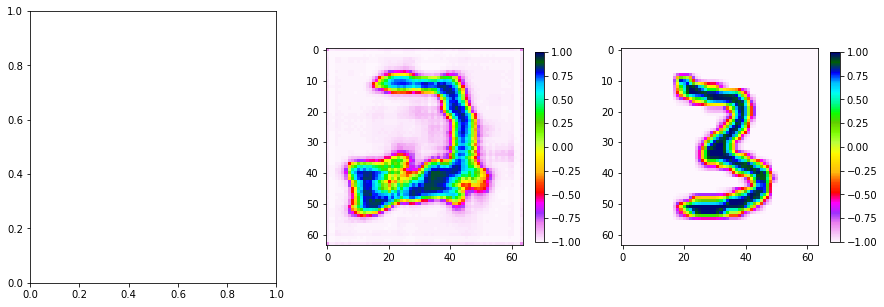

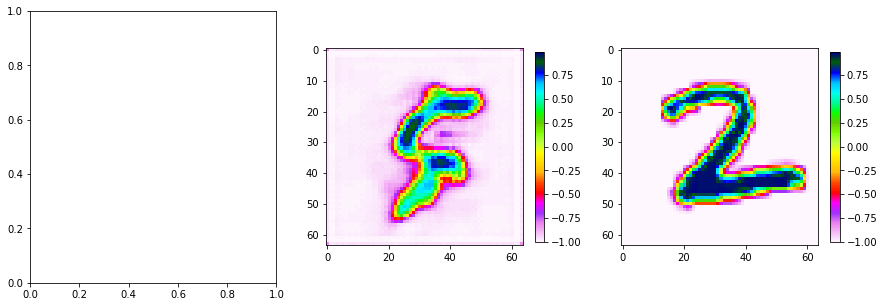

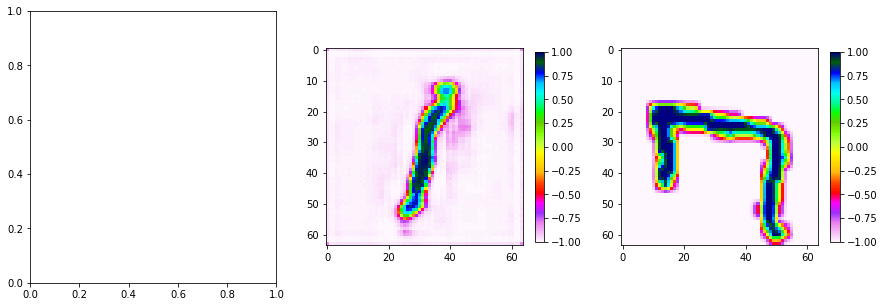

KeyboardInterrupt: 

In [195]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
        


class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            # input: N x channels_img x 64 x 64
            nn.Conv2d(
                channels_img, features_d, kernel_size=4, stride=2, padding=1
            ),
            nn.LeakyReLU(0.2),
            # _block(in_channels, out_channels, kernel_size, stride, padding)
            self._block(features_d, features_d * 2, 4, 2, 1),
            self._block(features_d * 2, features_d * 4, 4, 2, 1),
            self._block(features_d * 4, features_d * 8, 4, 2, 1),
            # After all _block img output is 4x4 (Conv2d below makes into 1x1)
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # Input: N x channels_noise x 1 x 1
            self._block(channels_noise, features_g * 16, 4, 1, 0),  # img: 4x4
            self._block(features_g * 16, features_g * 8, 4, 2, 1),  # img: 8x8
            self._block(features_g * 8, features_g * 4, 4, 2, 1),  # img: 16x16
            self._block(features_g * 4, features_g * 2, 4, 2, 1),  # img: 32x32
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1
            ),
            # Output: N x channels_img x 64 x 64
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.net(x)


def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

            
            
def gradient_penalty(critic, real, fake, device='cpu'):
    BATCH_SIZE, C, H, W = real.shape
    epsilon = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1,C,H,W).to(device)
    interpolated_images = real*epsilon + fake*(1-epsilon)
    
    mixed_scores = critic(interpolated_images)
    gradient = torch.autograd.grad(
                inputs=interpolated_images,
                outputs=mixed_scores, 
                grad_outputs = torch.ones_like(mixed_scores), 
                create_graph=True, 
                retain_graph = True)[0]
    
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1)**2)
    return gradient_penalty
    
    
        
"""
Training of DCGAN network with WGAN loss
"""

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

# Hyperparameters etc
device = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
IMAGE_SIZE = 64
CHANNELS_IMG = 1
Z_DIM = 100
NUM_EPOCHS = 30
FEATURES_CRITIC = 32 #64
FEATURES_GEN = 32 # 64
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10

transforms = transforms.Compose(
    [
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
        ),
    ]
)

dataset = datasets.MNIST(root="dataset/", transform=transforms, download=True)
#comment mnist and uncomment below if you want to train on CelebA dataset
# dataset = datasets.CelebA(root="dataset/", transform=transforms, download=True)
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

# initialize gen and disc/critic
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
critic = Discriminator(CHANNELS_IMG, FEATURES_CRITIC).to(device)
initialize_weights(gen)
initialize_weights(critic) 

# initializate optimizer
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

# for tensorboard plotting
fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)
writer_real = SummaryWriter(f"logs/real")
writer_fake = SummaryWriter(f"logs/fake")
step = 0

gen.train()
critic.train()

for epoch in range(NUM_EPOCHS):
    # Target labels not needed! <3 unsupervised
    for batch_idx, (real, _) in enumerate(loader):
        real = real.to(device)
        cur_batch_size = real.shape[0]

        # Train Critic: max E[critic(real)] - E[critic(fake)]
        for _ in range(CRITIC_ITERATIONS):
            noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(device)
            fake = gen(noise)
            critic_real = critic(real).reshape(-1)
            critic_fake = critic(fake).reshape(-1)
            gp = gradient_penalty(critic, real, fake, device=device)
            loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP*gp
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        gen_fake = critic(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Print losses occasionally and print to tensorboard
        if batch_idx % 100 == 0 and batch_idx >= 0:
            gen.eval()
            critic.eval()
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(loader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )
            noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(device)
            
            plot_sample(noise, real, gen, k=5)

            step += 1
            gen.train()
            critic.train()

# Conditional WGAN-GP

Epoch [0/30] Batch 0/938                   Loss D: -6.0052, loss G: 4.5307


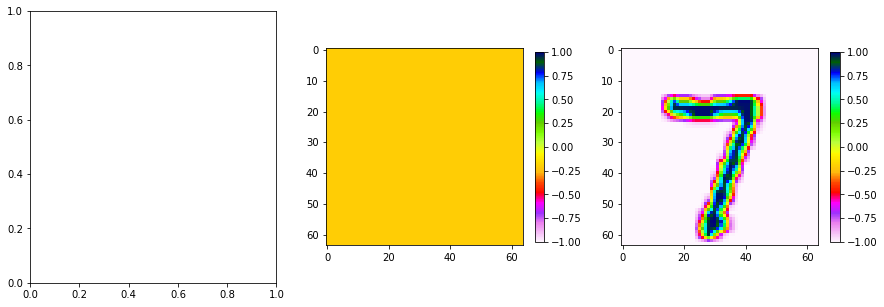

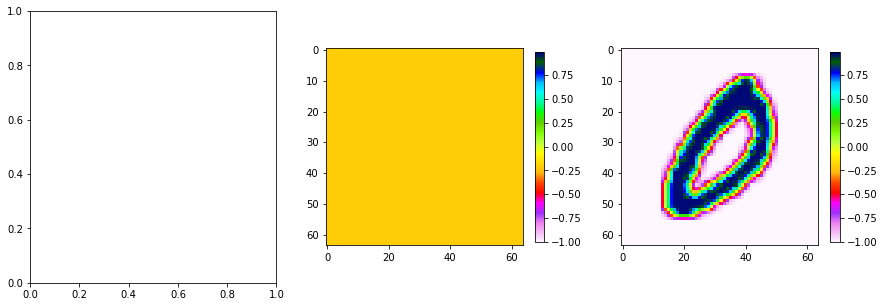

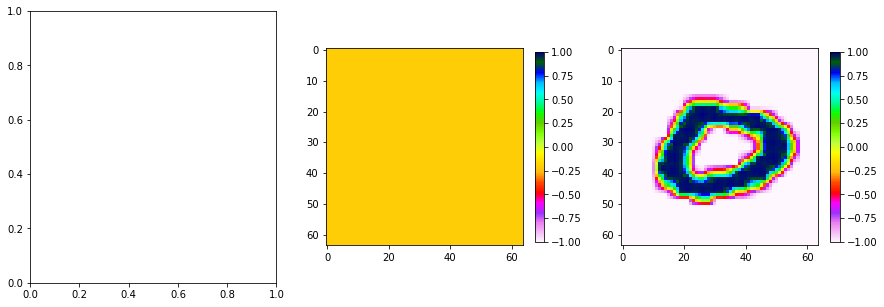

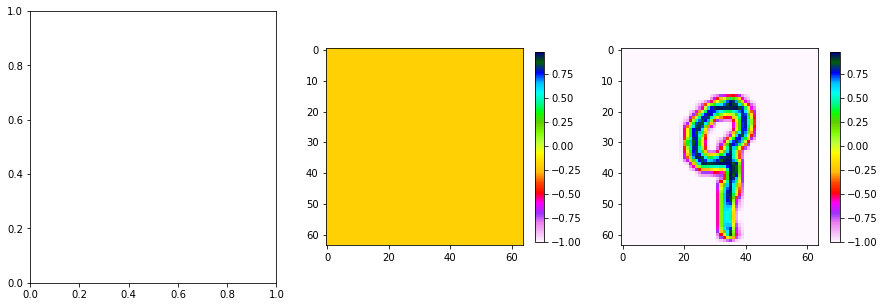

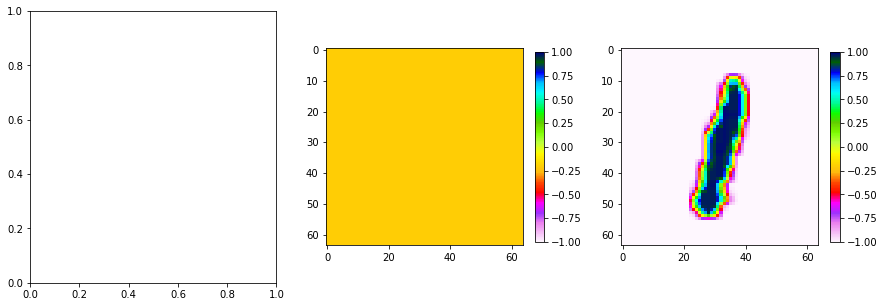

Epoch [0/30] Batch 100/938                   Loss D: -96.3221, loss G: 85.5692


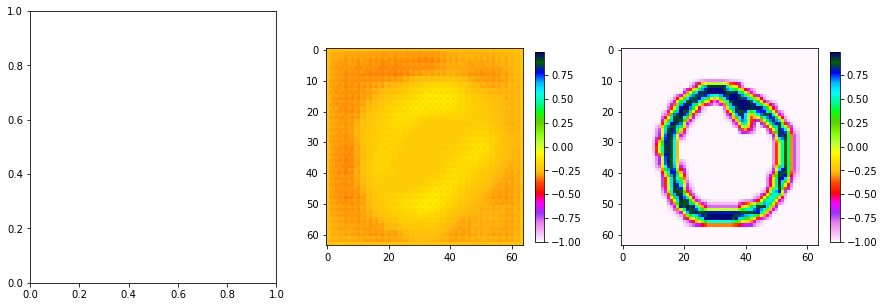

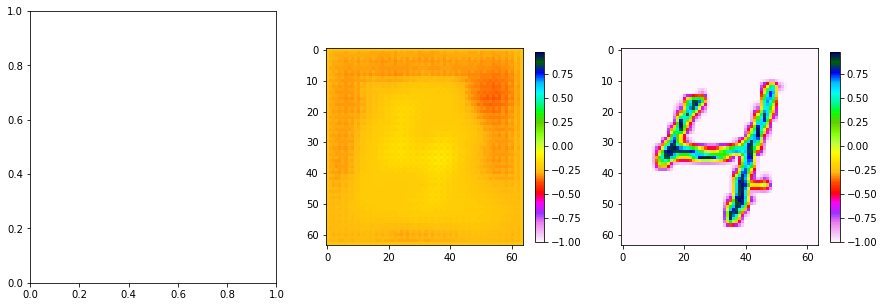

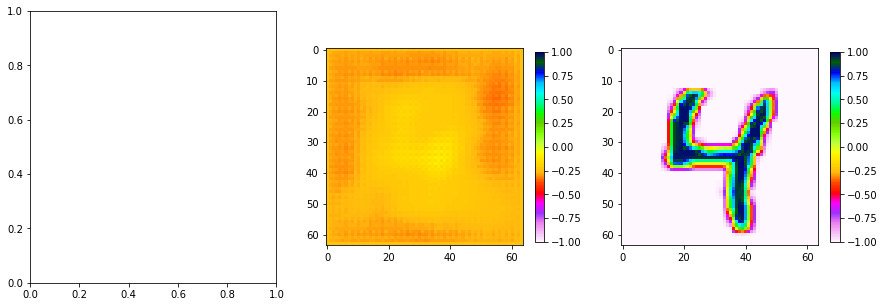

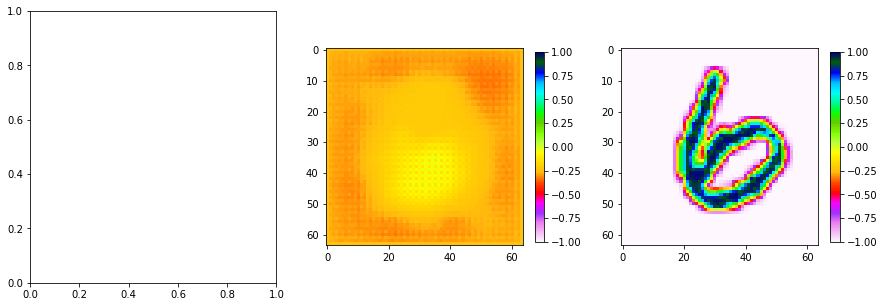

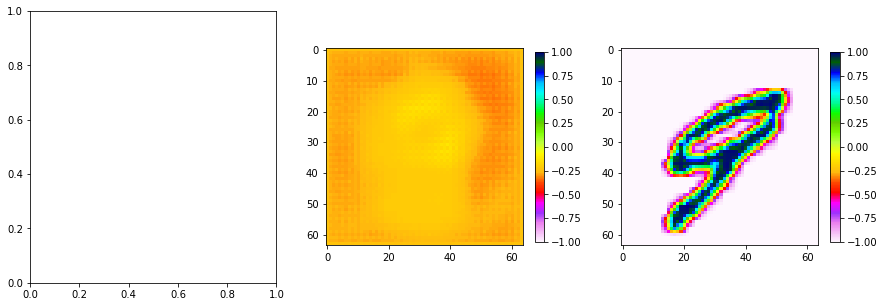

Epoch [0/30] Batch 200/938                   Loss D: -81.5086, loss G: 89.2323


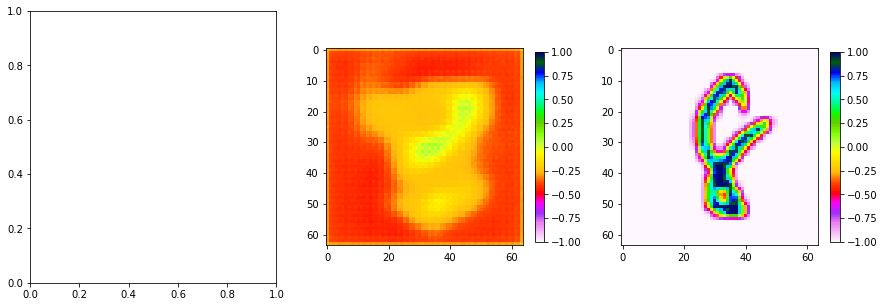

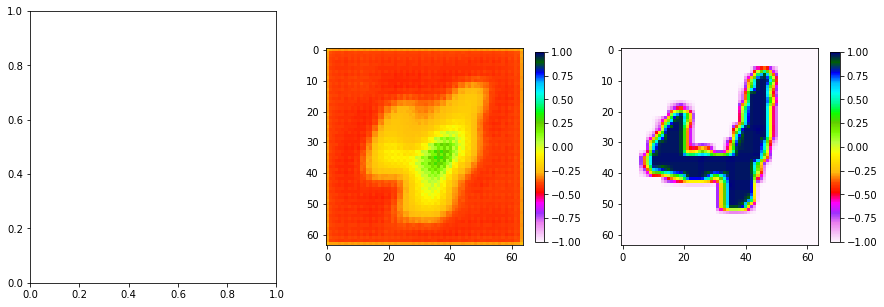

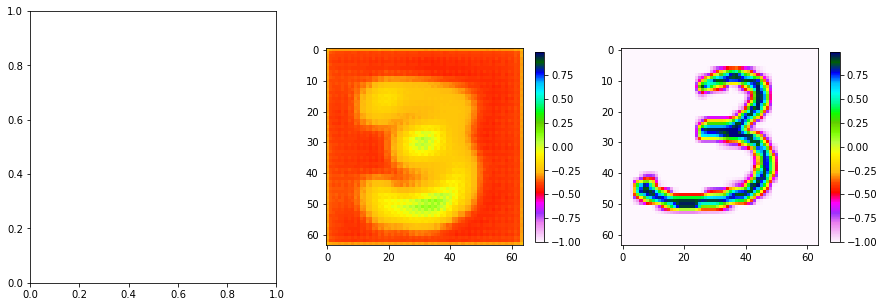

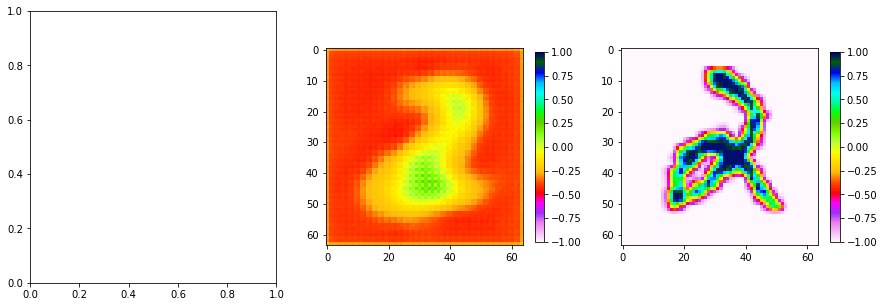

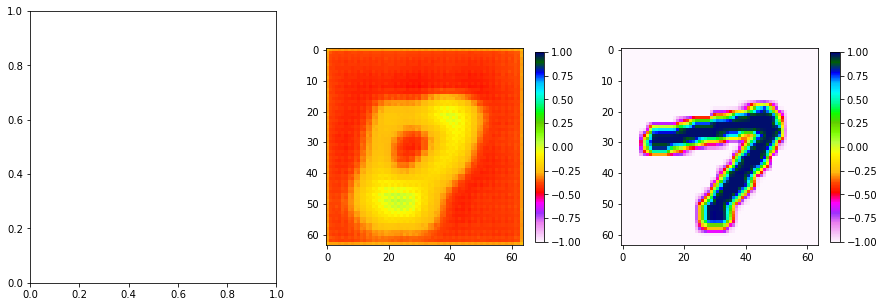

Epoch [0/30] Batch 300/938                   Loss D: -63.8896, loss G: 78.9840


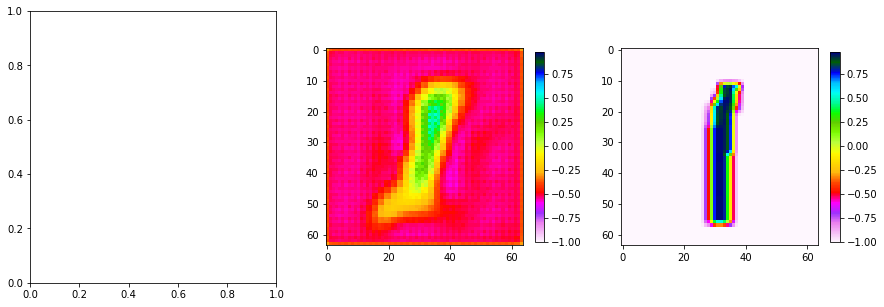

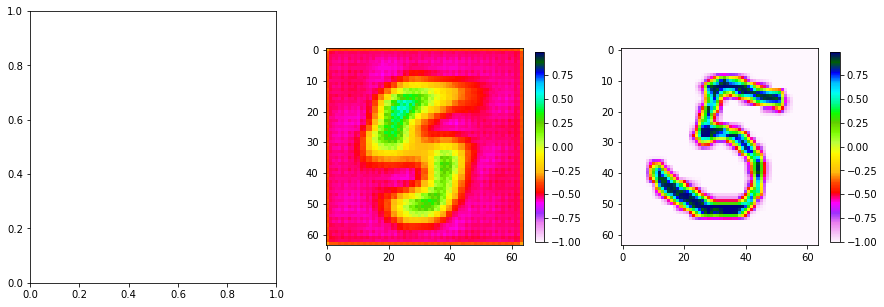

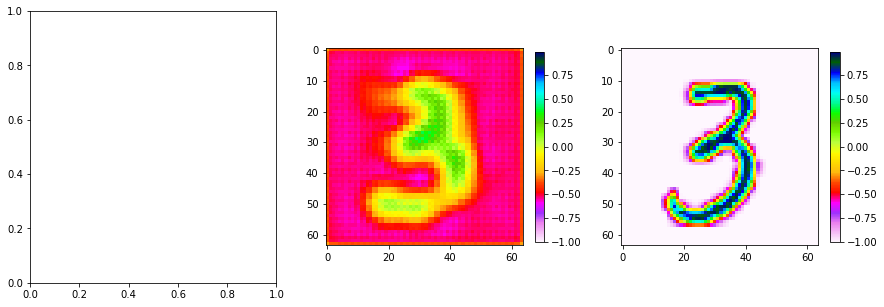

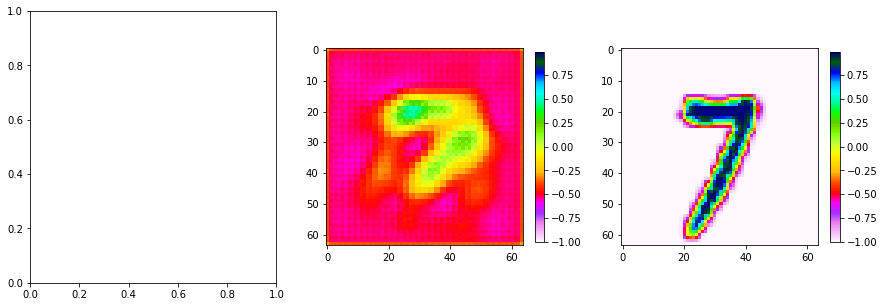

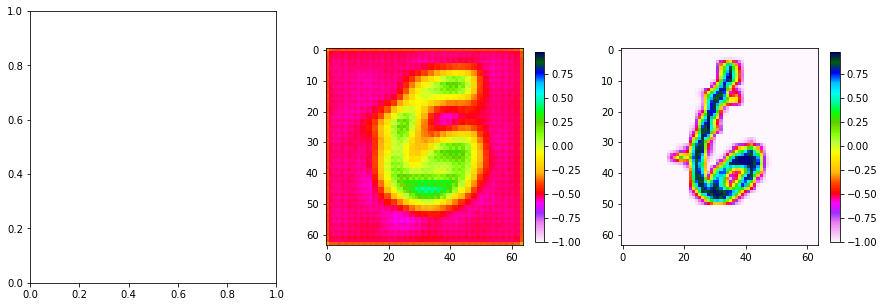

Epoch [0/30] Batch 400/938                   Loss D: -45.0531, loss G: 72.3385


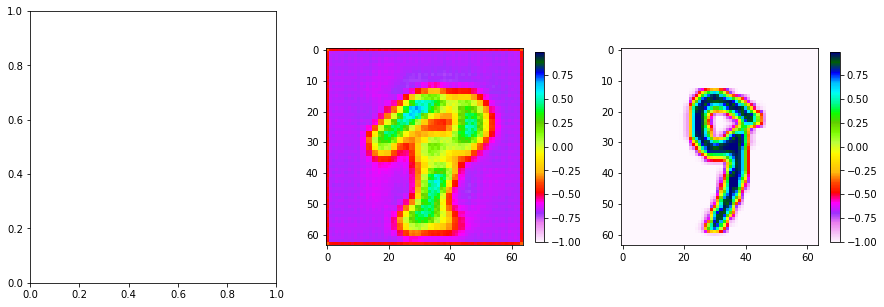

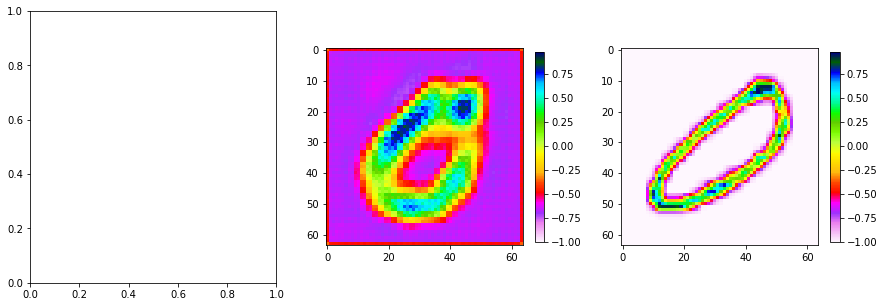

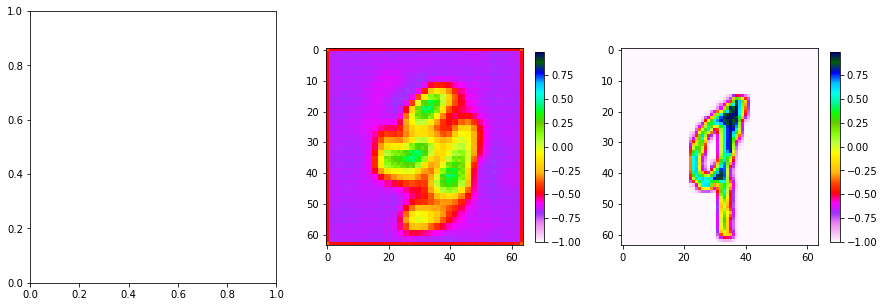

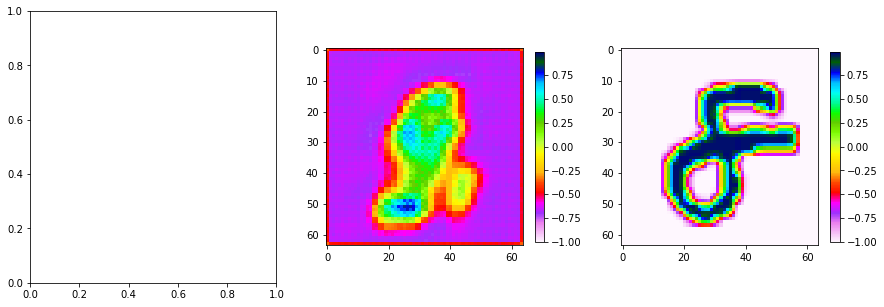

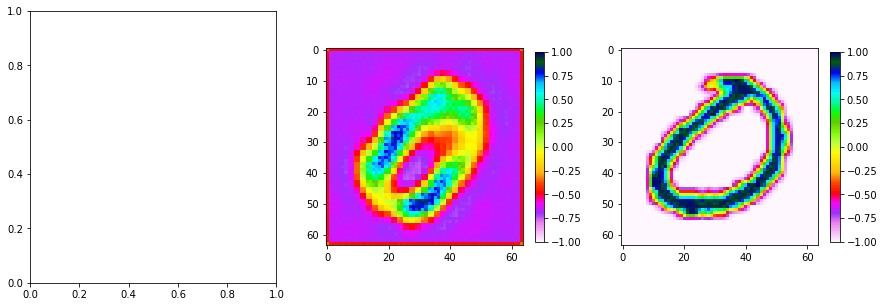

Epoch [0/30] Batch 500/938                   Loss D: -32.5934, loss G: 72.1590


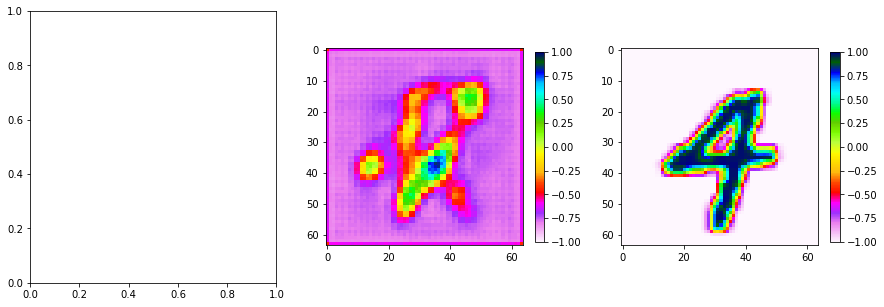

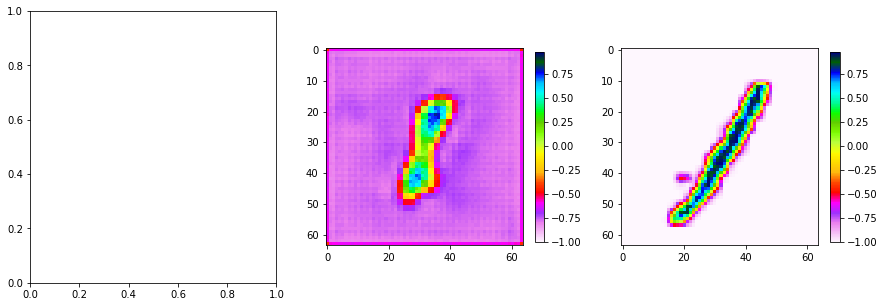

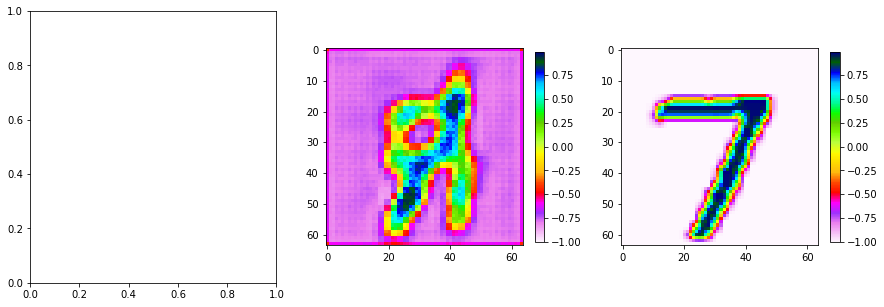

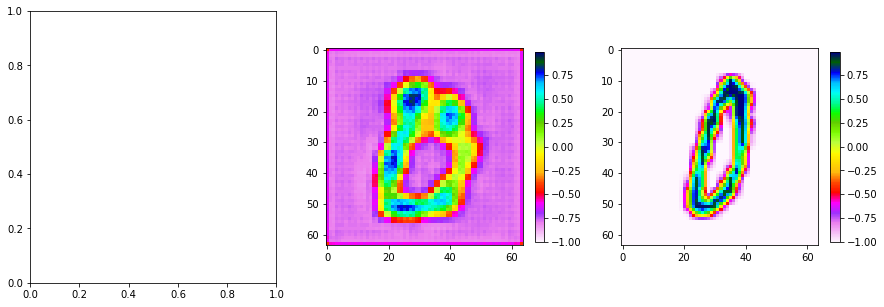

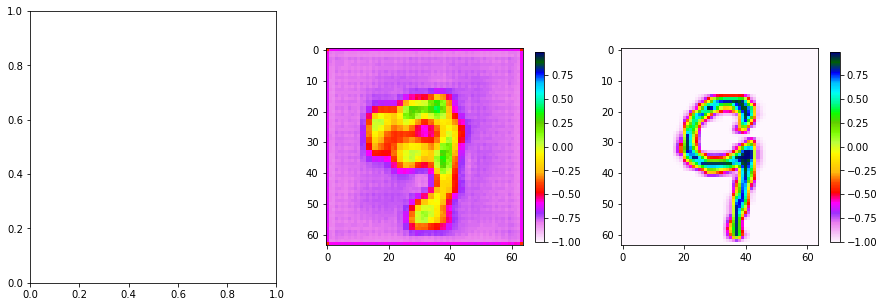

Epoch [0/30] Batch 600/938                   Loss D: -23.8306, loss G: 76.6613


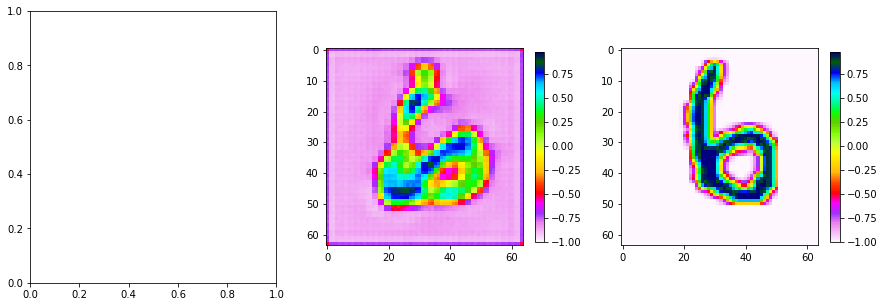

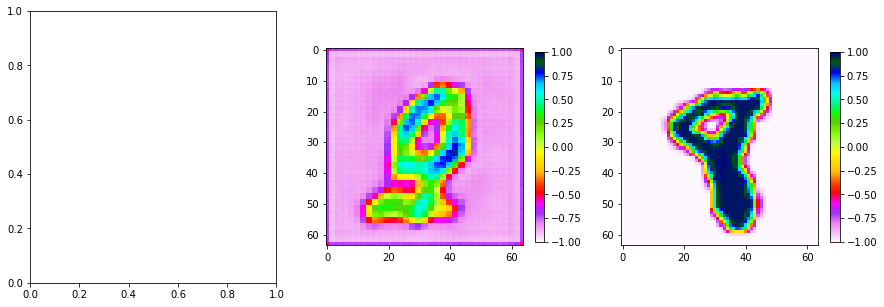

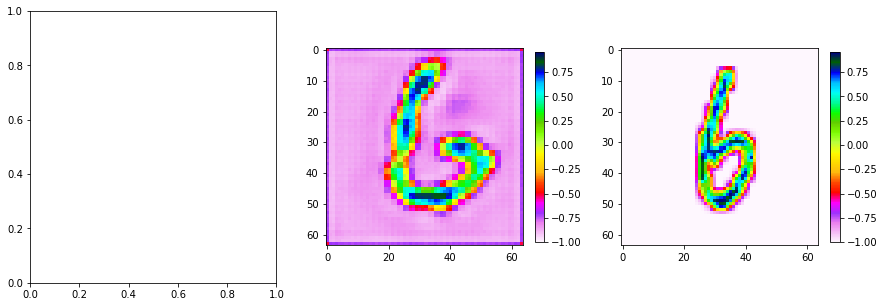

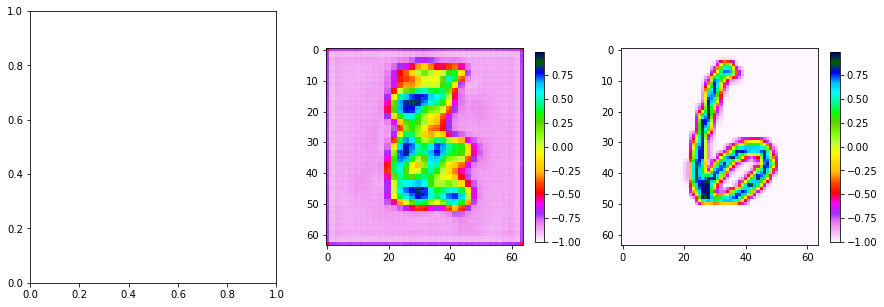

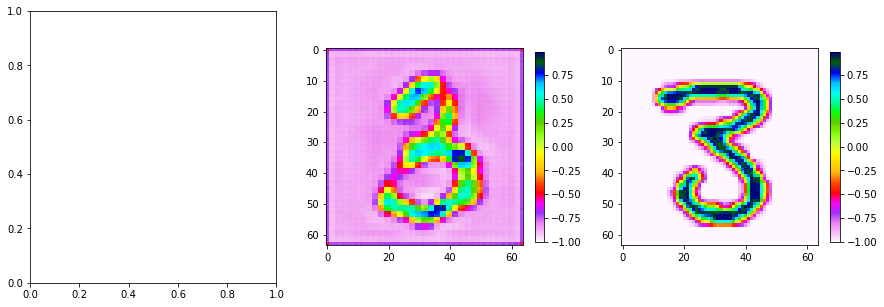

Epoch [0/30] Batch 700/938                   Loss D: -16.7718, loss G: 79.7532


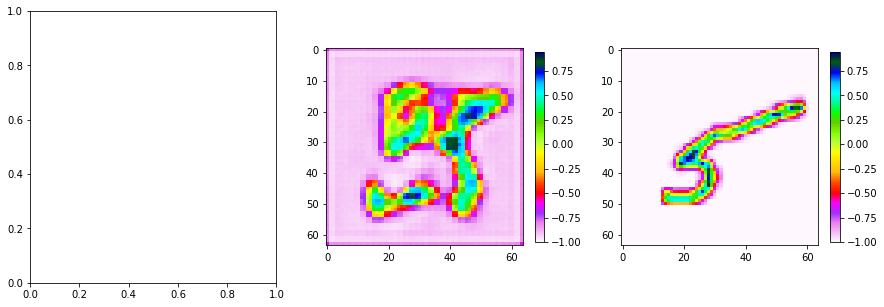

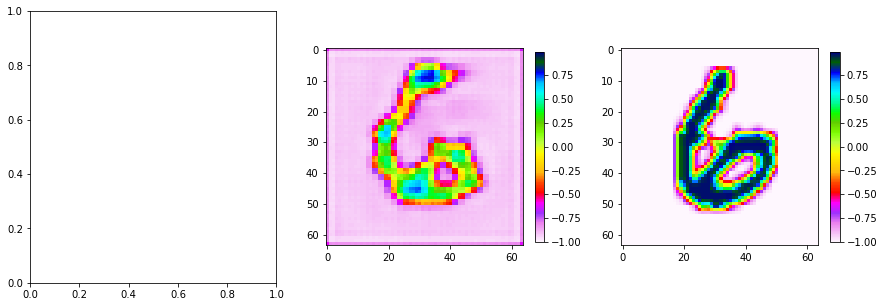

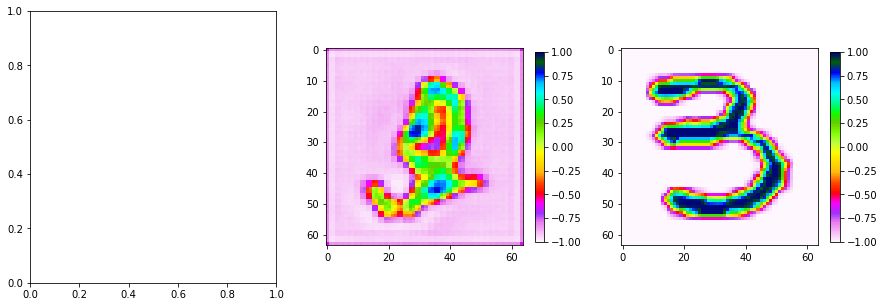

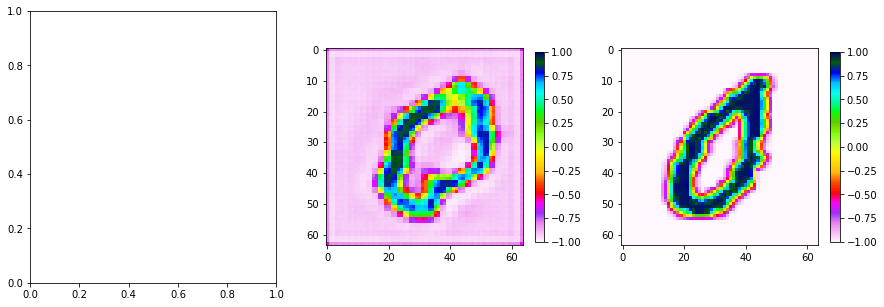

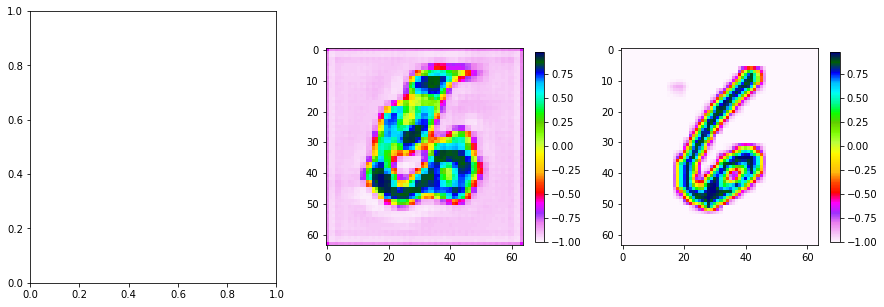

Epoch [0/30] Batch 800/938                   Loss D: -12.5166, loss G: 79.4707


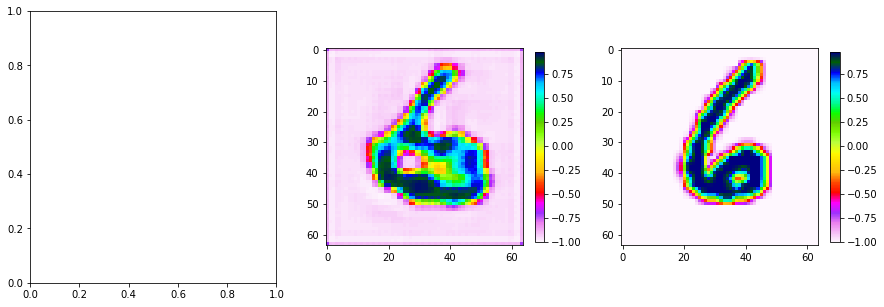

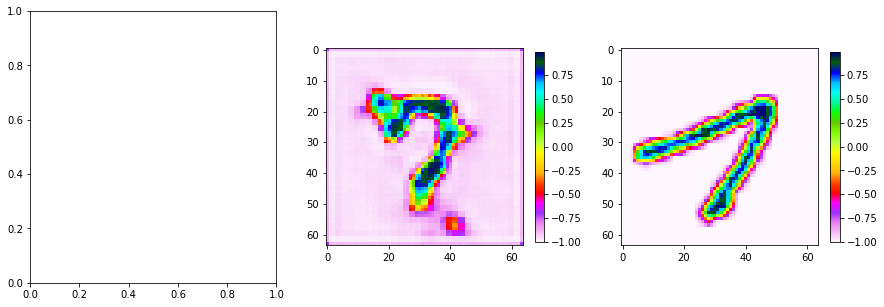

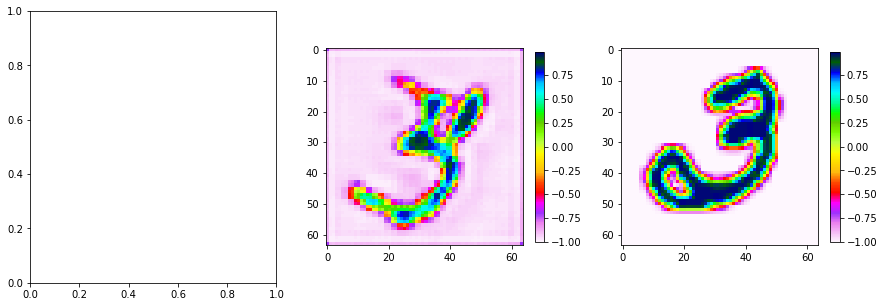

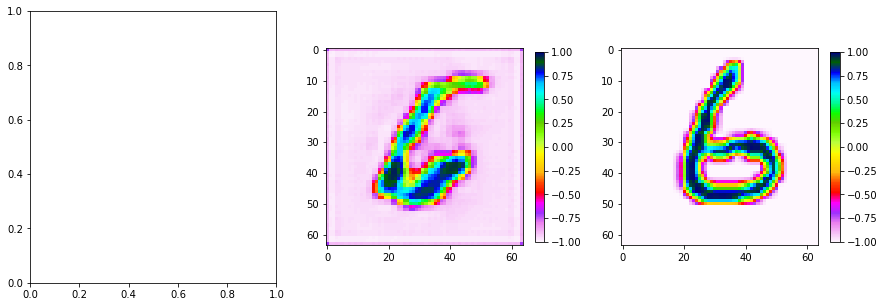

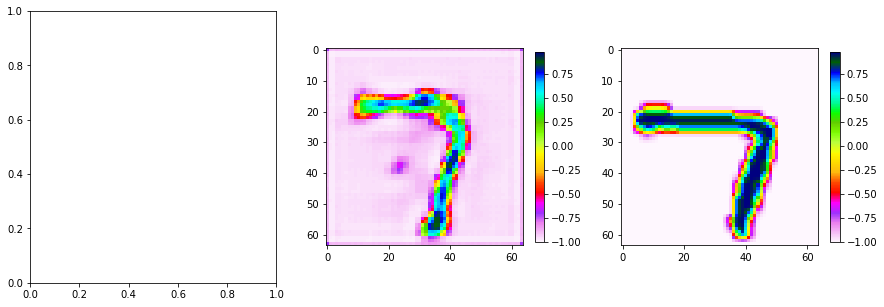

Epoch [0/30] Batch 900/938                   Loss D: -10.3792, loss G: 77.7008


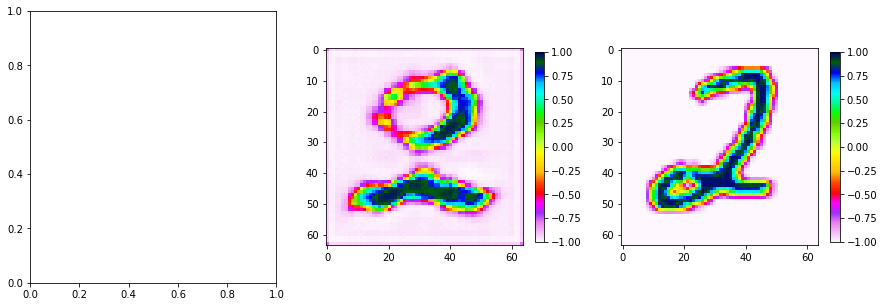

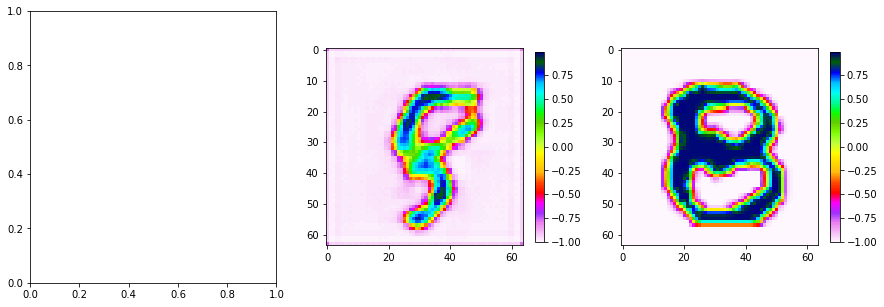

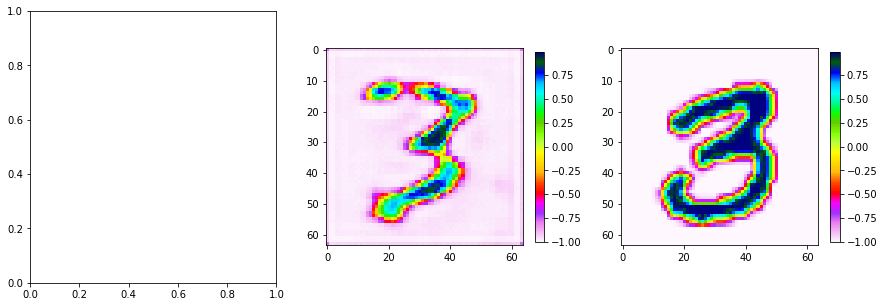

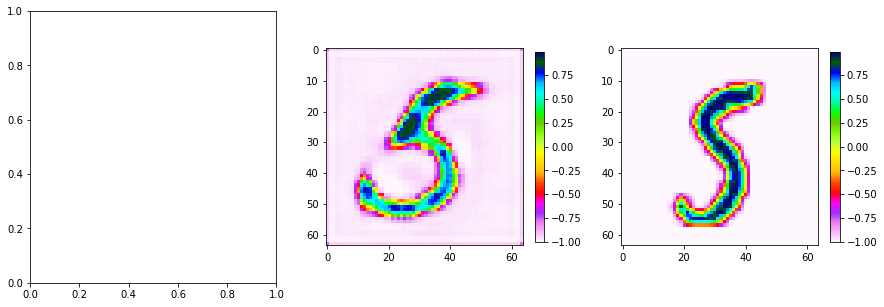

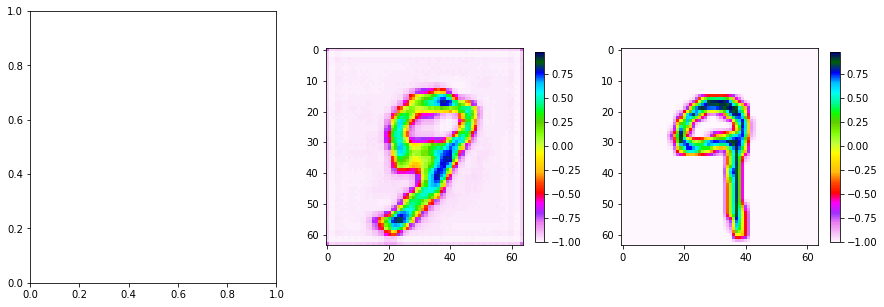

Epoch [1/30] Batch 0/938                   Loss D: -11.2964, loss G: 80.0029


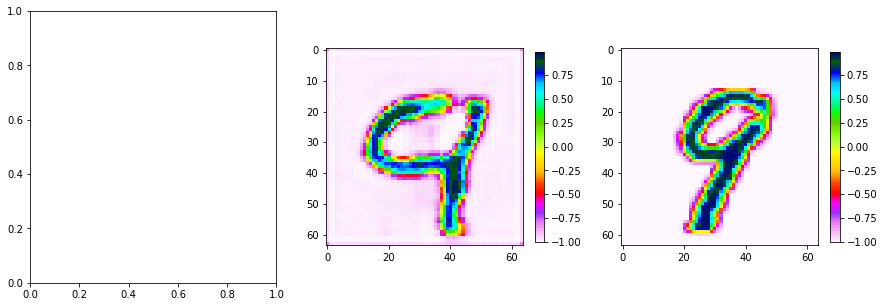

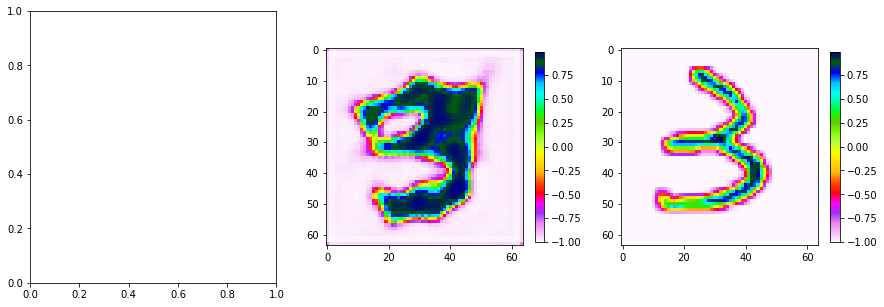

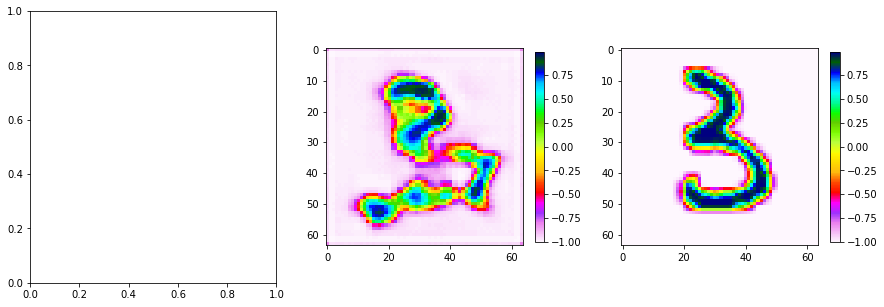

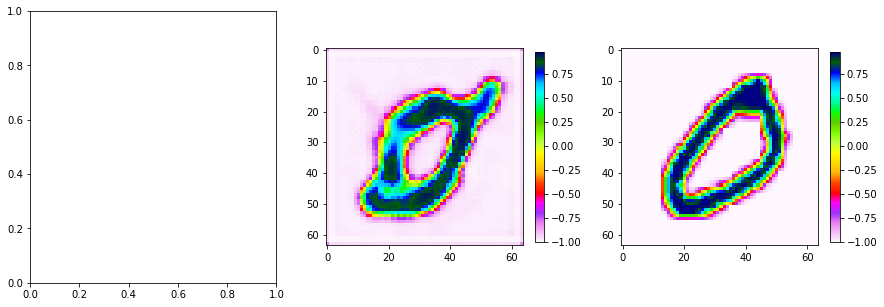

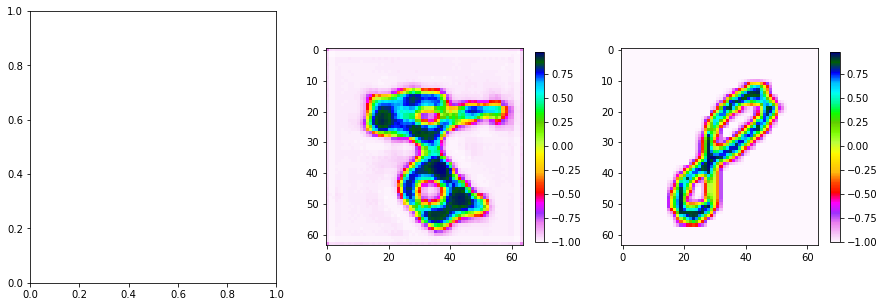

Epoch [1/30] Batch 100/938                   Loss D: -8.7501, loss G: 77.0125


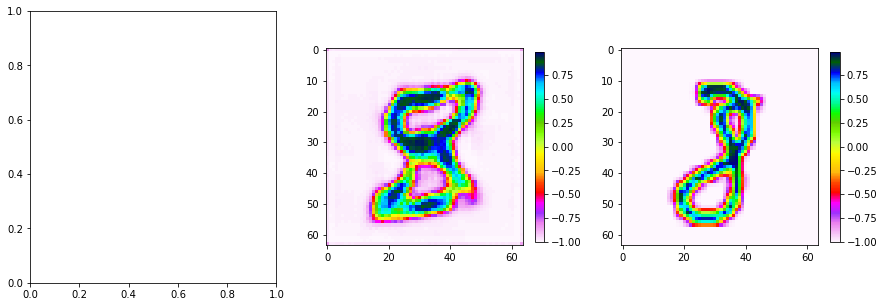

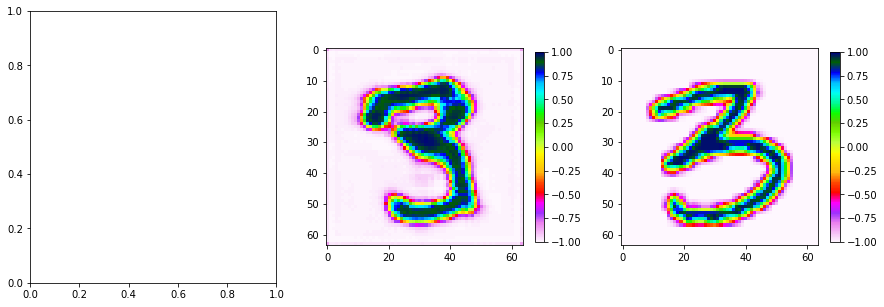

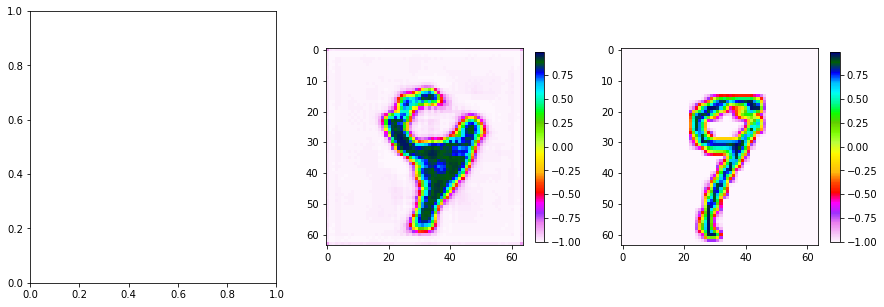

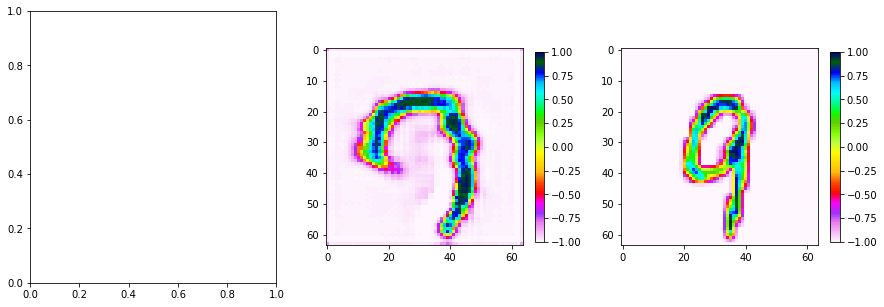

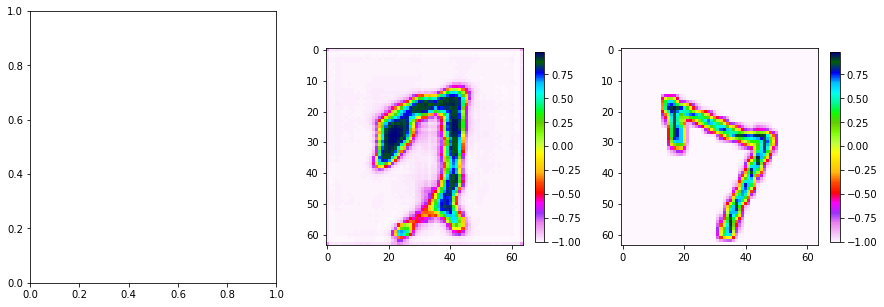

Epoch [1/30] Batch 200/938                   Loss D: -8.5267, loss G: 78.3859


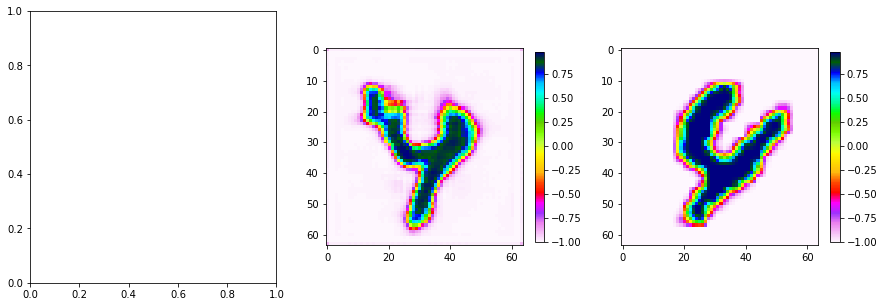

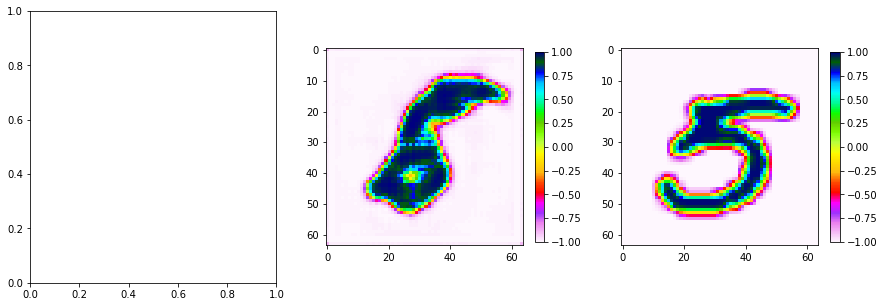

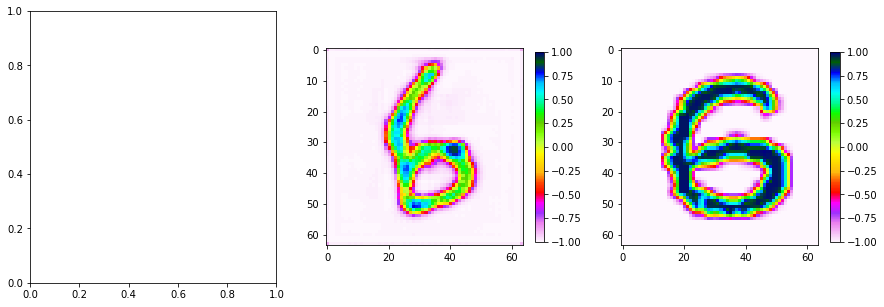

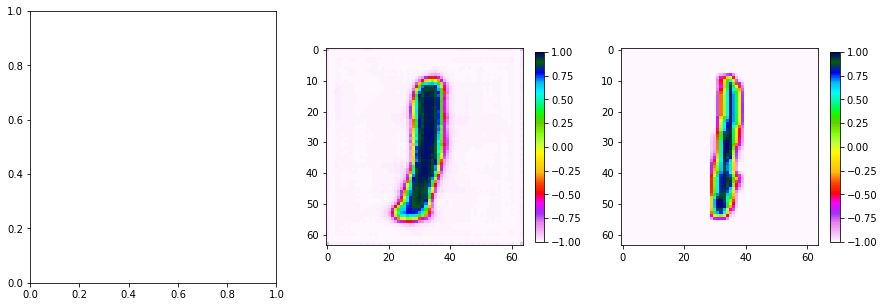

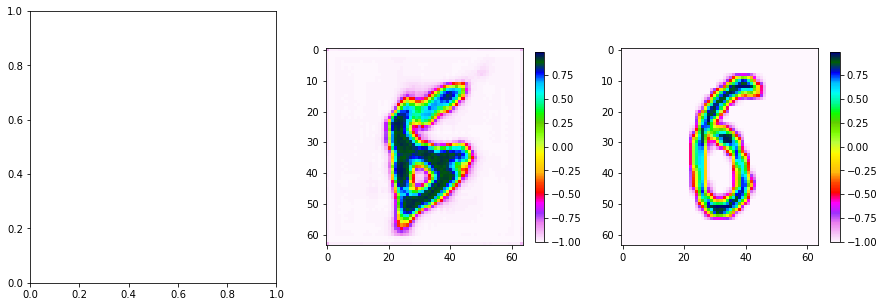

Epoch [1/30] Batch 300/938                   Loss D: -6.7440, loss G: 74.9294


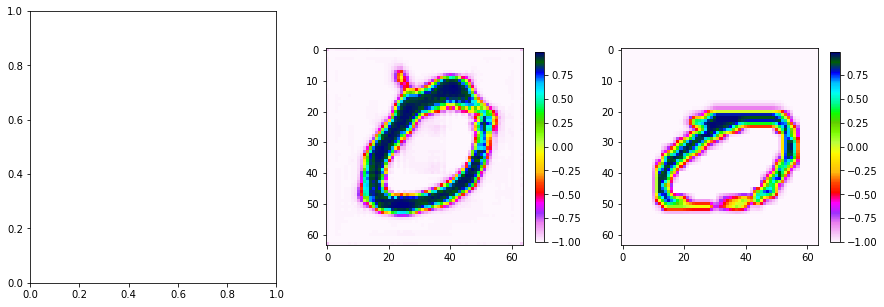

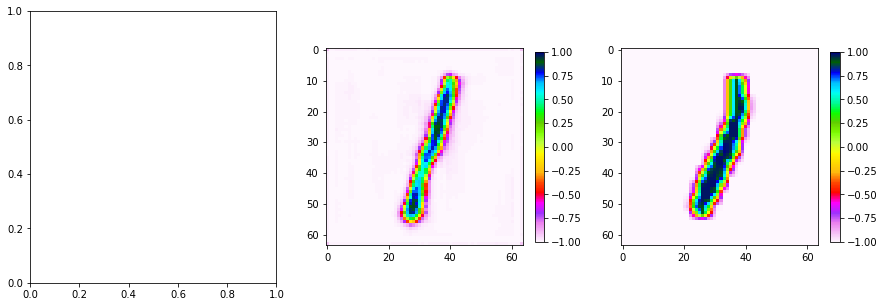

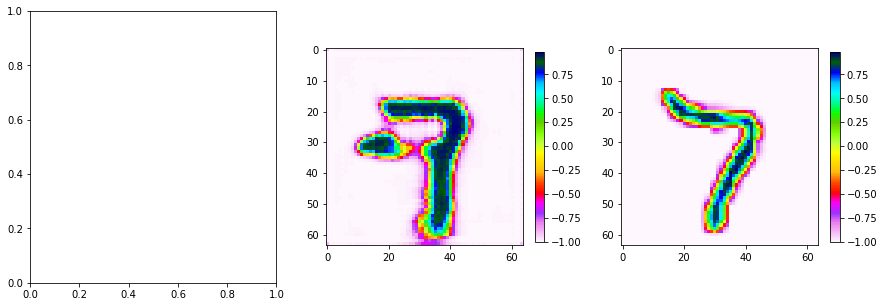

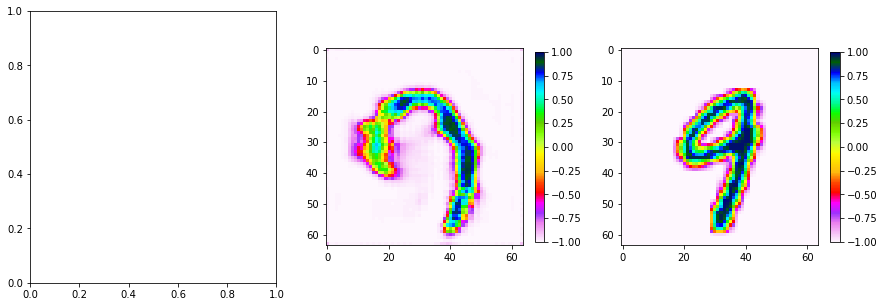

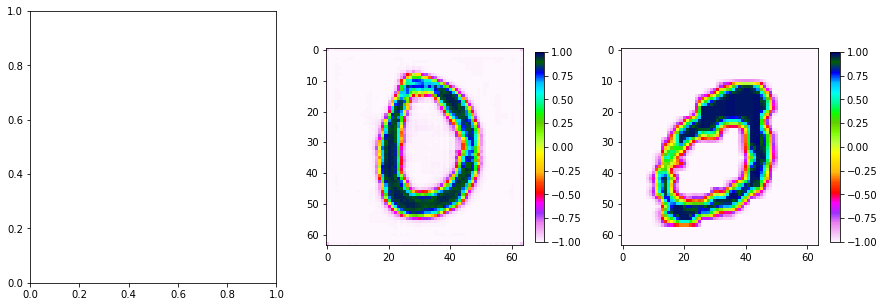

Epoch [1/30] Batch 400/938                   Loss D: -6.9187, loss G: 73.0787


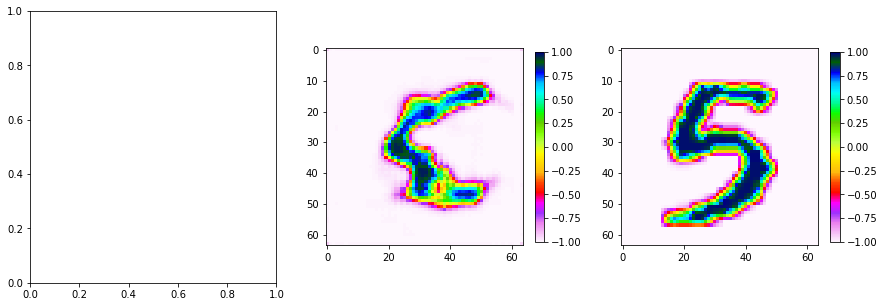

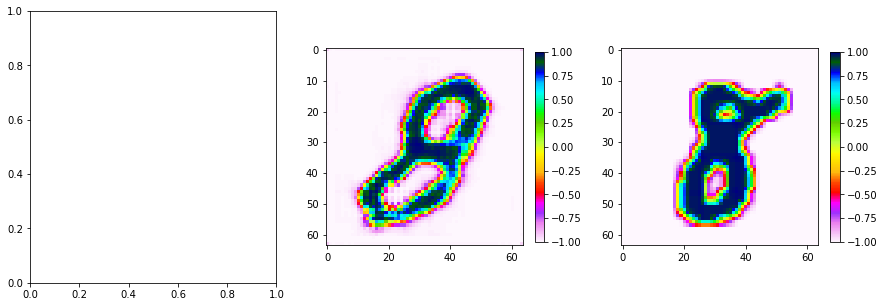

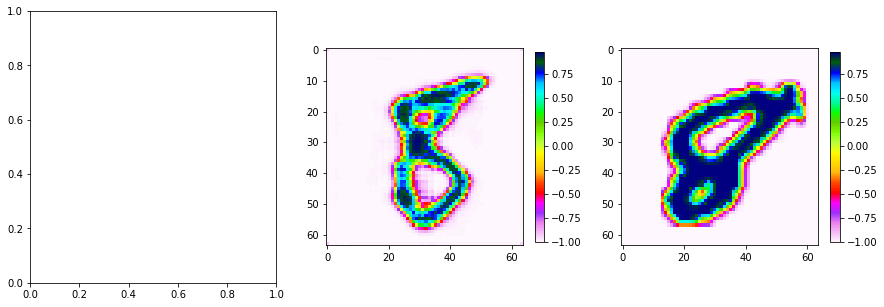

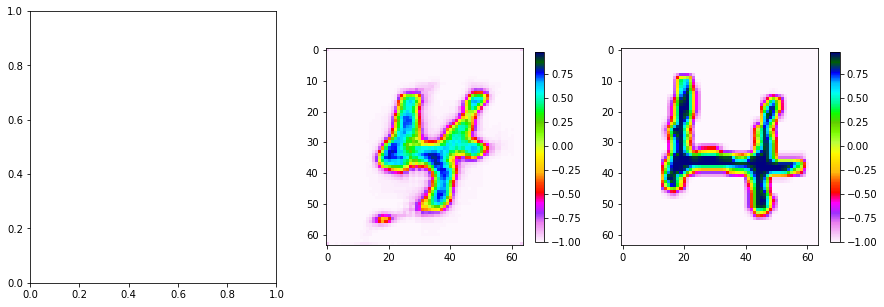

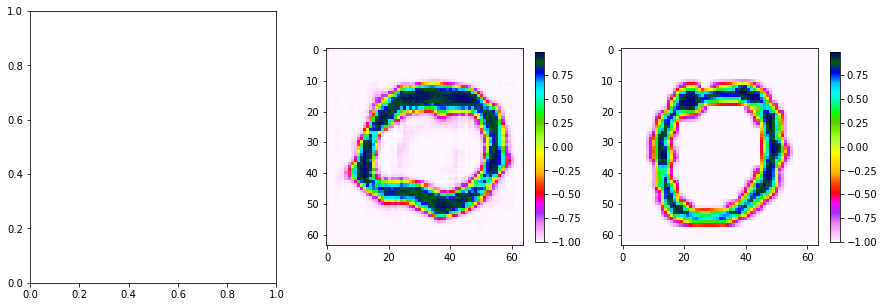

Epoch [1/30] Batch 500/938                   Loss D: -8.0213, loss G: 77.0318


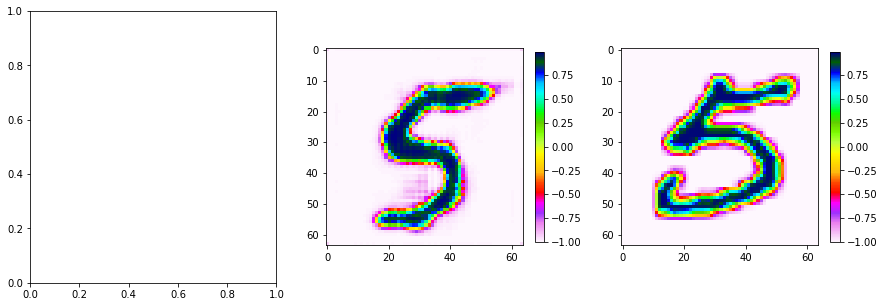

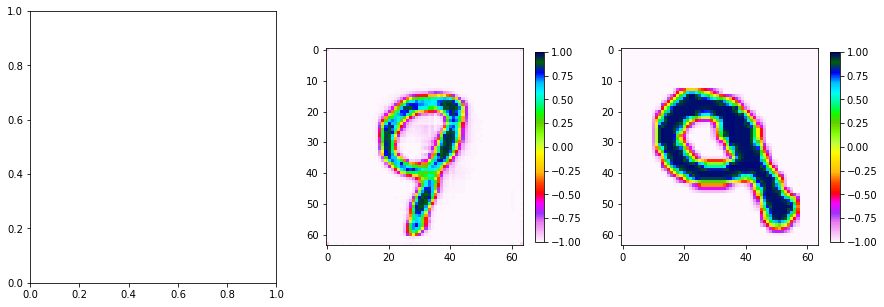

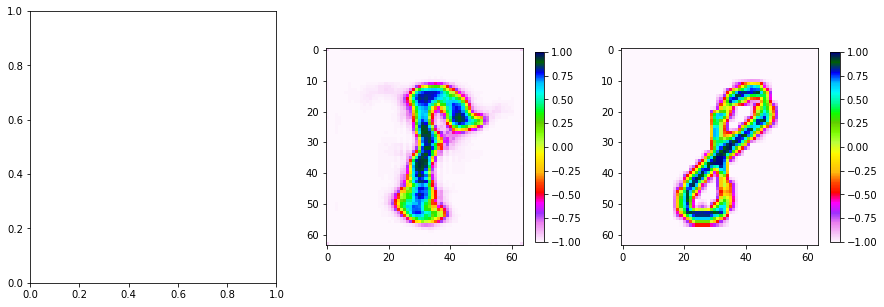

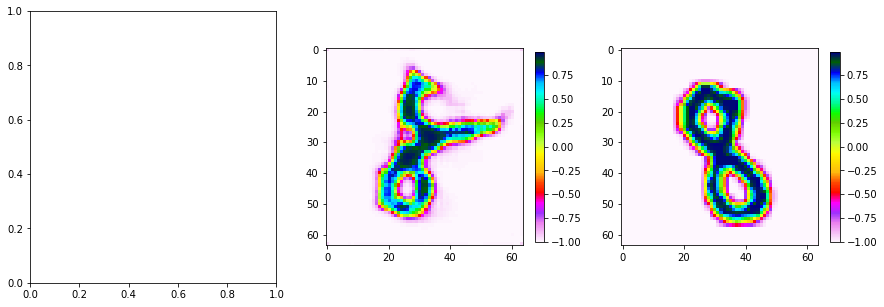

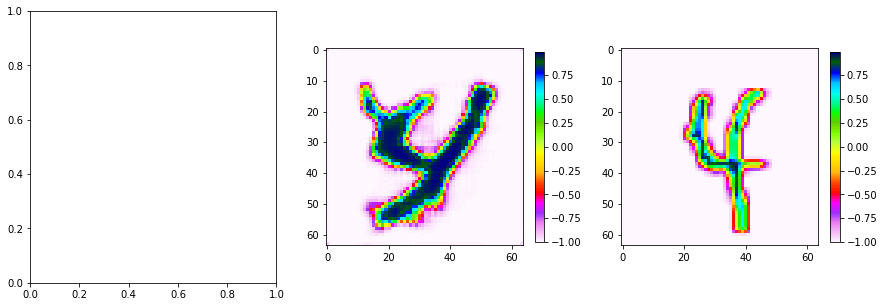

Epoch [1/30] Batch 600/938                   Loss D: -5.3828, loss G: 77.9741


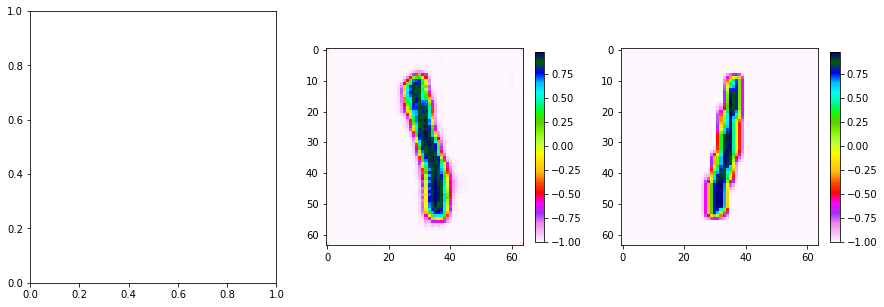

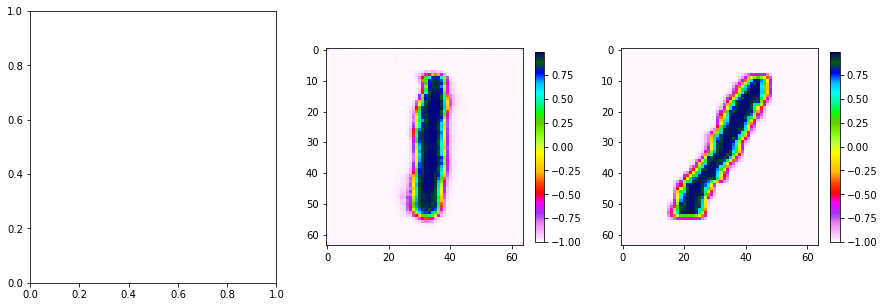

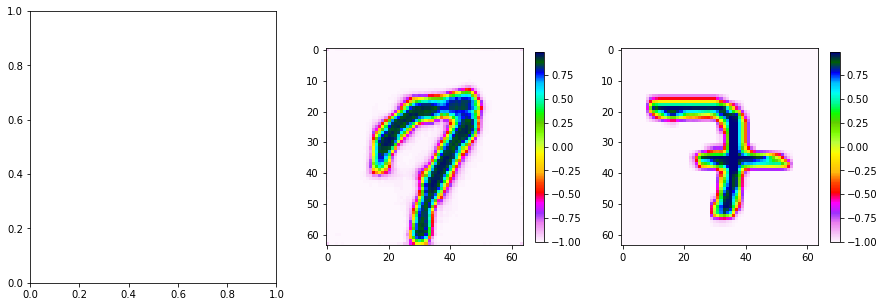

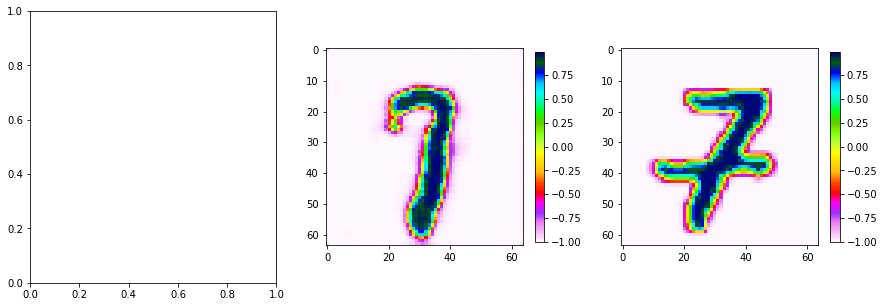

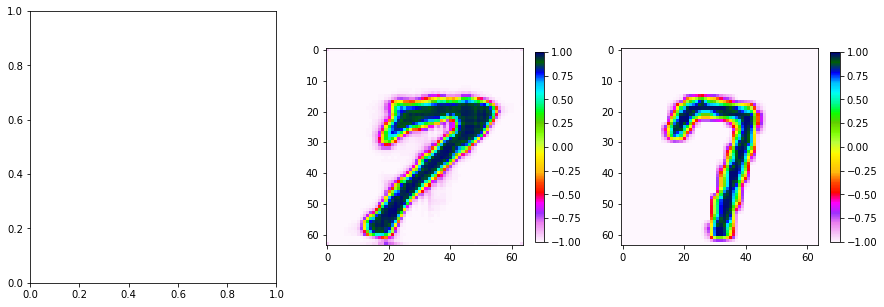

Epoch [1/30] Batch 700/938                   Loss D: -4.5598, loss G: 74.8849


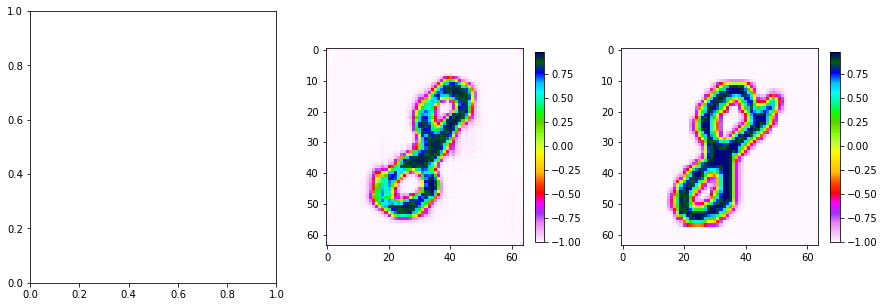

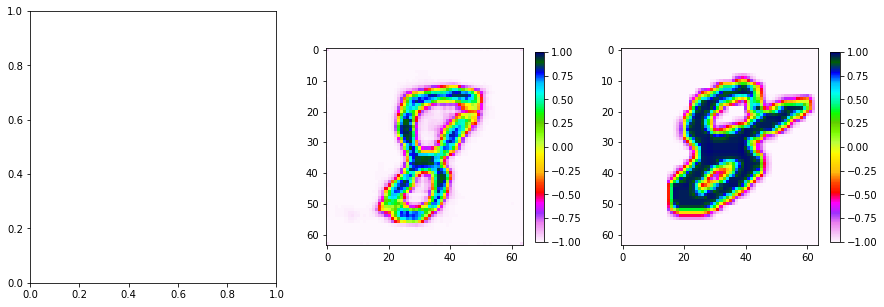

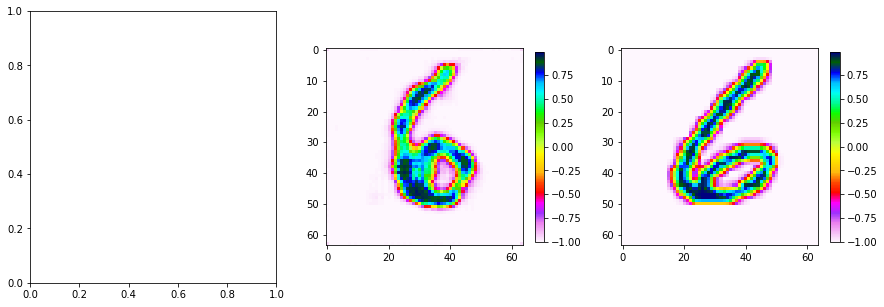

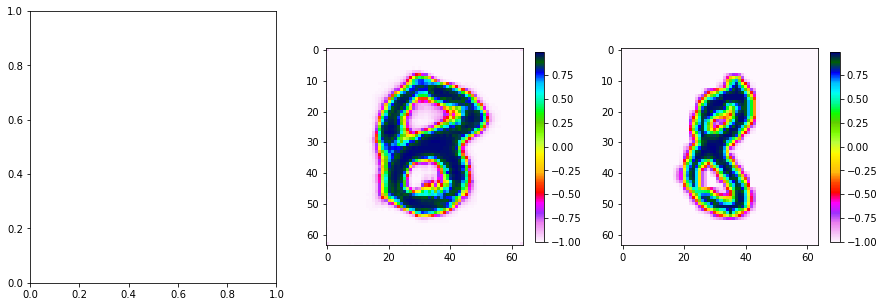

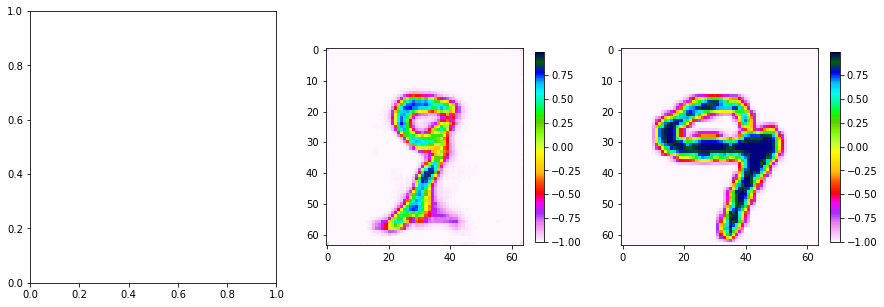

Epoch [1/30] Batch 800/938                   Loss D: -5.4809, loss G: 74.6321


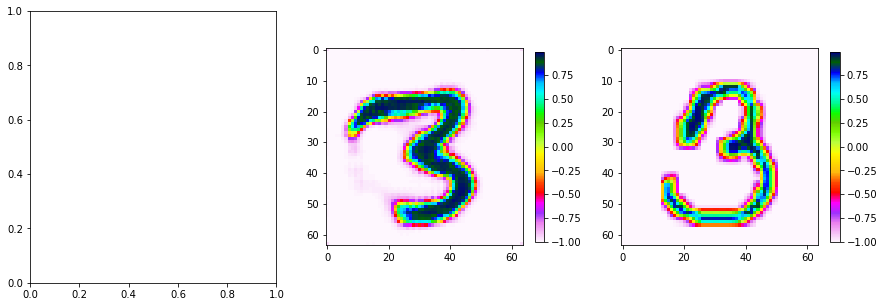

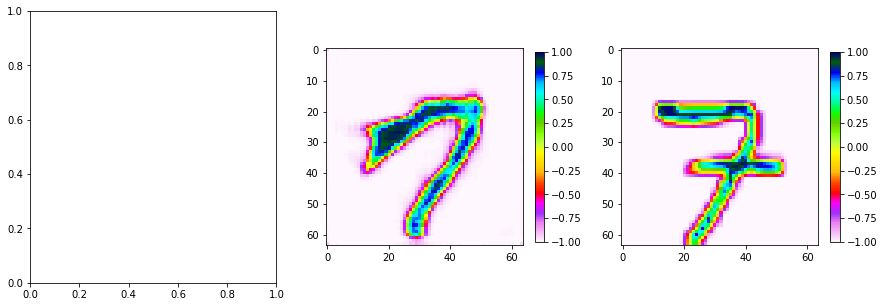

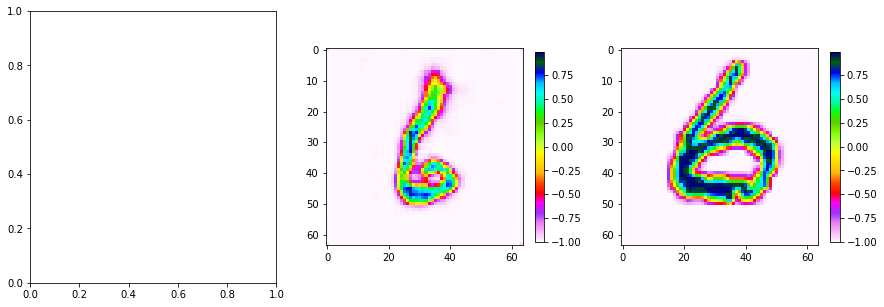

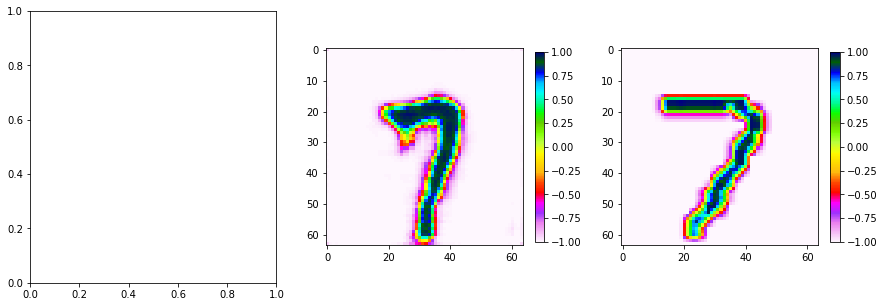

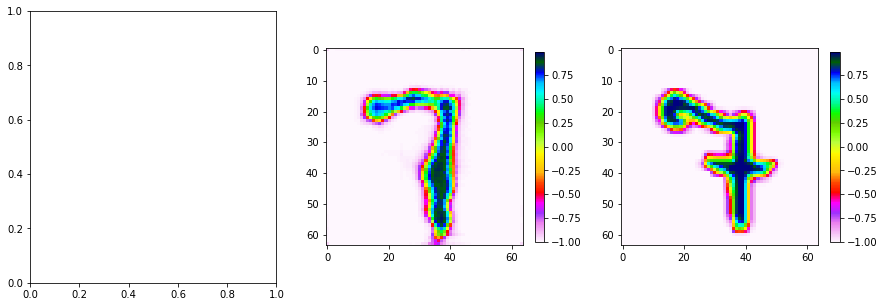

Epoch [1/30] Batch 900/938                   Loss D: -6.7819, loss G: 76.2410


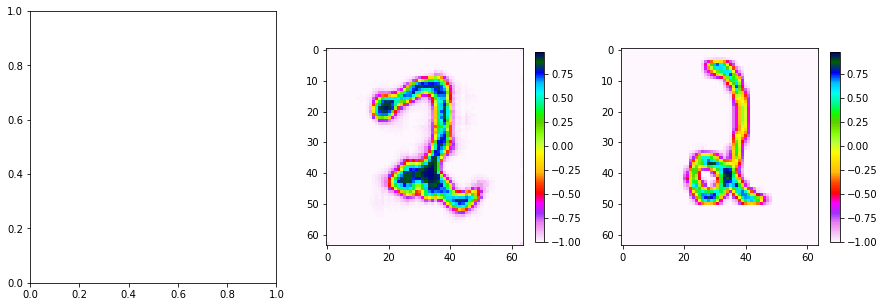

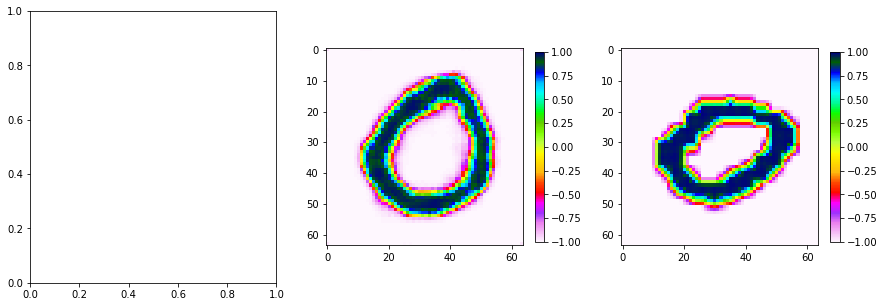

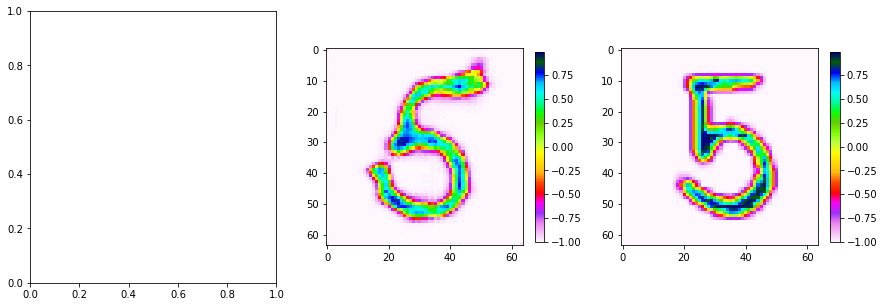

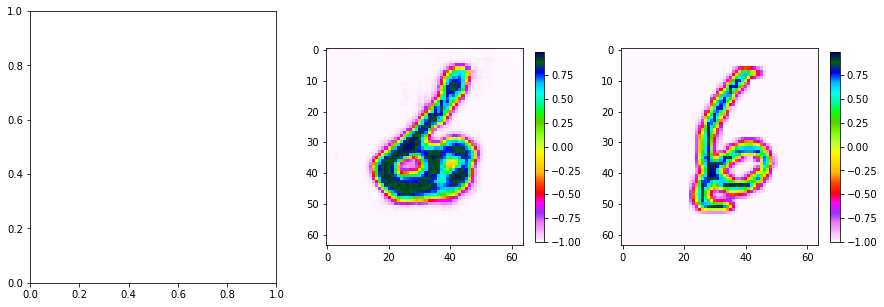

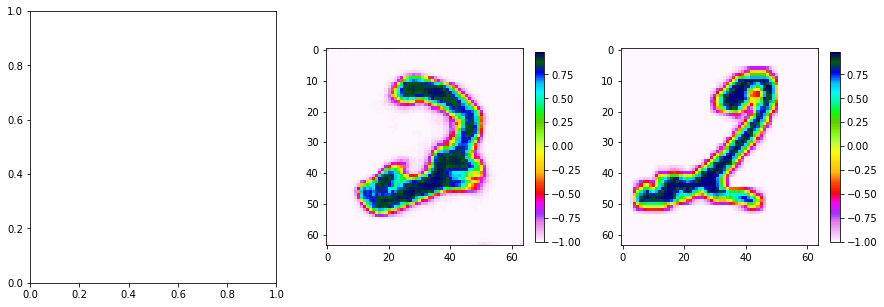

Epoch [2/30] Batch 0/938                   Loss D: -5.5211, loss G: 77.2350


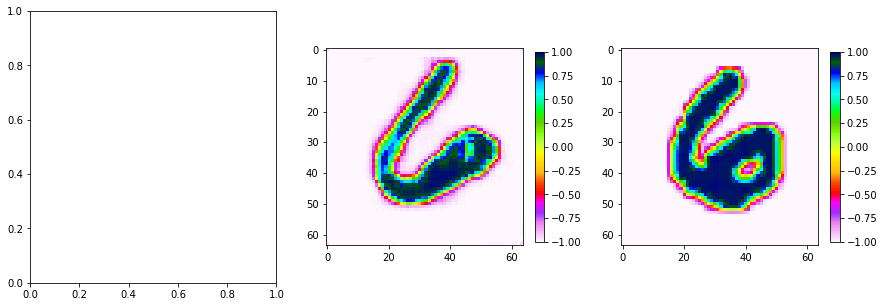

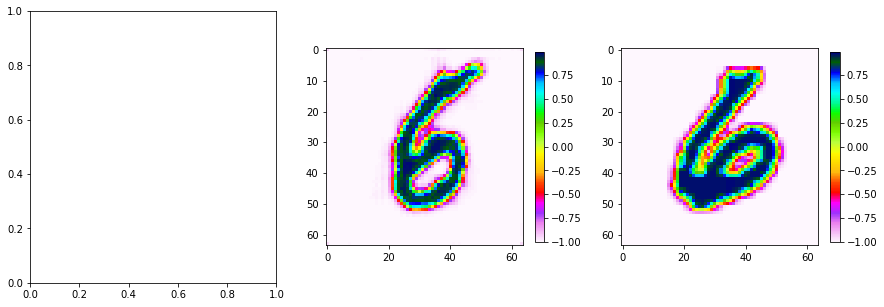

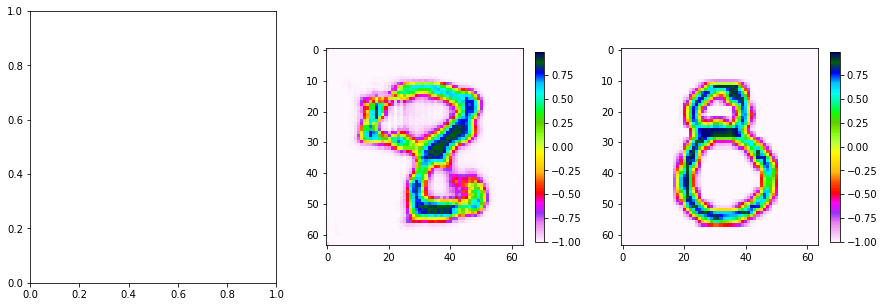

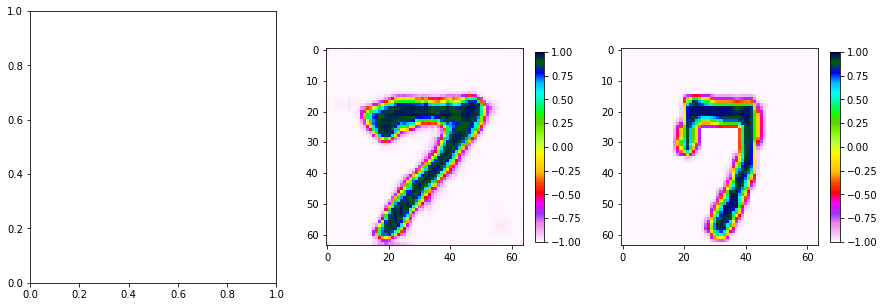

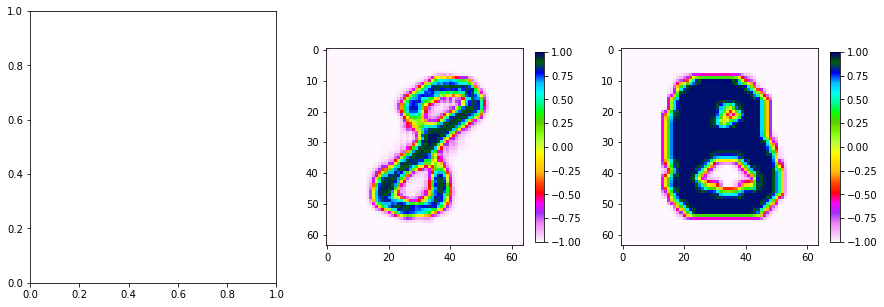

Epoch [2/30] Batch 100/938                   Loss D: -7.3189, loss G: 70.6299


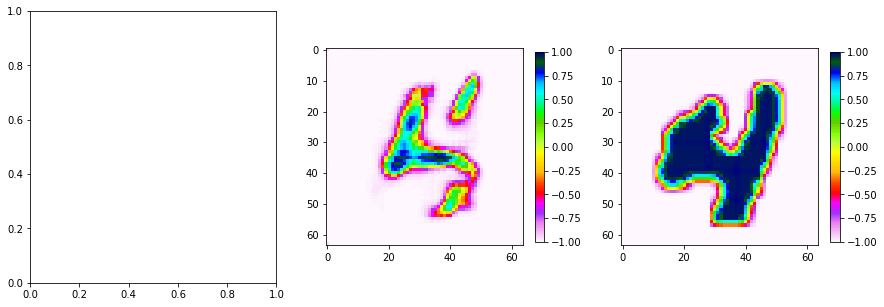

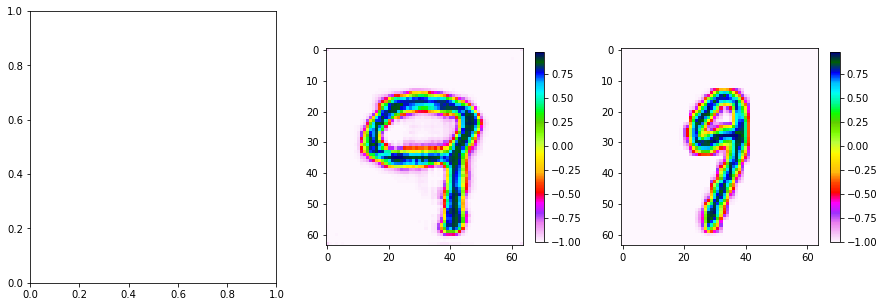

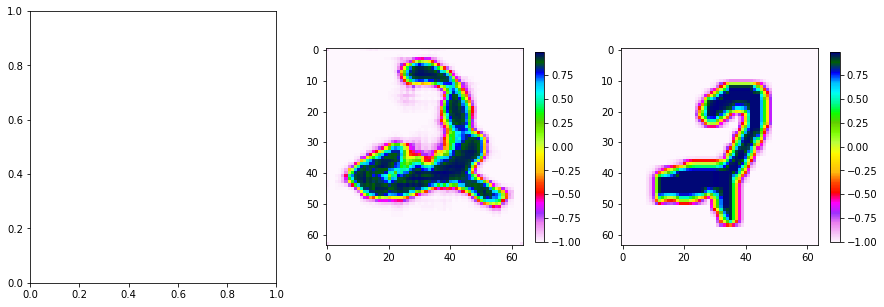

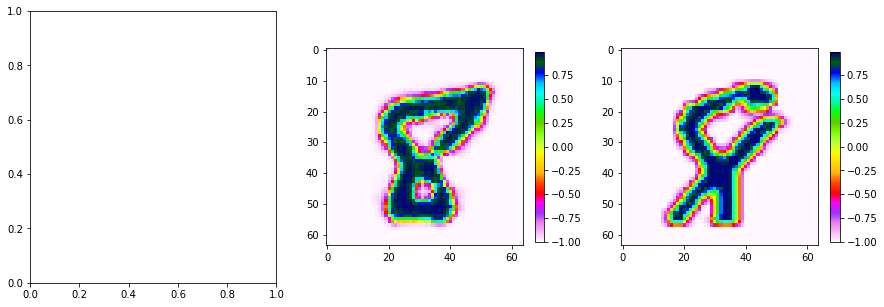

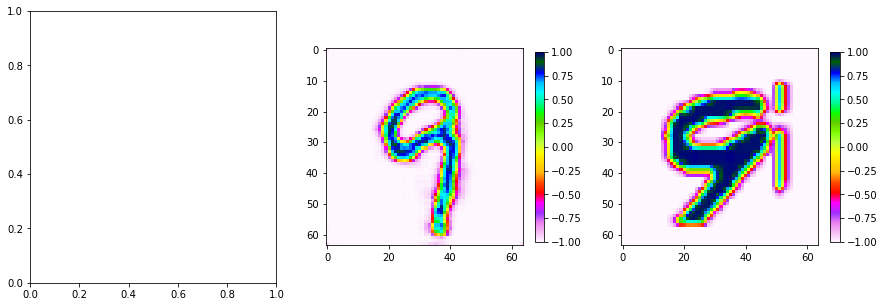

Epoch [2/30] Batch 200/938                   Loss D: -6.5300, loss G: 72.2811


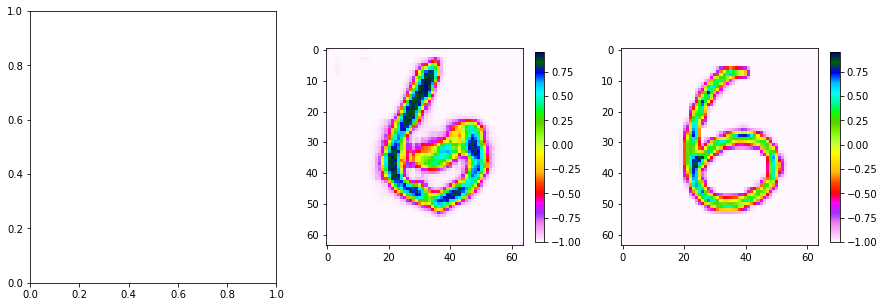

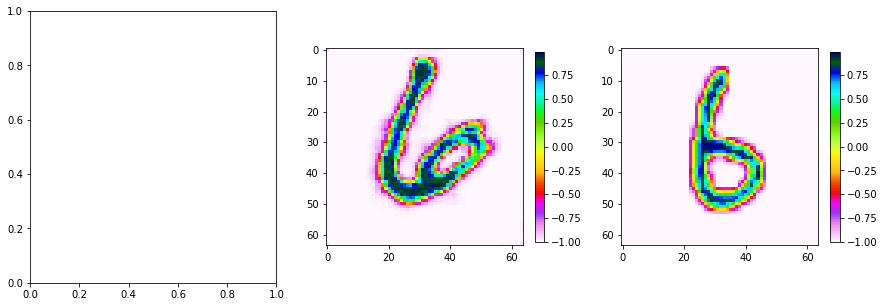

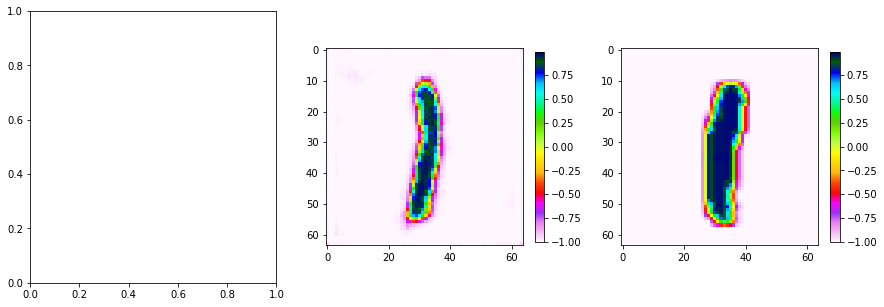

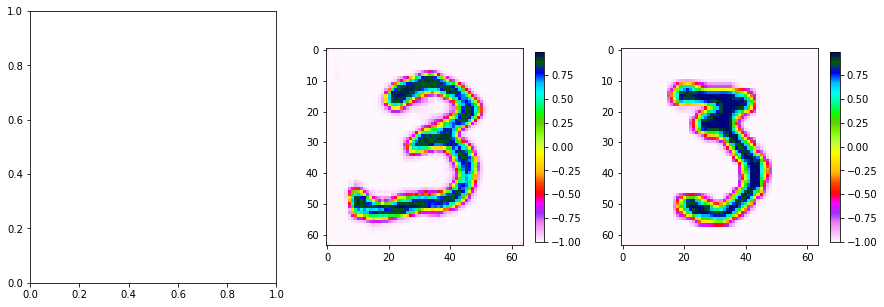

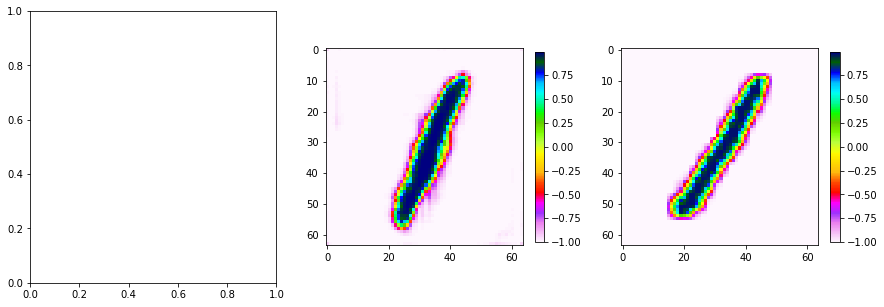

Epoch [2/30] Batch 300/938                   Loss D: -7.3691, loss G: 63.5937


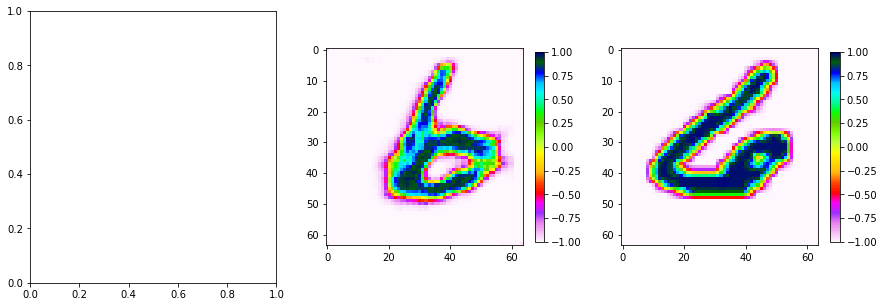

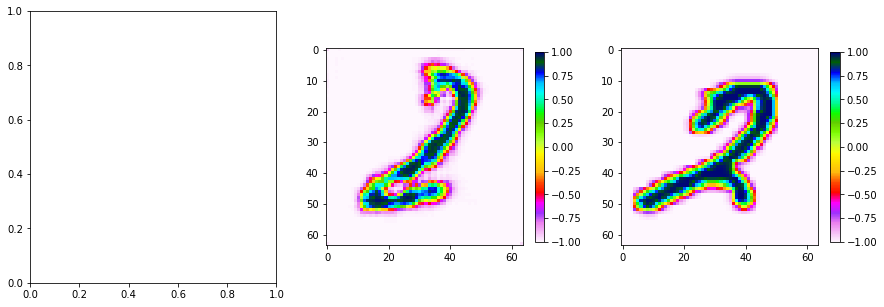

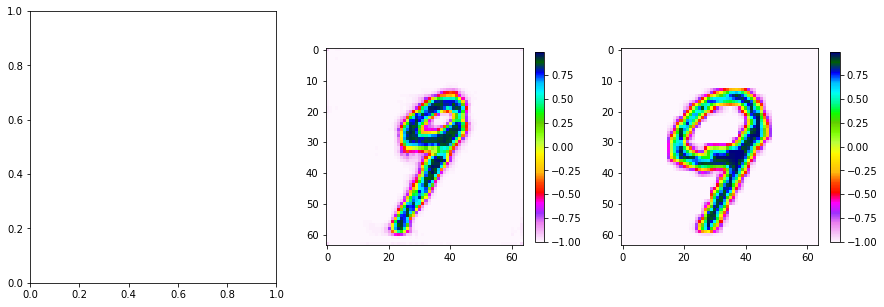

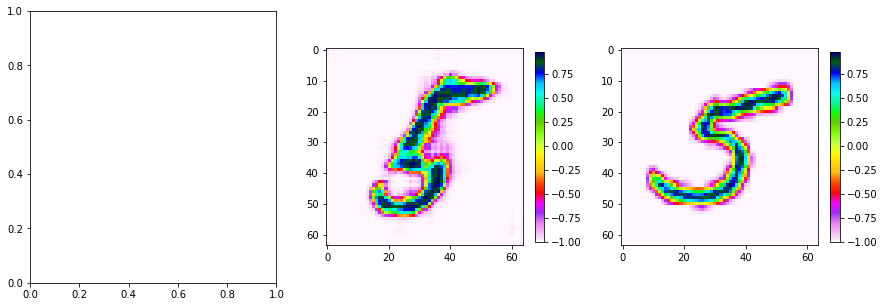

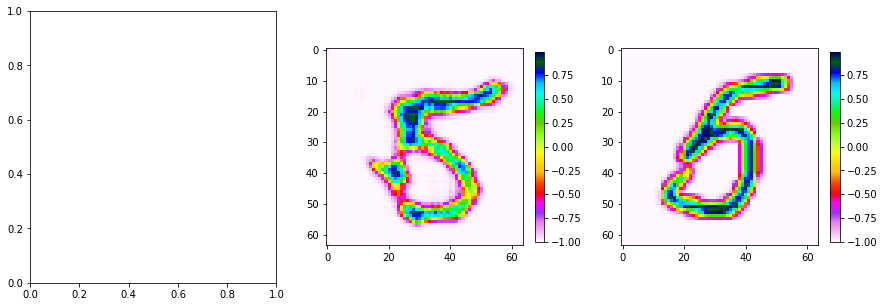

Epoch [2/30] Batch 400/938                   Loss D: -5.7783, loss G: 66.2368


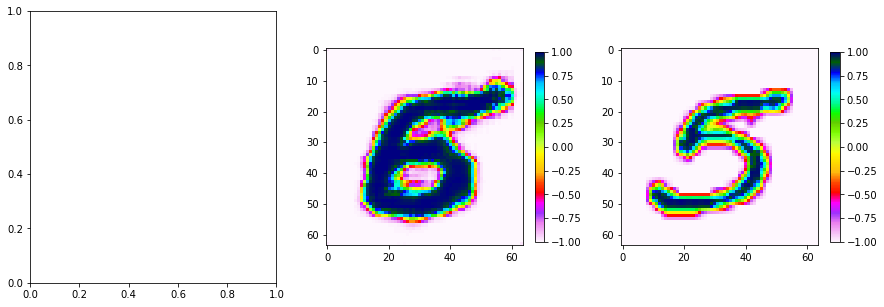

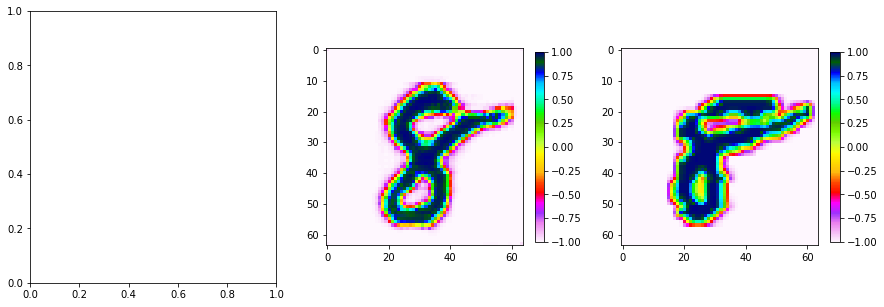

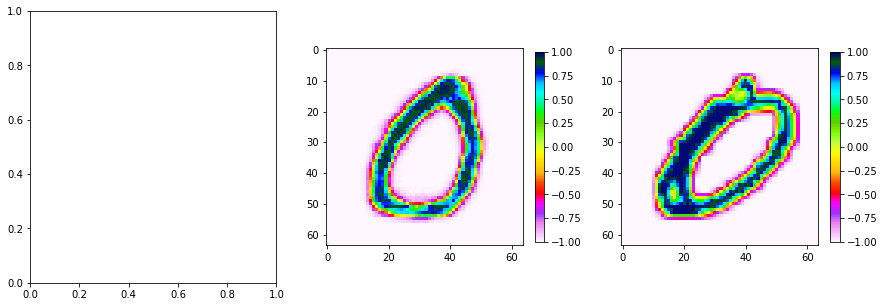

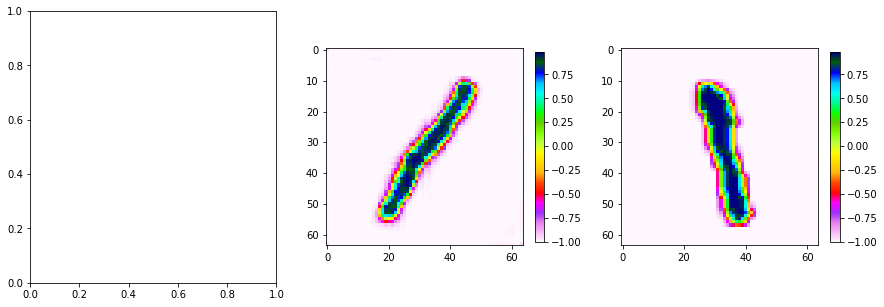

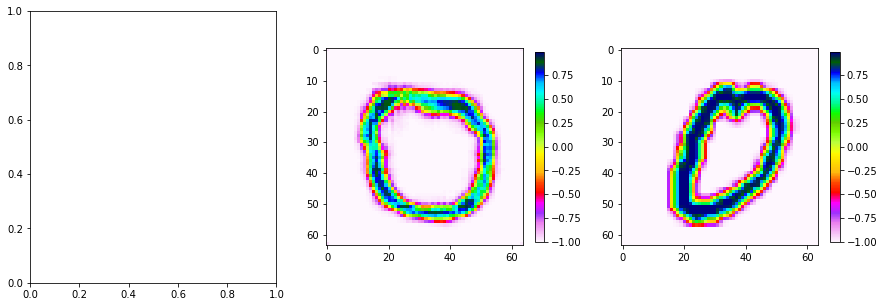

Epoch [2/30] Batch 500/938                   Loss D: -5.3519, loss G: 70.8129


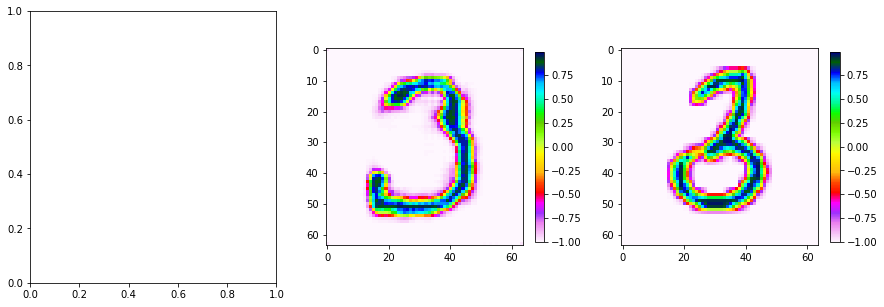

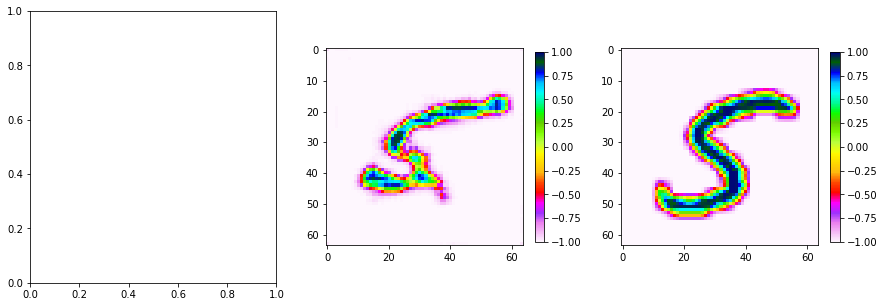

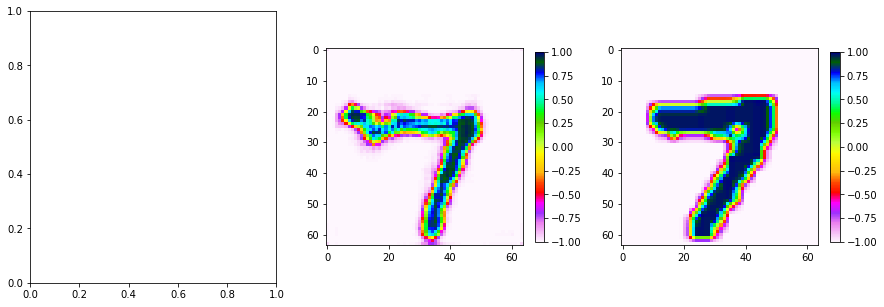

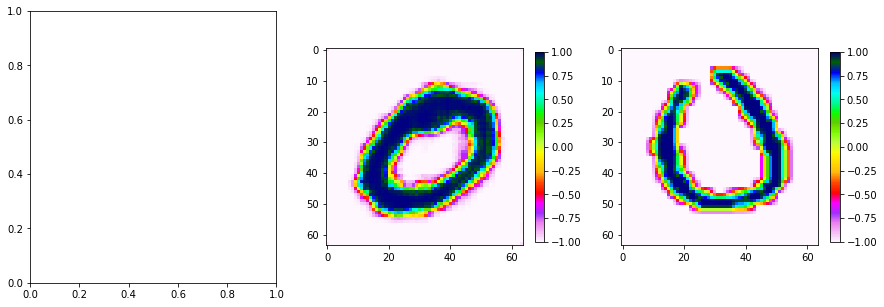

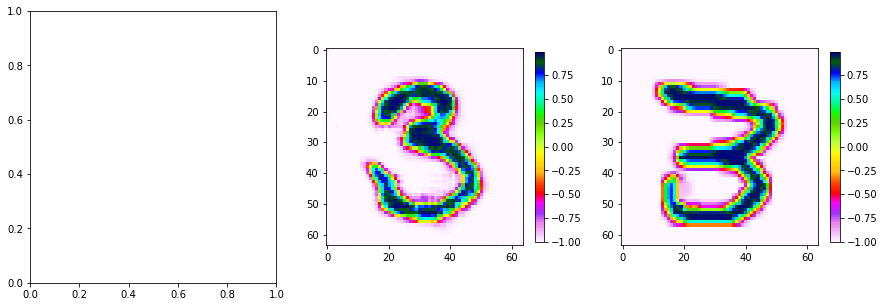

Epoch [2/30] Batch 600/938                   Loss D: -6.9471, loss G: 71.2294


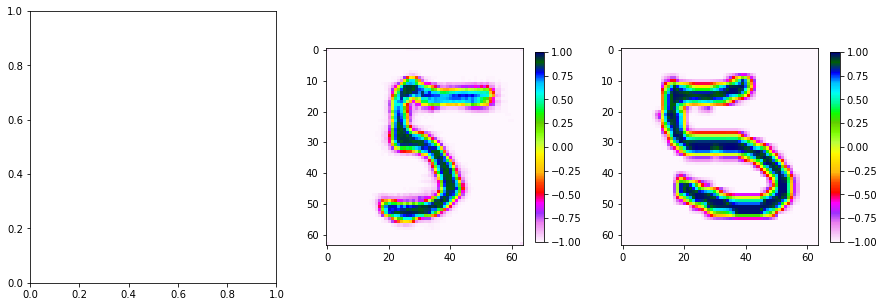

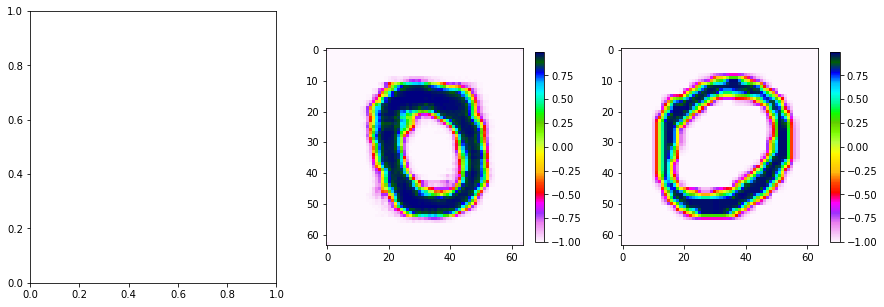

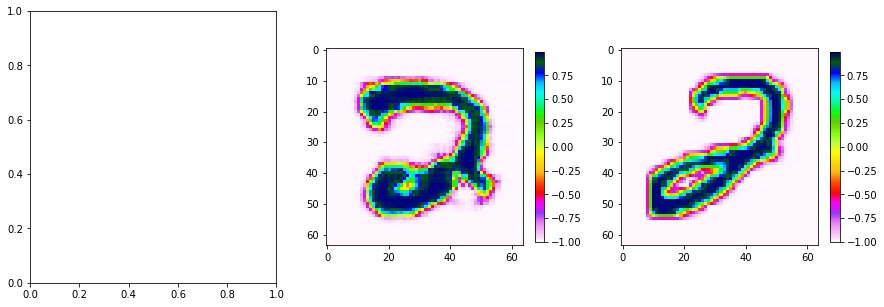

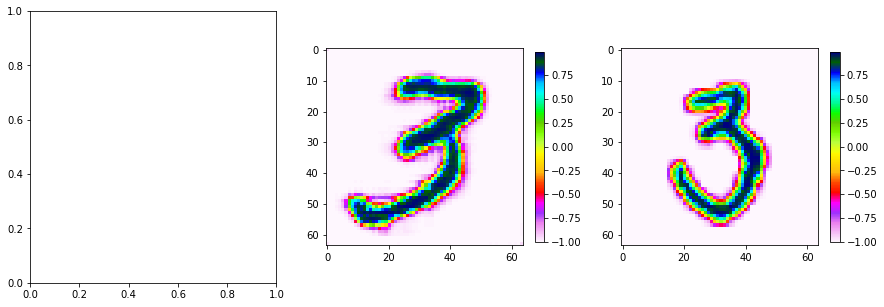

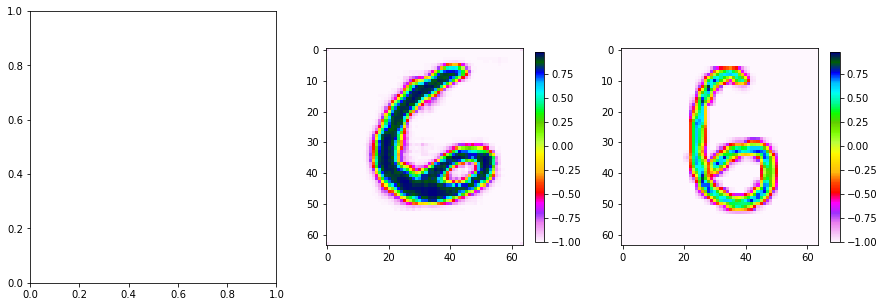

Epoch [2/30] Batch 700/938                   Loss D: -5.7647, loss G: 66.4648


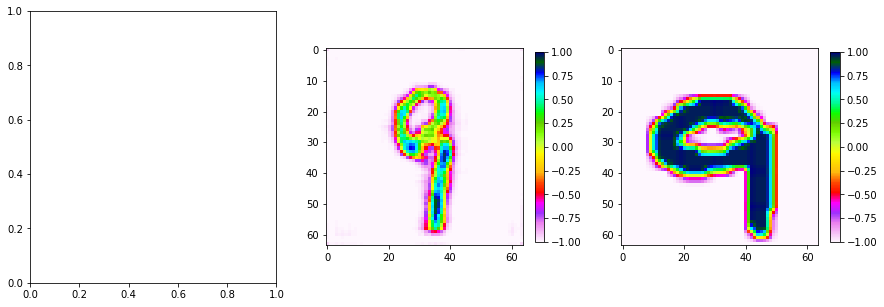

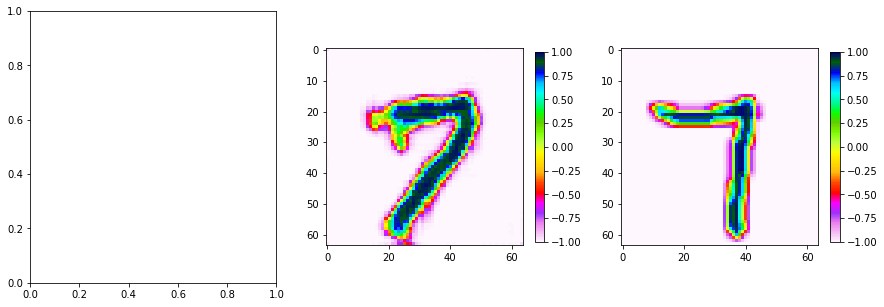

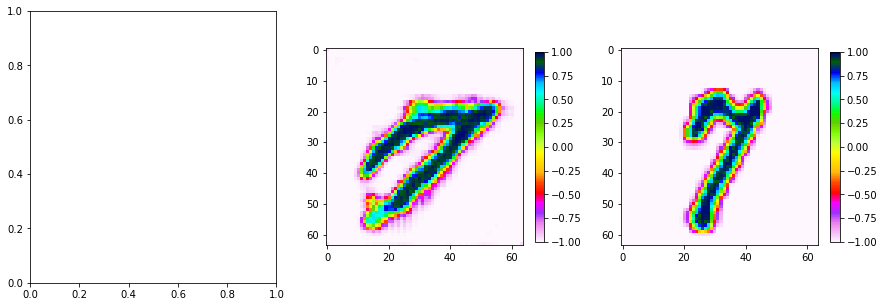

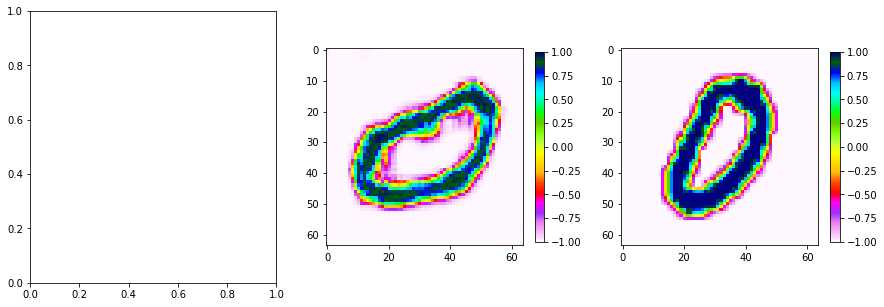

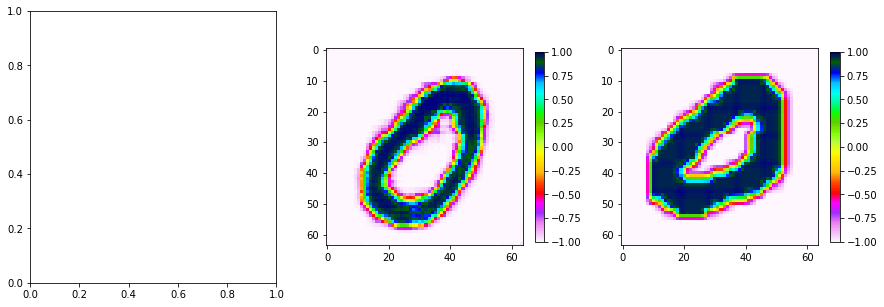

Epoch [2/30] Batch 800/938                   Loss D: -4.4914, loss G: 69.3773


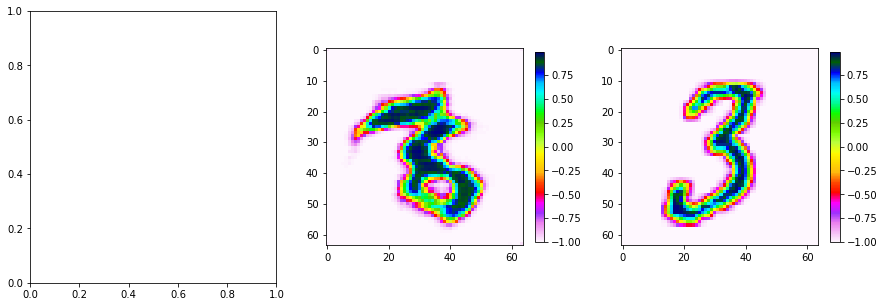

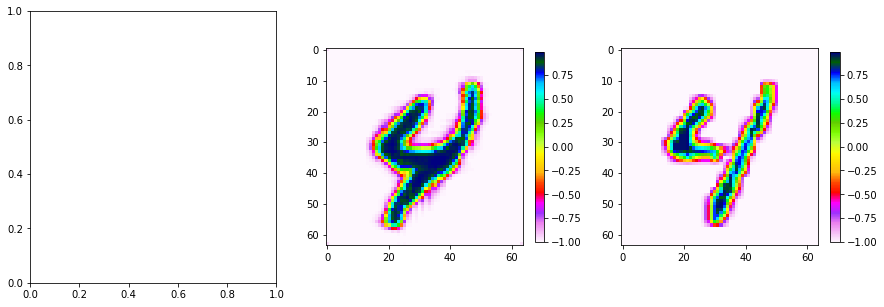

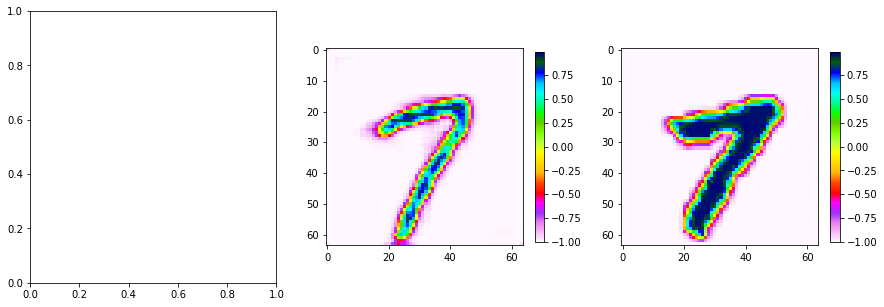

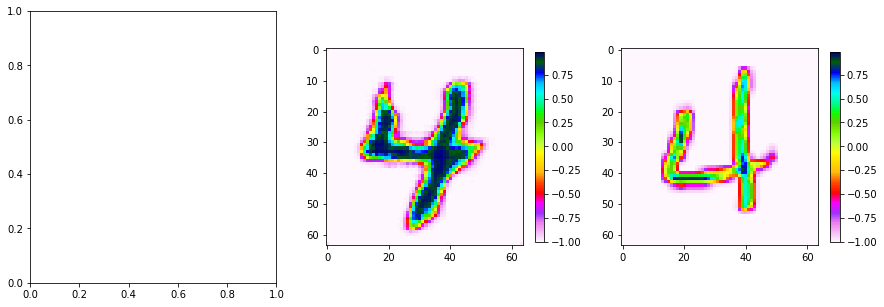

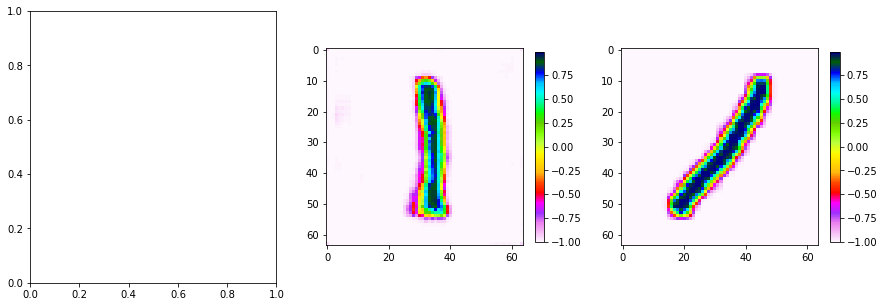

Epoch [2/30] Batch 900/938                   Loss D: -6.8918, loss G: 68.1934


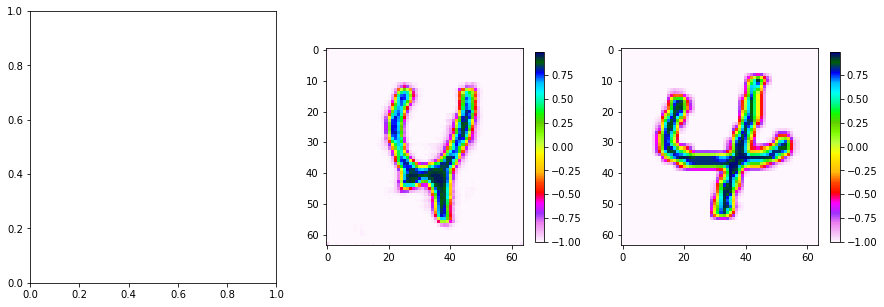

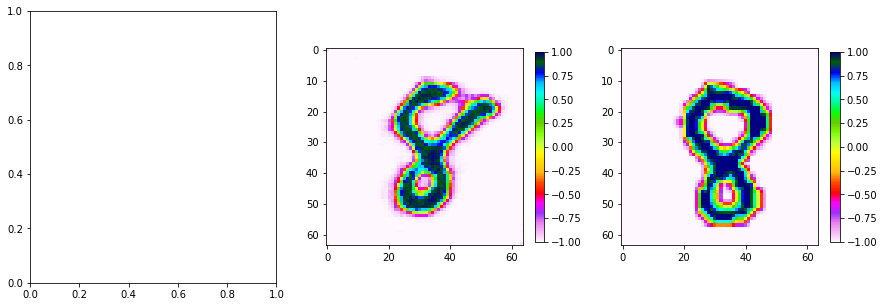

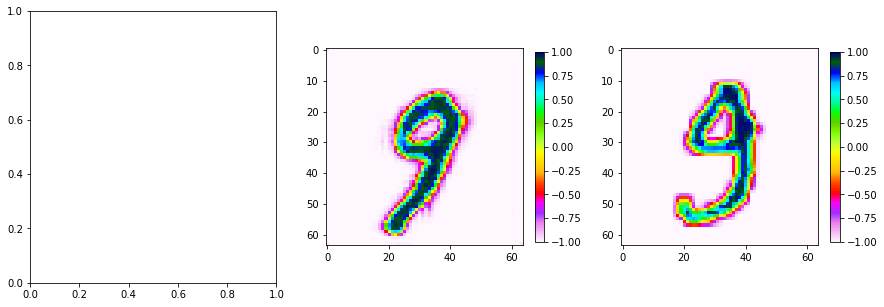

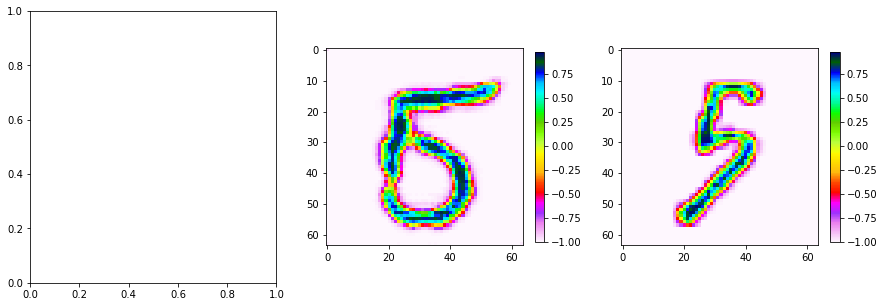

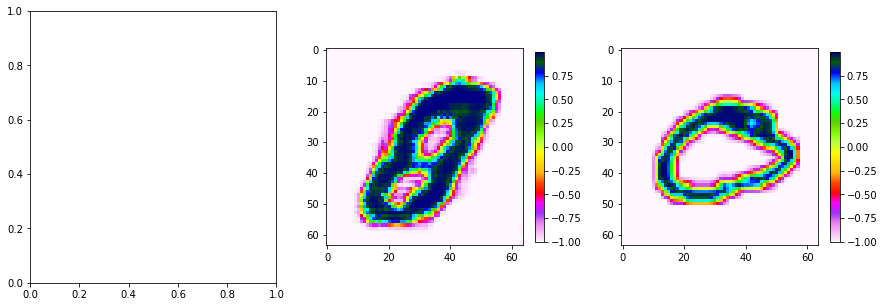

Epoch [3/30] Batch 0/938                   Loss D: -5.4448, loss G: 72.2408


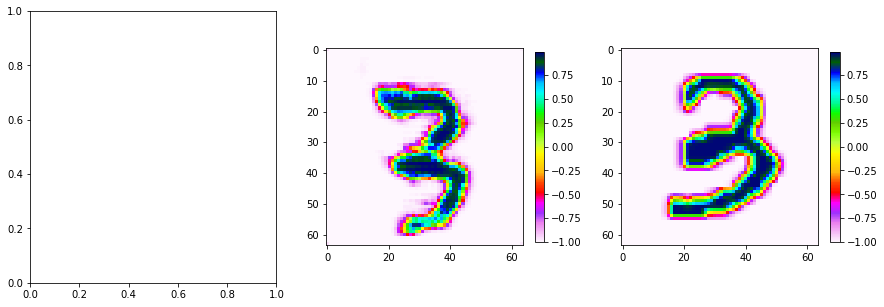

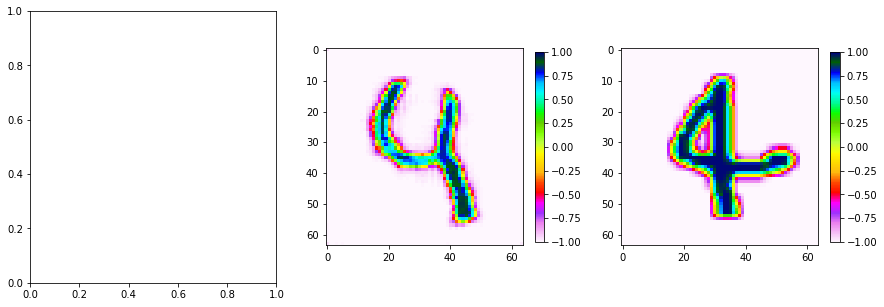

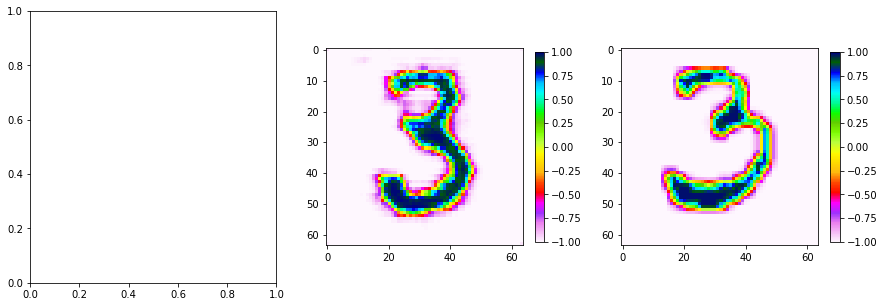

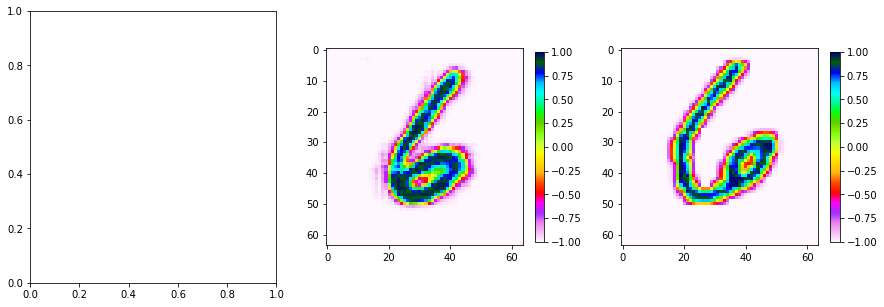

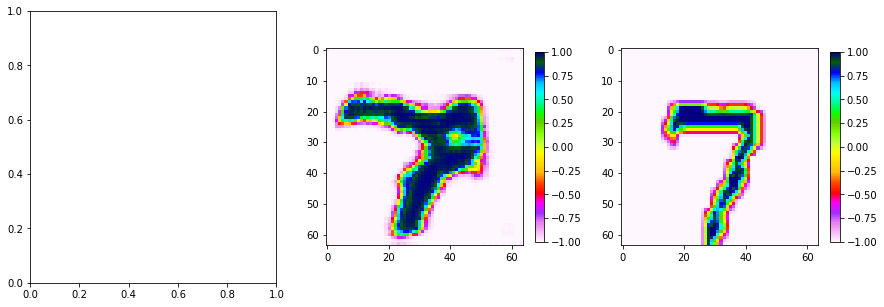

Epoch [3/30] Batch 100/938                   Loss D: -6.7953, loss G: 64.2935


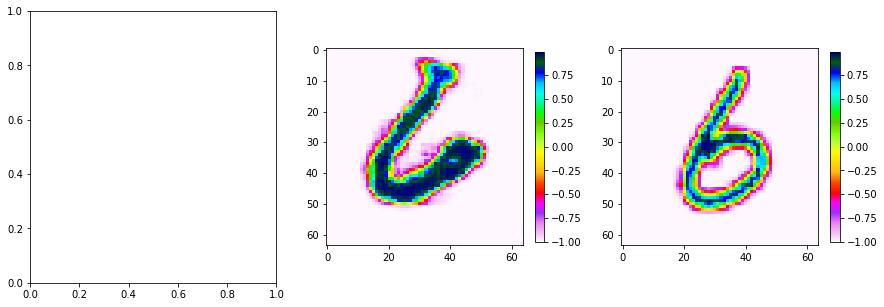

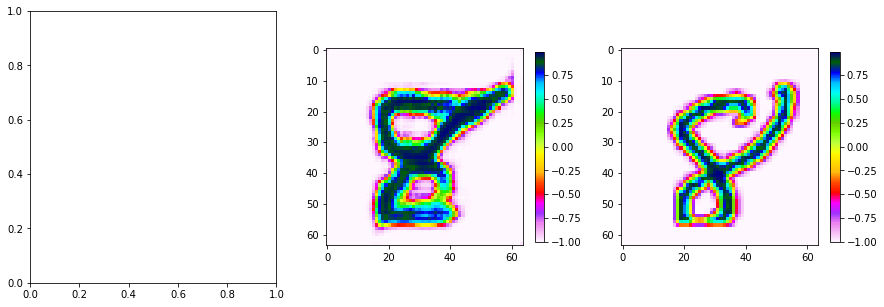

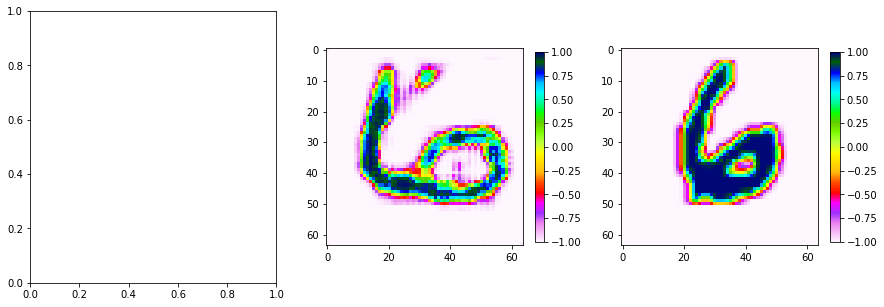

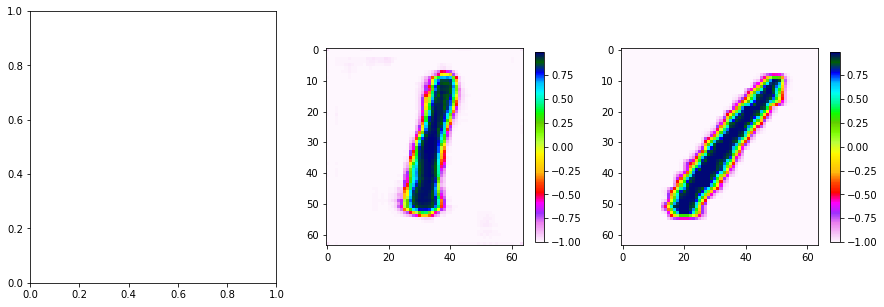

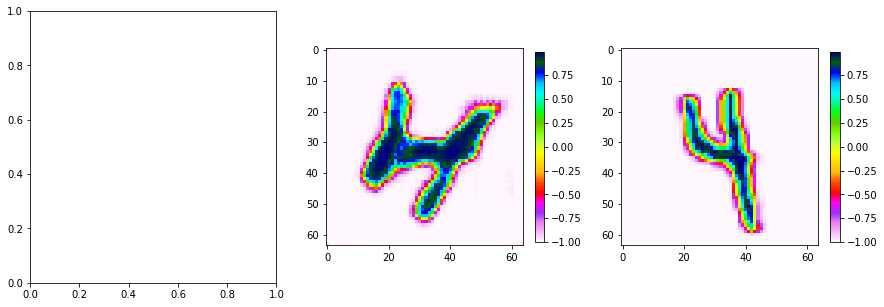

Epoch [3/30] Batch 200/938                   Loss D: -6.3686, loss G: 67.4693


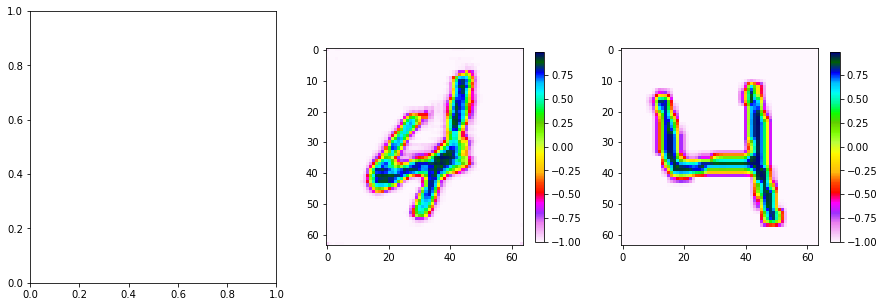

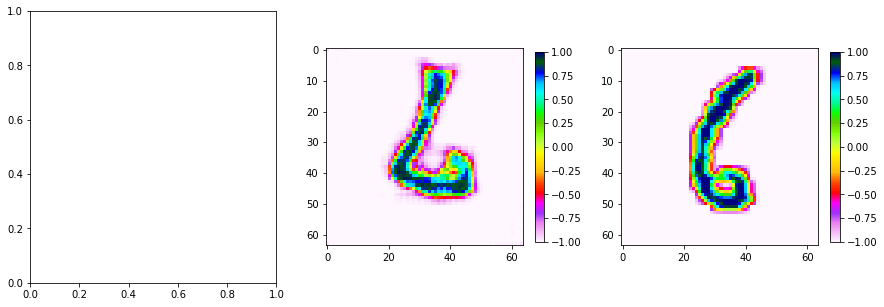

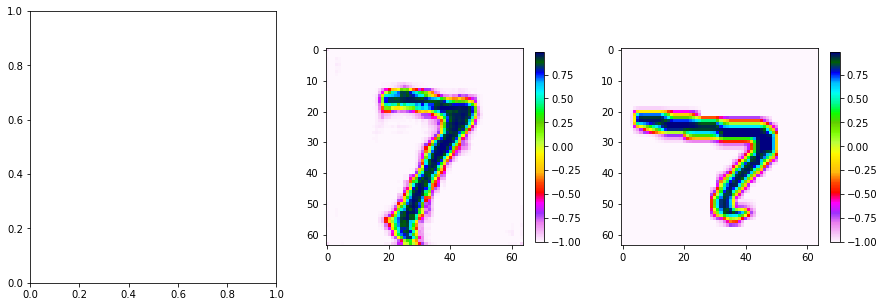

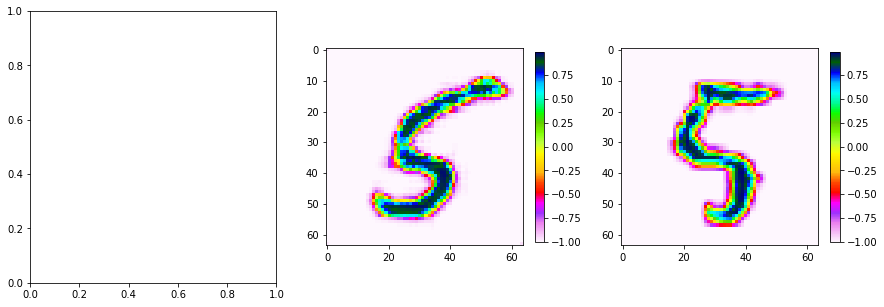

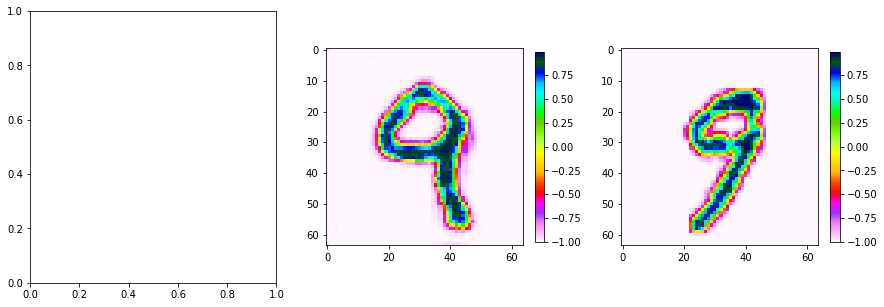

Epoch [3/30] Batch 300/938                   Loss D: -6.1240, loss G: 64.4999


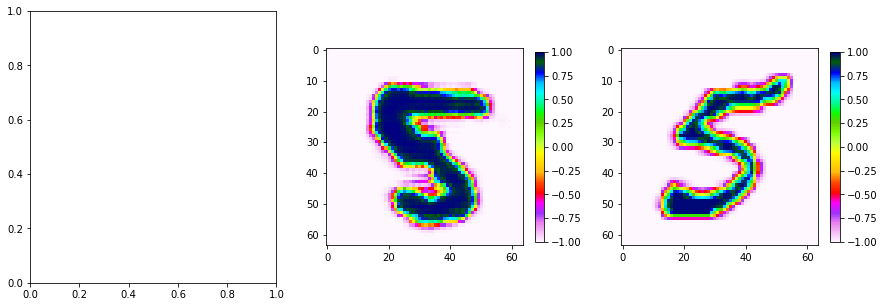

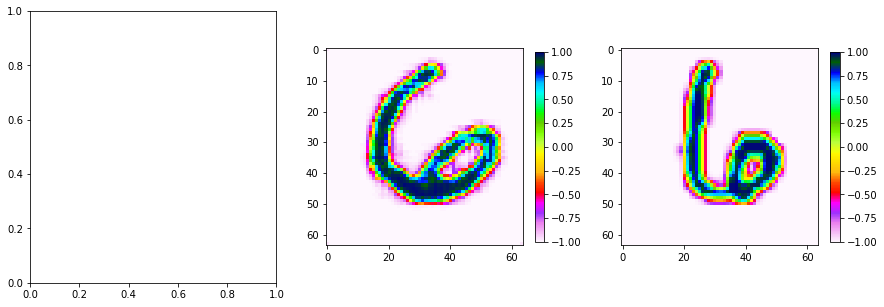

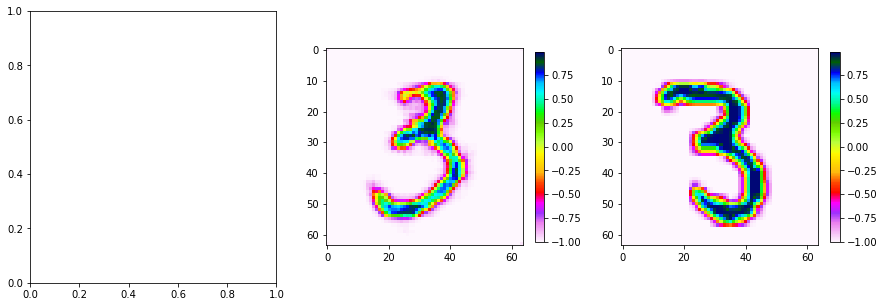

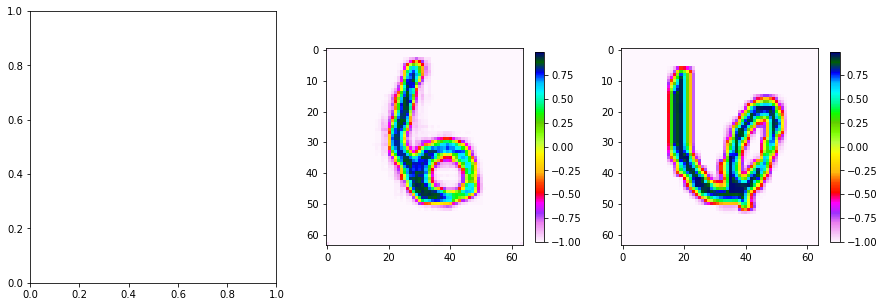

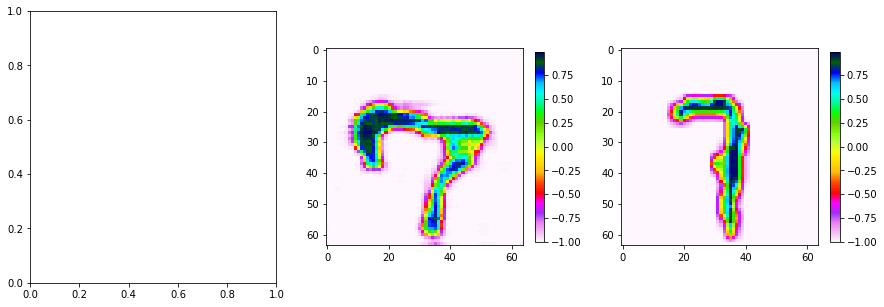

Epoch [3/30] Batch 400/938                   Loss D: -5.3081, loss G: 70.5959


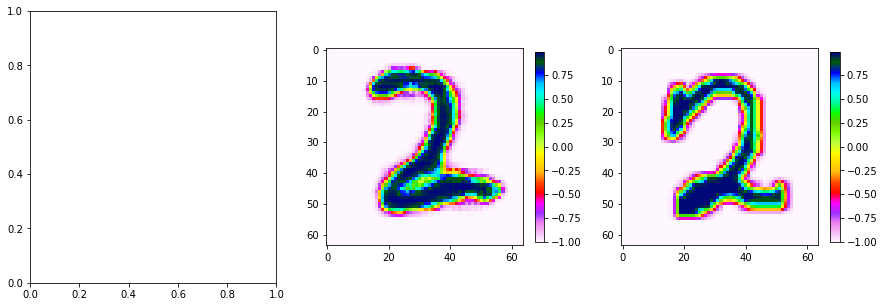

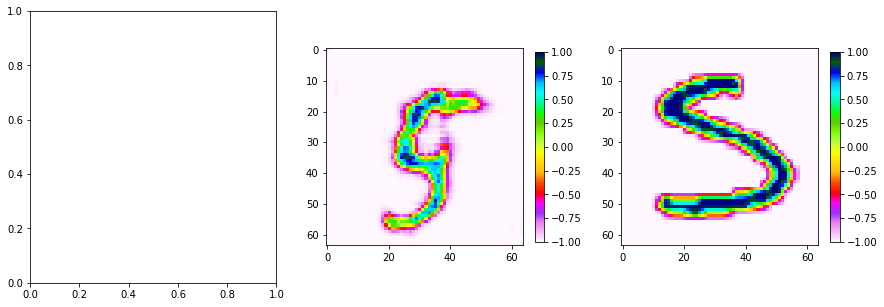

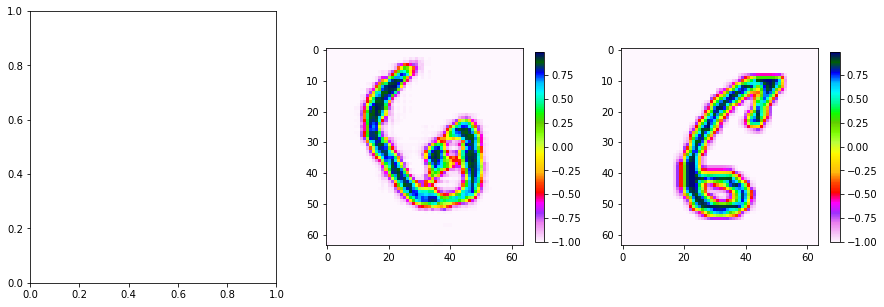

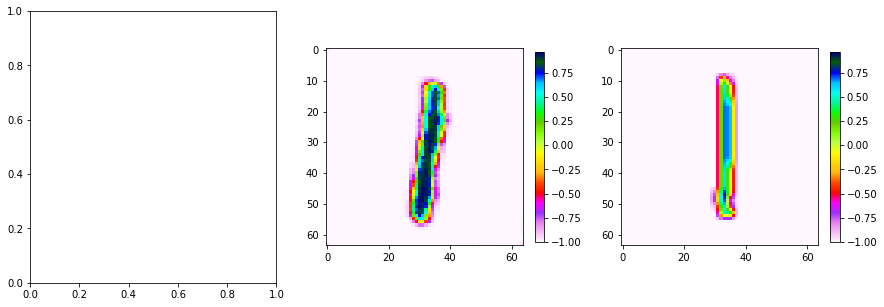

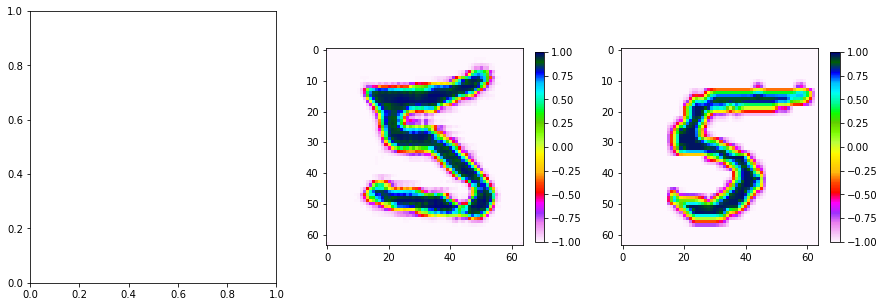

Epoch [3/30] Batch 500/938                   Loss D: -6.8234, loss G: 59.7789


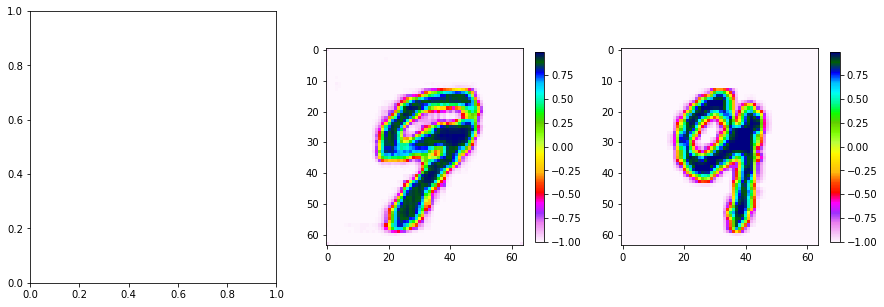

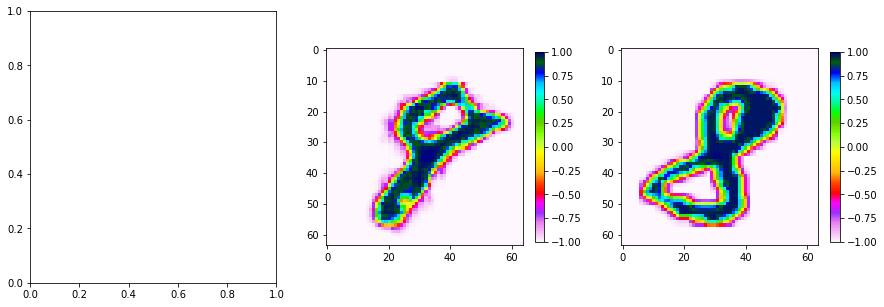

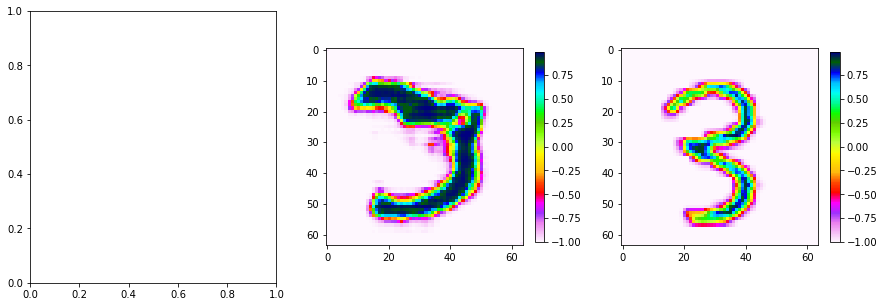

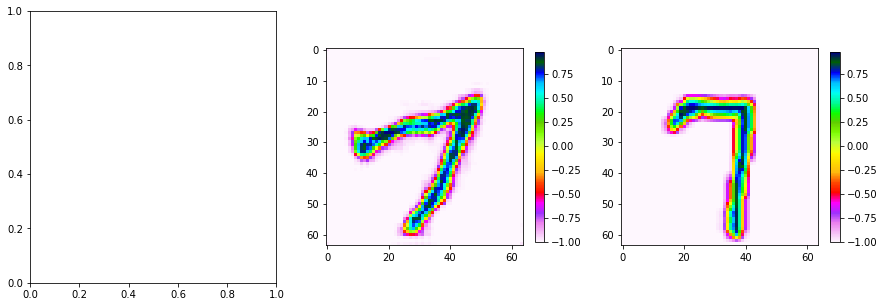

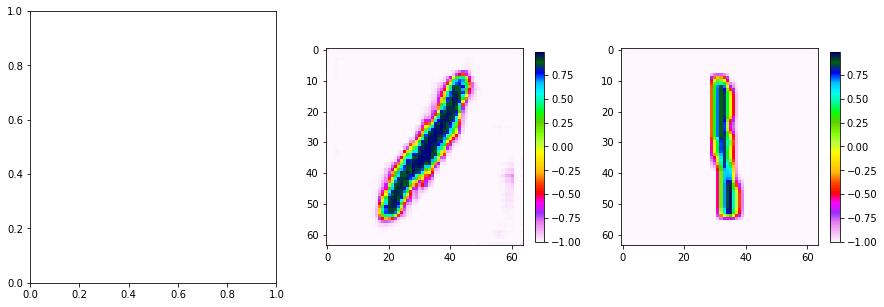

Epoch [3/30] Batch 600/938                   Loss D: -6.9678, loss G: 63.2199


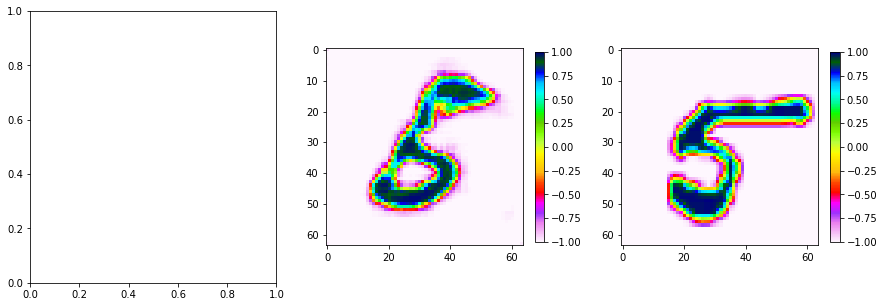

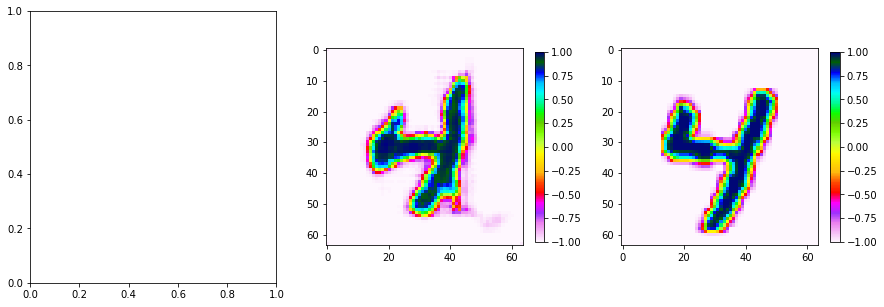

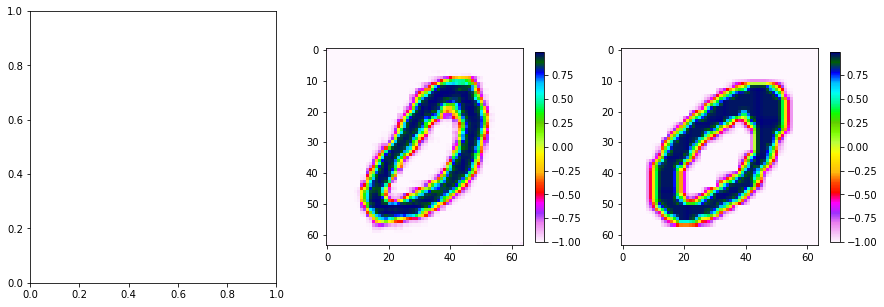

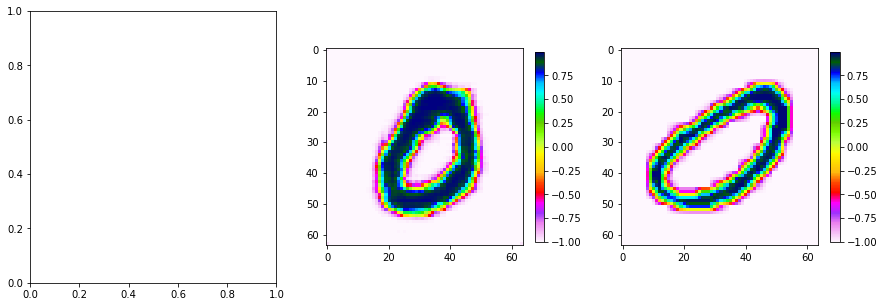

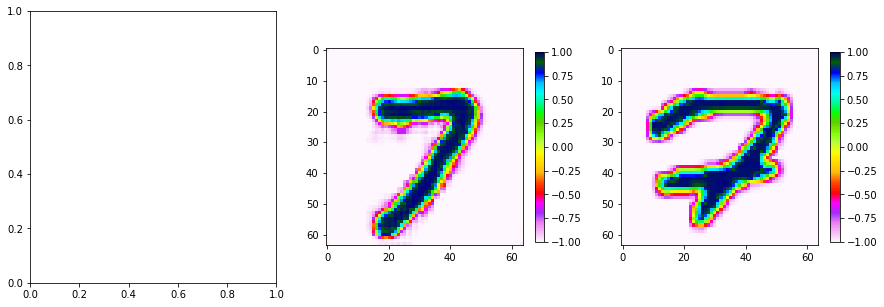

Epoch [3/30] Batch 700/938                   Loss D: -4.9968, loss G: 69.0793


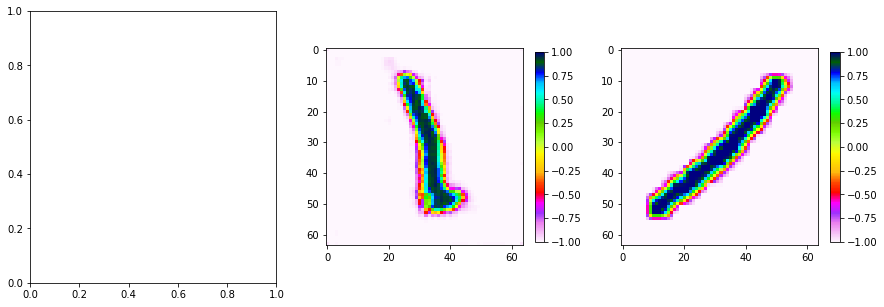

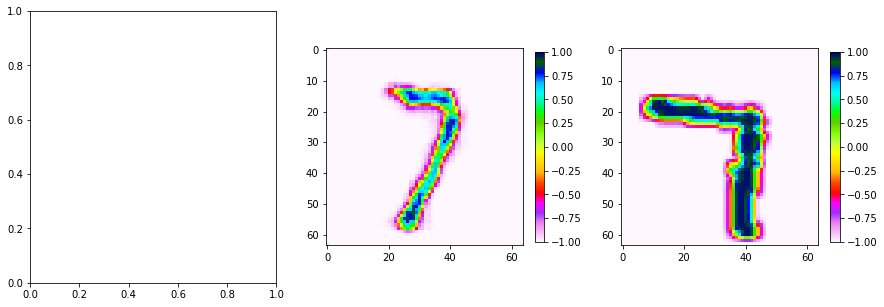

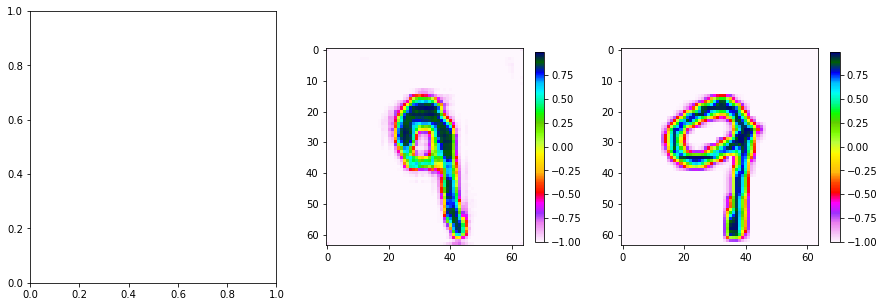

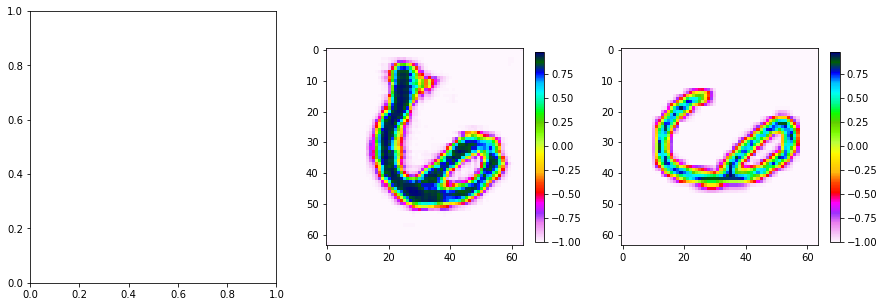

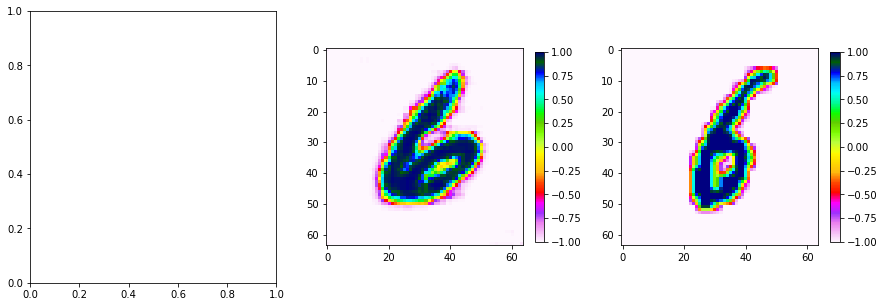

Epoch [3/30] Batch 800/938                   Loss D: -4.5028, loss G: 67.2699


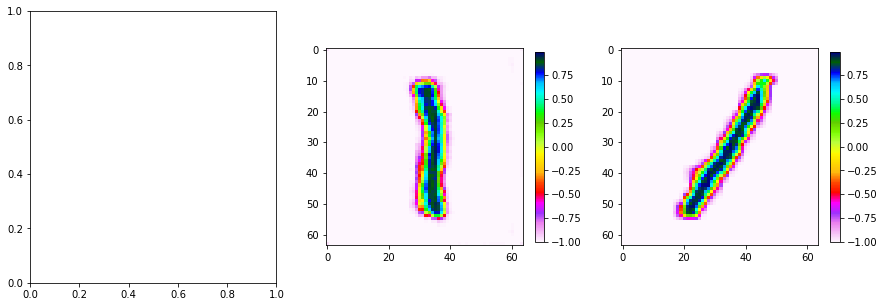

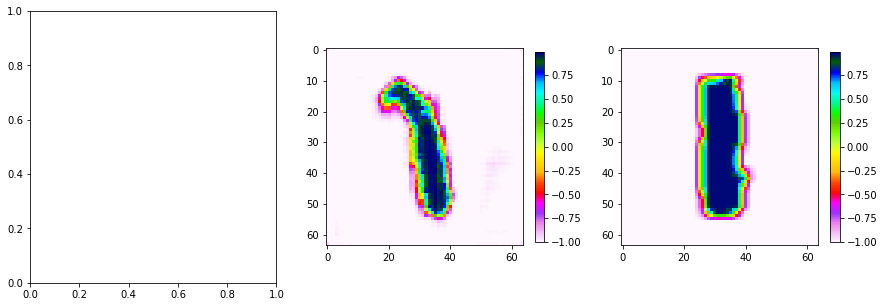

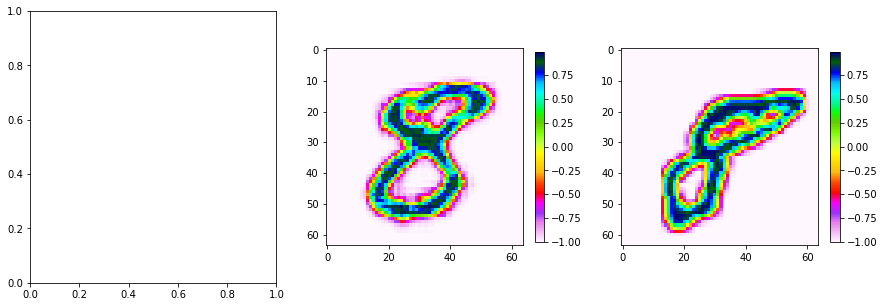

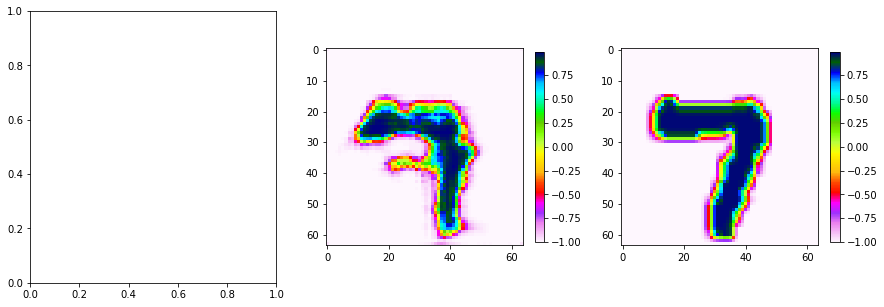

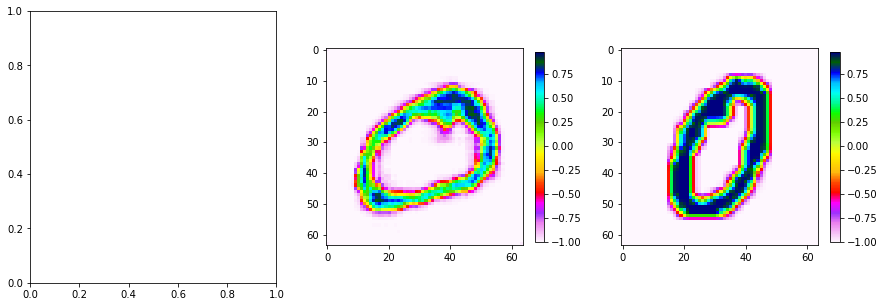

Epoch [3/30] Batch 900/938                   Loss D: -4.2353, loss G: 62.5560


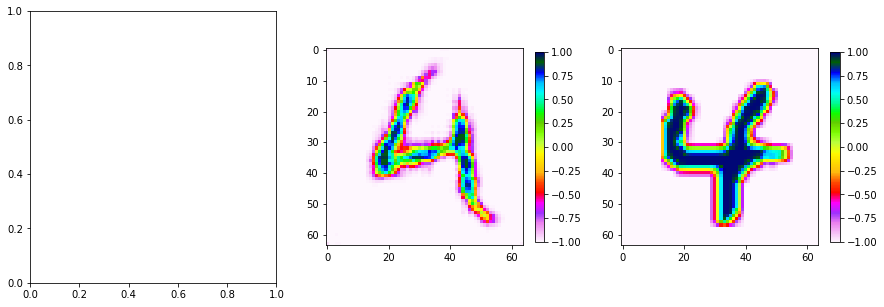

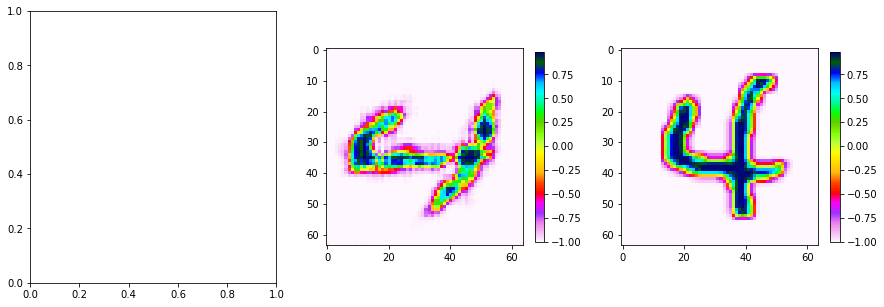

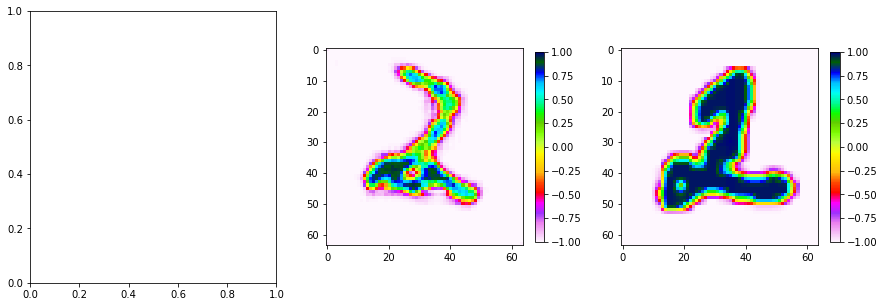

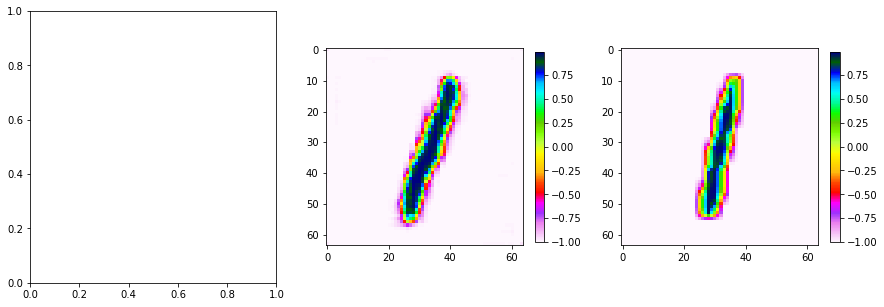

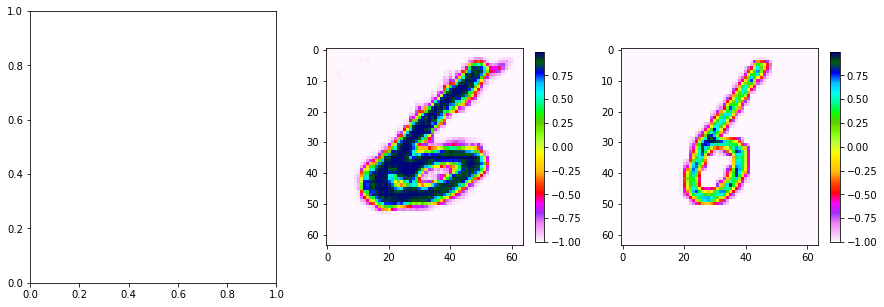

Epoch [4/30] Batch 0/938                   Loss D: -4.7317, loss G: 58.2032


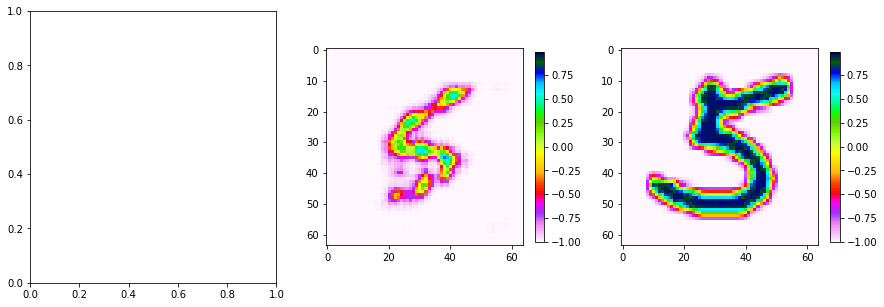

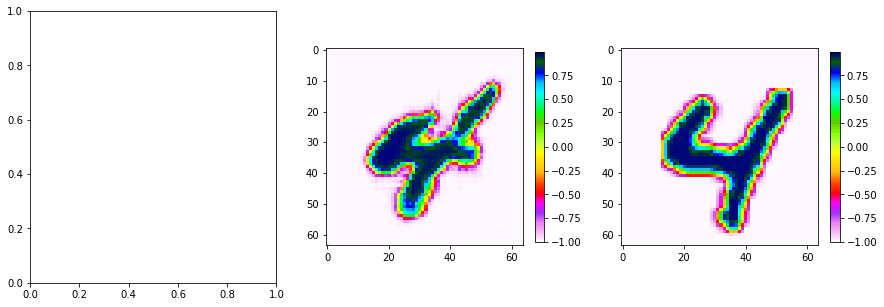

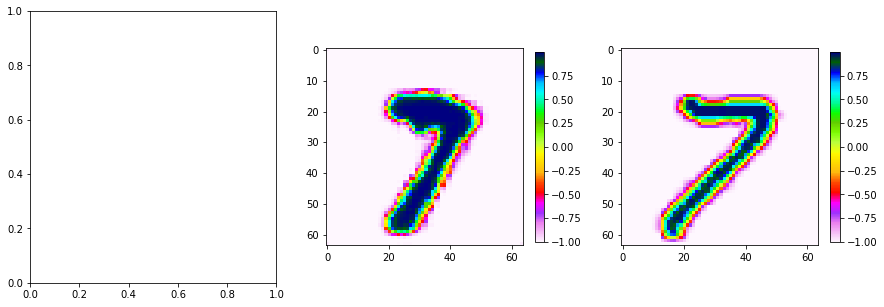

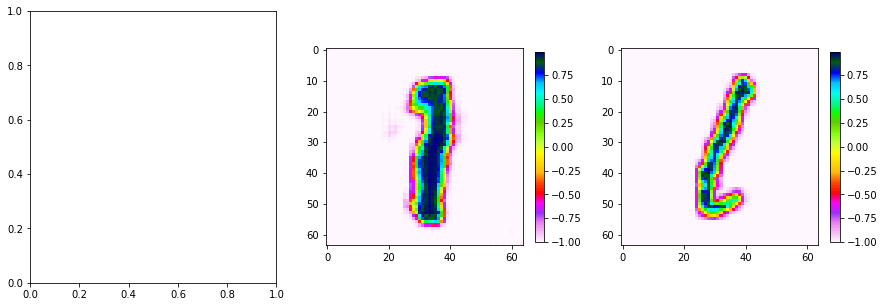

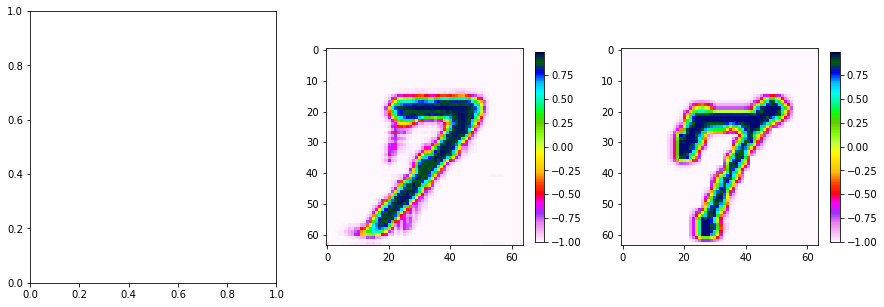

Epoch [4/30] Batch 100/938                   Loss D: -5.4451, loss G: 54.9842


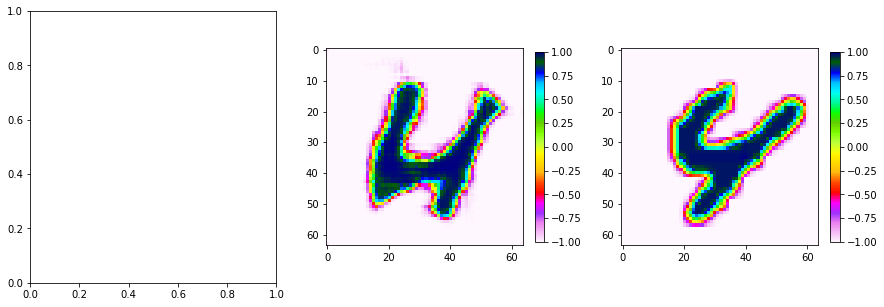

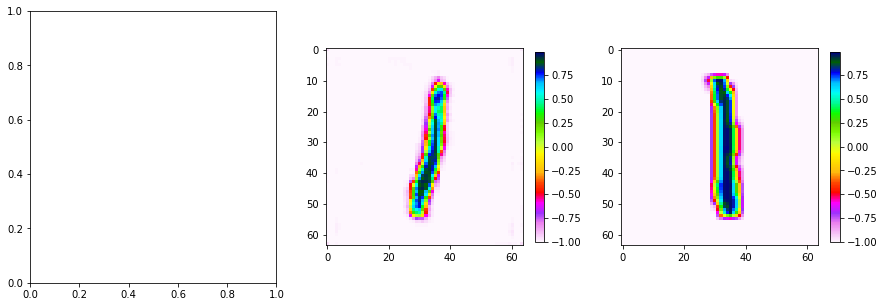

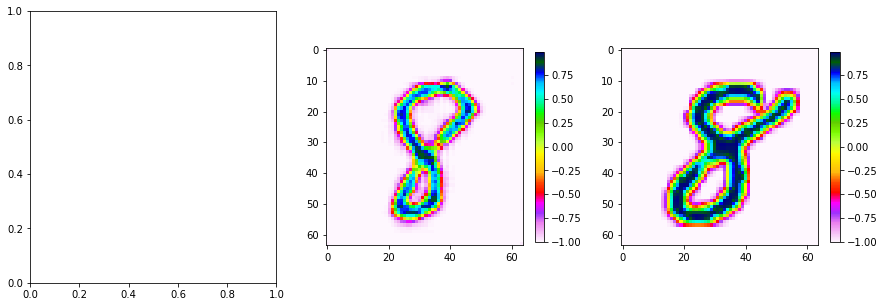

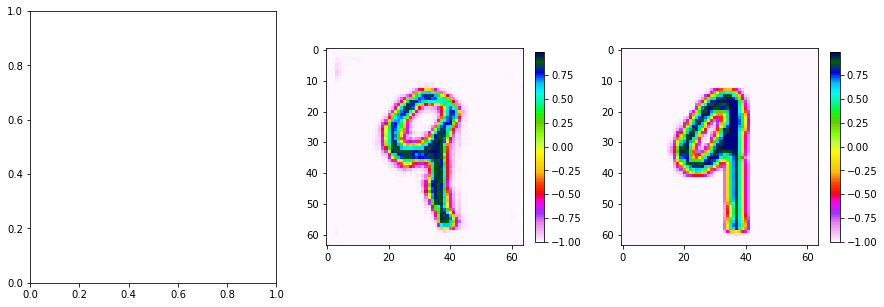

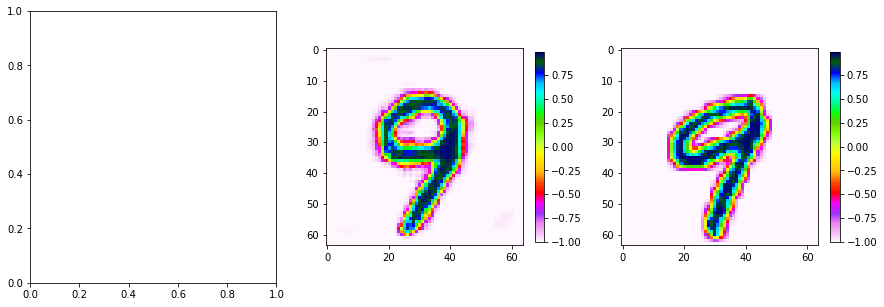

Epoch [4/30] Batch 200/938                   Loss D: -5.5492, loss G: 61.9059


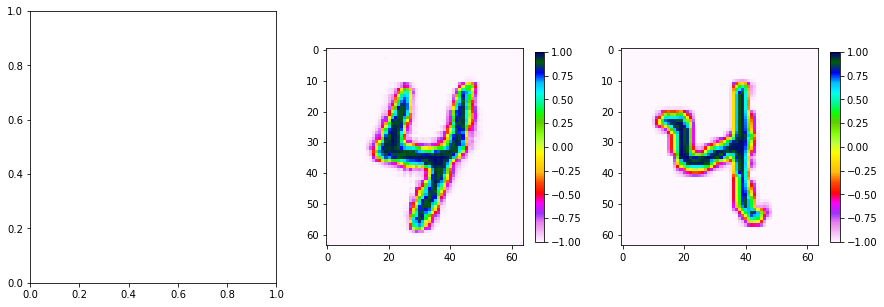

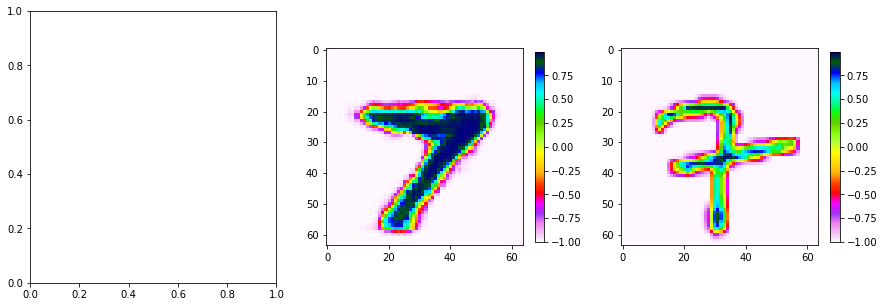

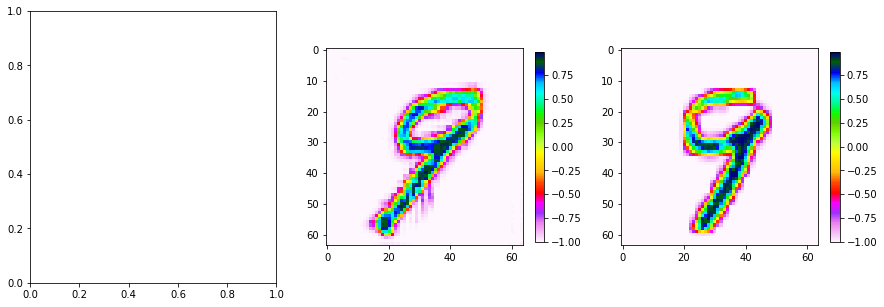

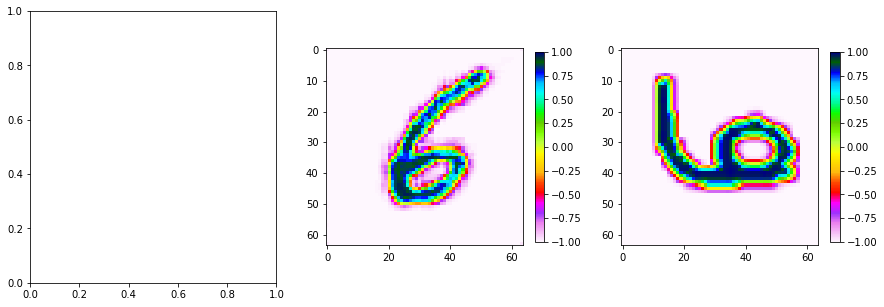

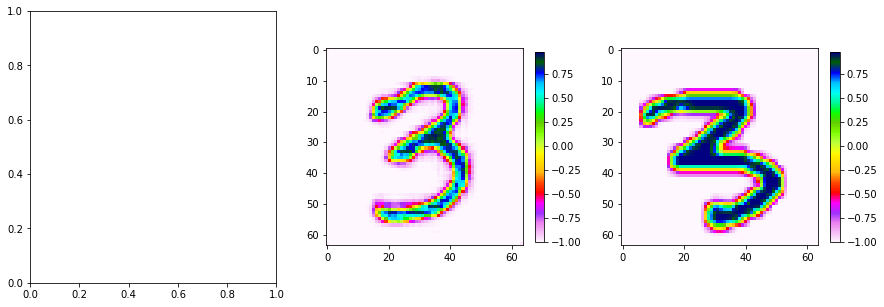

Epoch [4/30] Batch 300/938                   Loss D: -4.4420, loss G: 55.6565


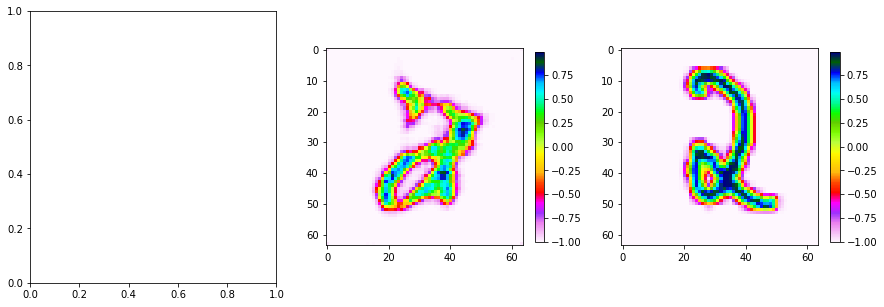

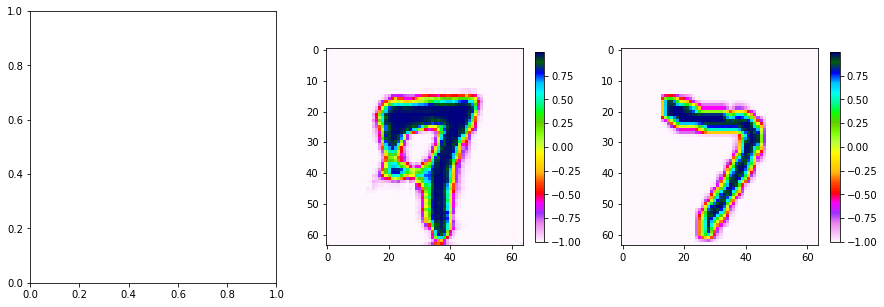

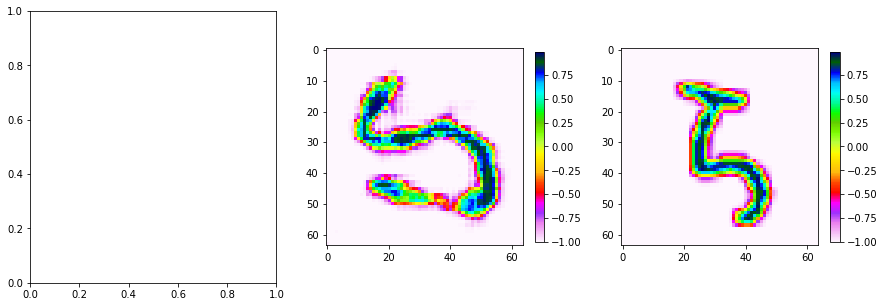

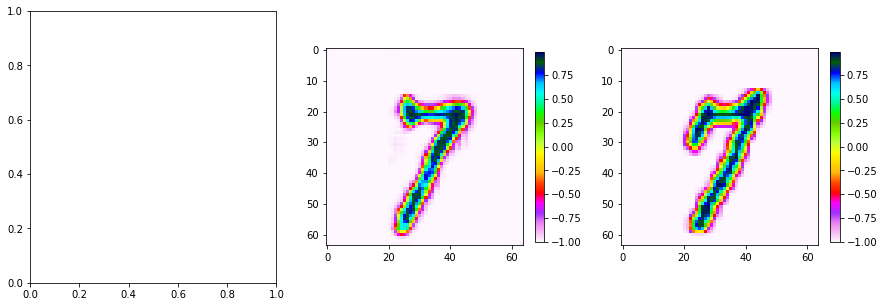

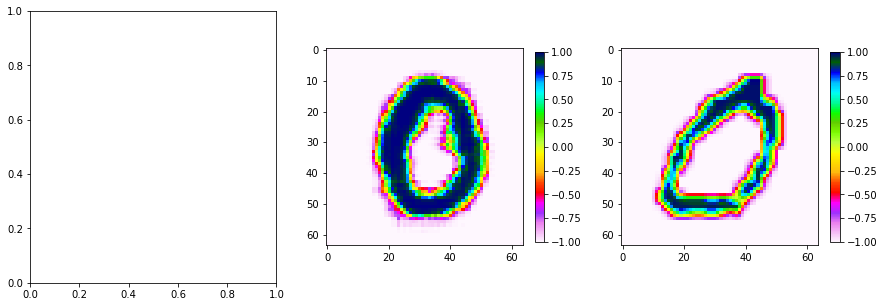

Epoch [4/30] Batch 400/938                   Loss D: -4.5211, loss G: 62.6880


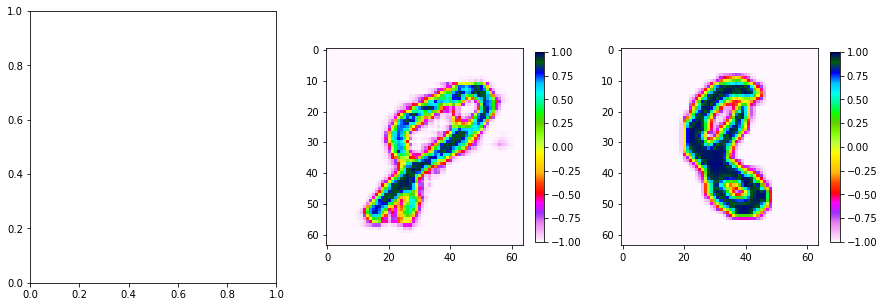

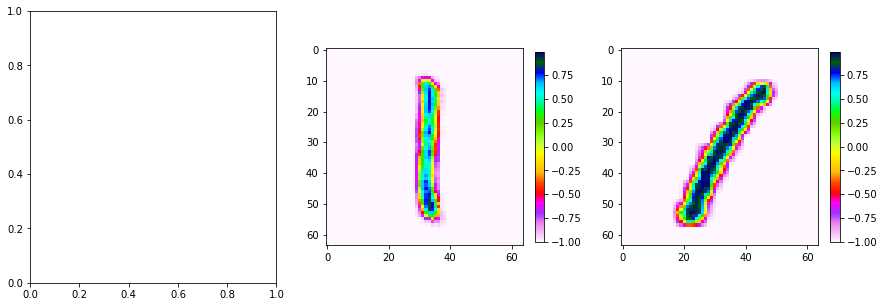

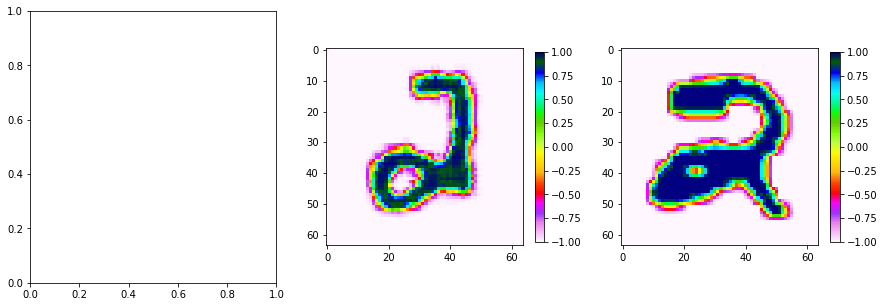

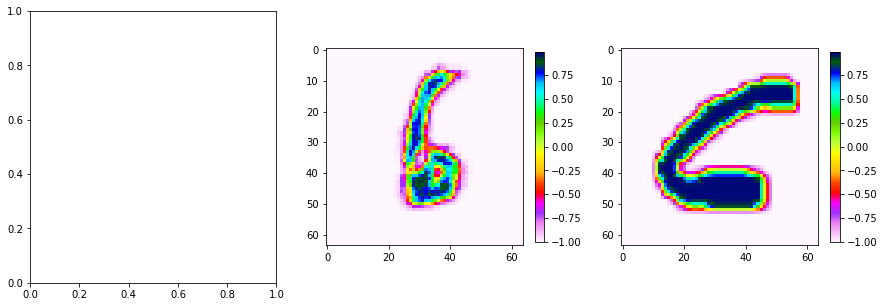

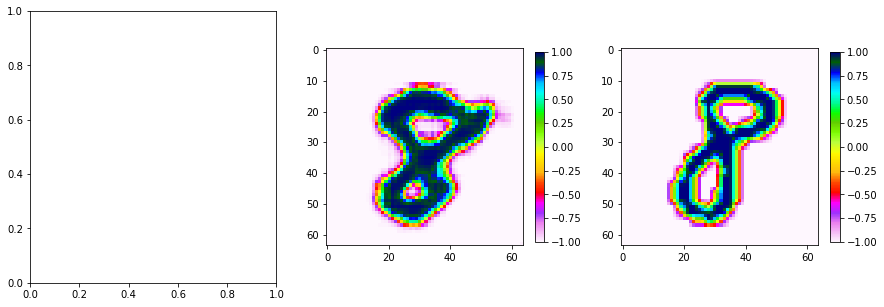

Epoch [4/30] Batch 500/938                   Loss D: -5.3134, loss G: 49.3794


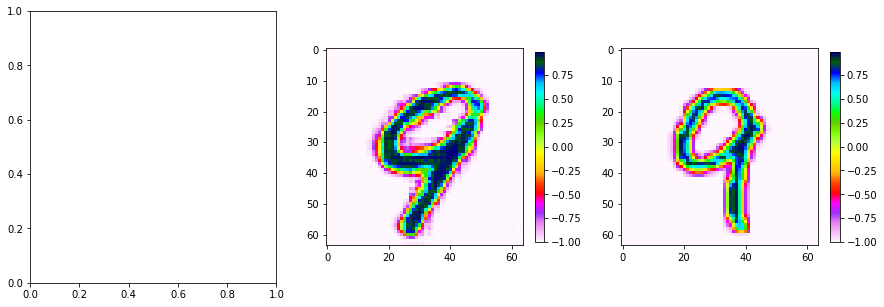

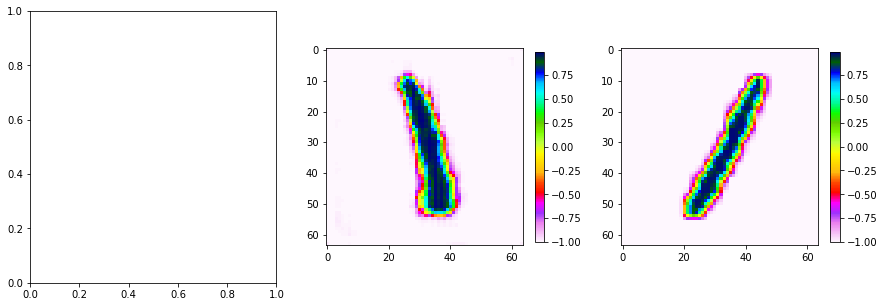

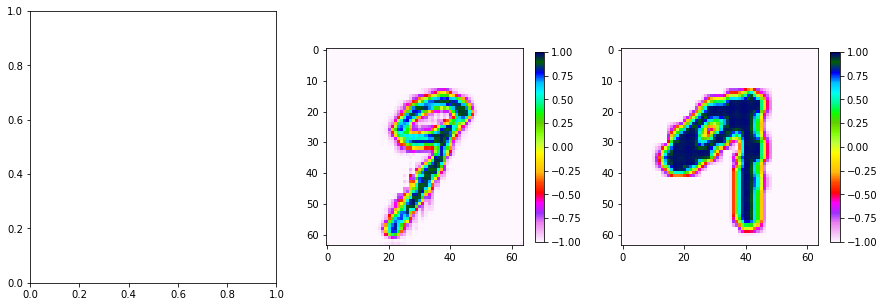

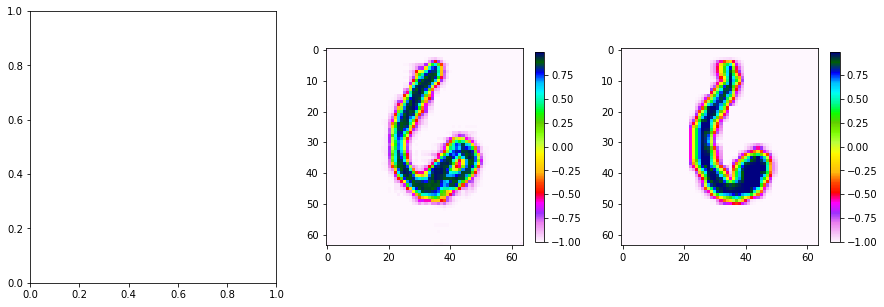

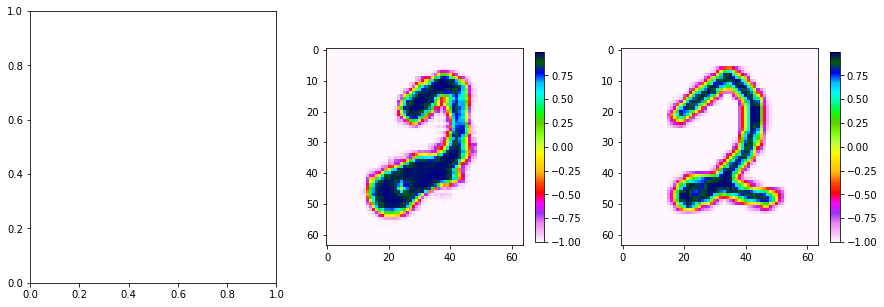

Epoch [4/30] Batch 600/938                   Loss D: -5.7666, loss G: 46.9850


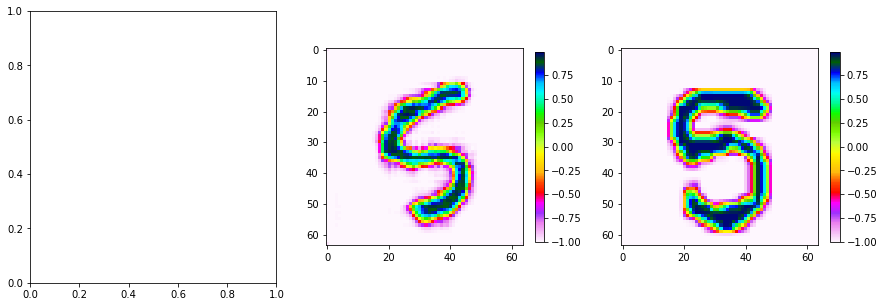

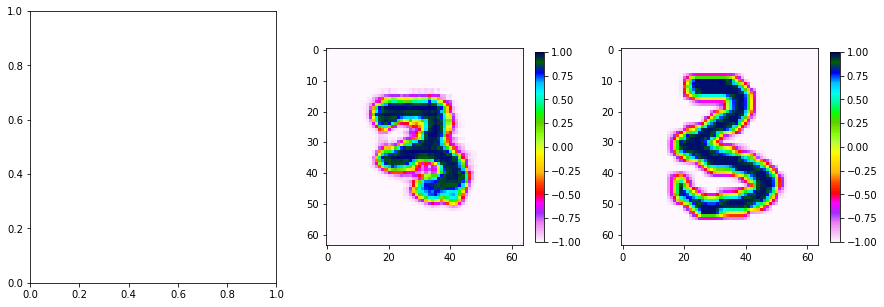

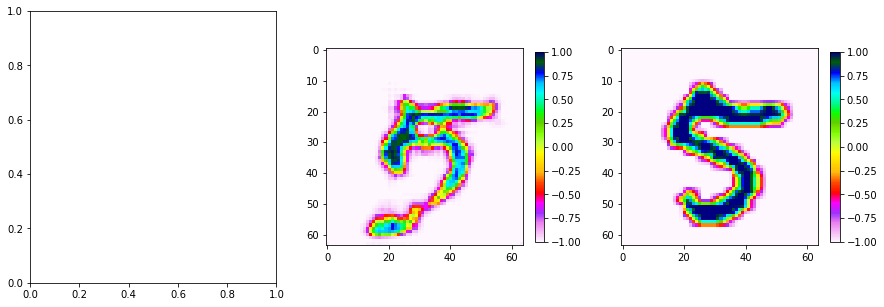

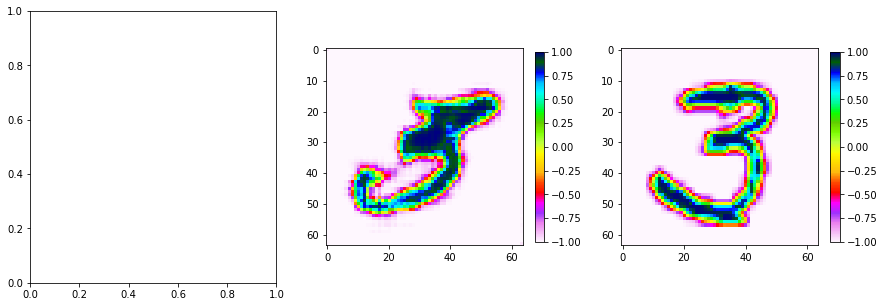

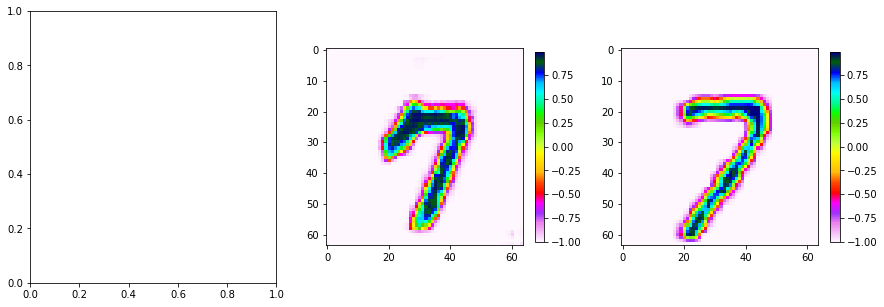

Epoch [4/30] Batch 700/938                   Loss D: -4.7382, loss G: 53.3869


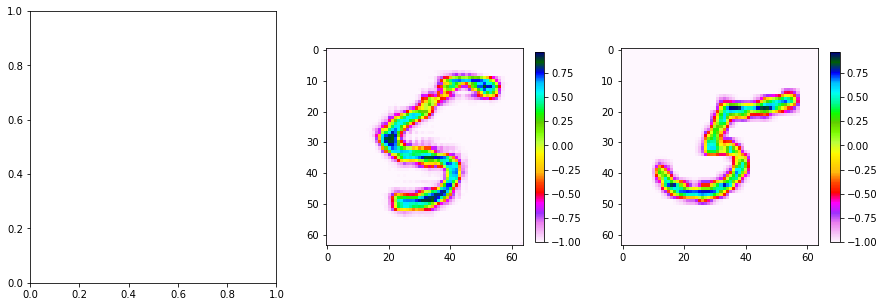

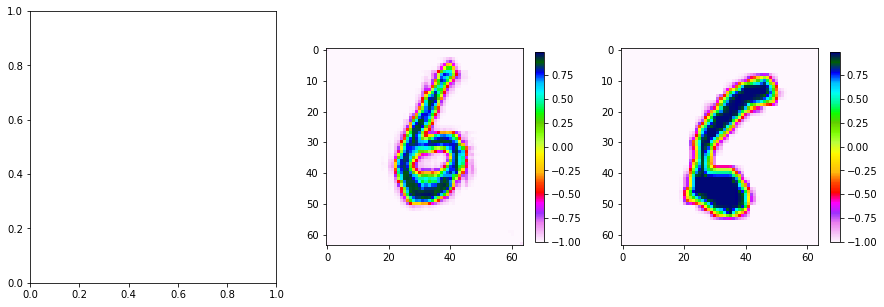

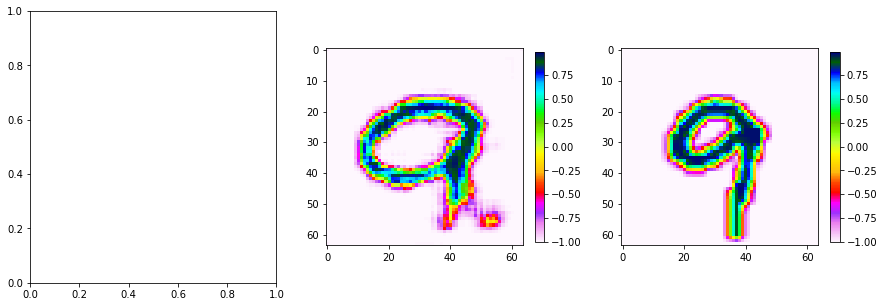

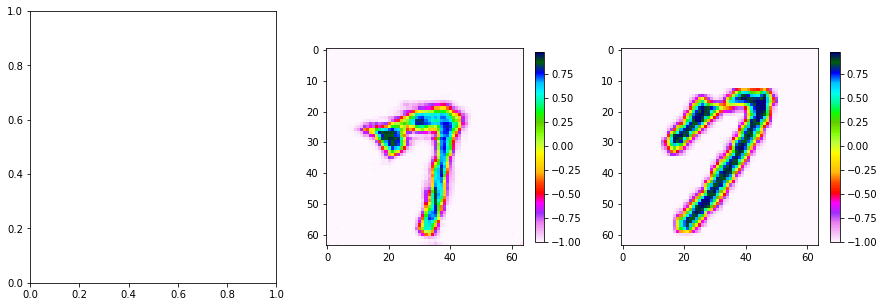

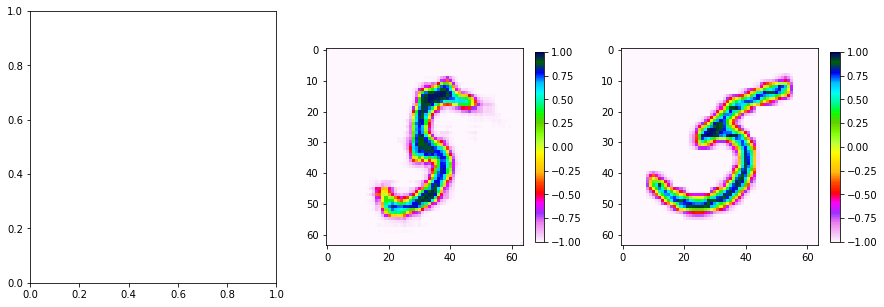

Epoch [4/30] Batch 800/938                   Loss D: -4.0522, loss G: 44.8731


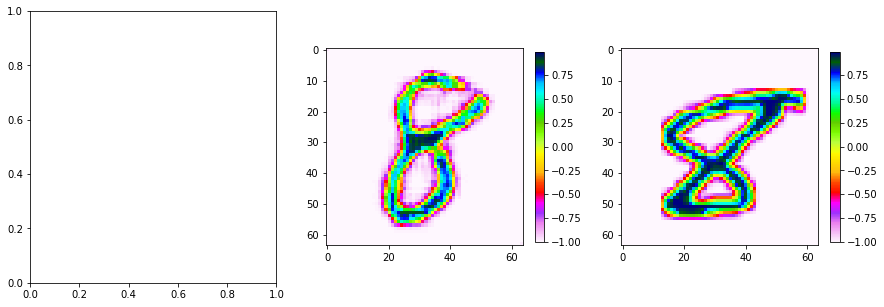

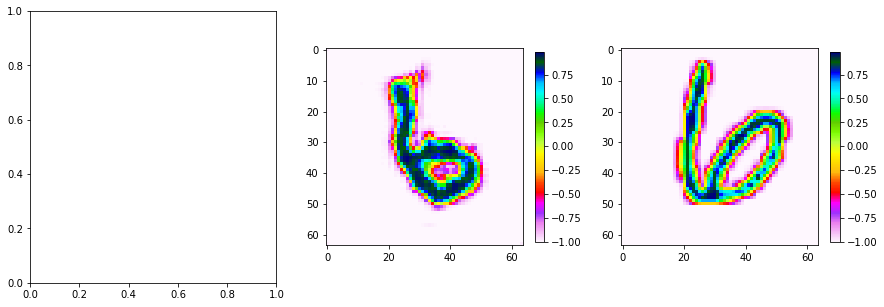

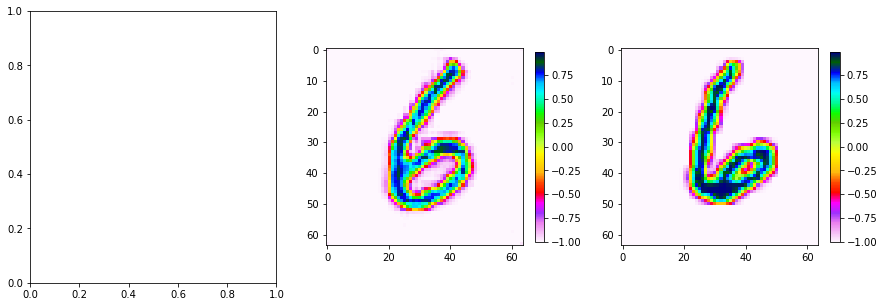

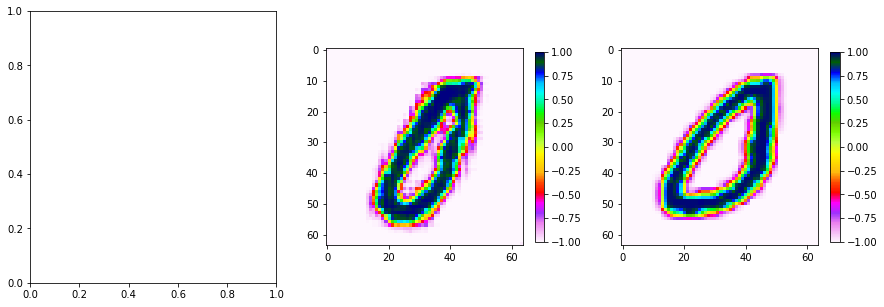

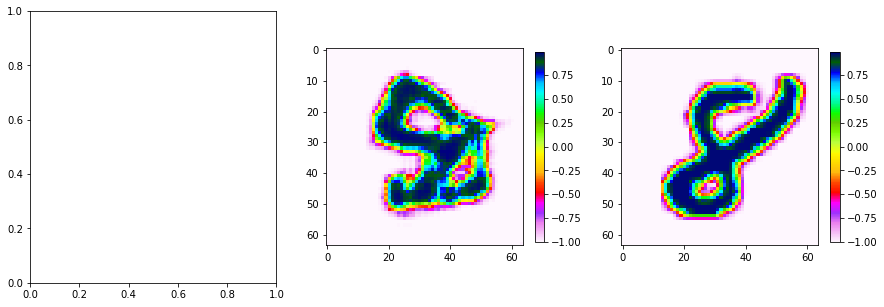

Epoch [4/30] Batch 900/938                   Loss D: -3.6507, loss G: 41.1138


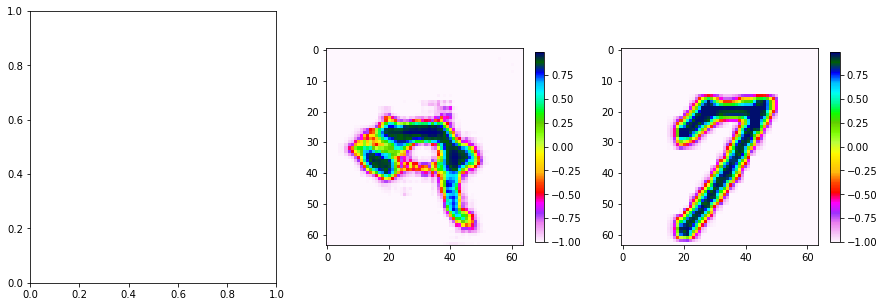

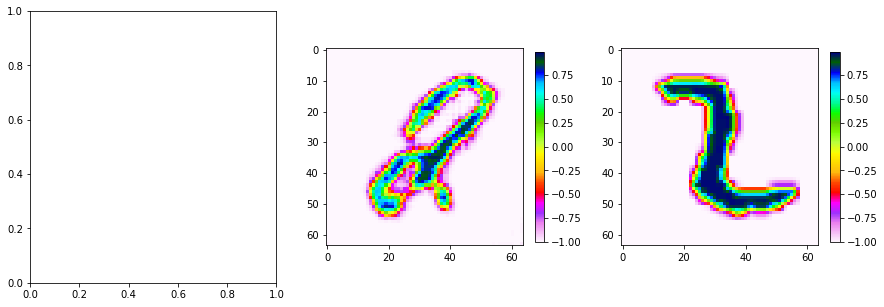

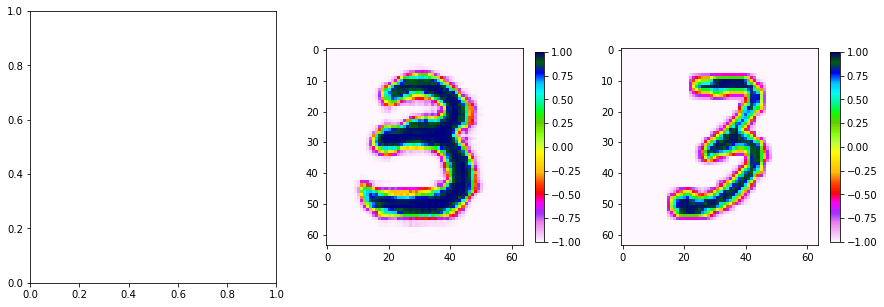

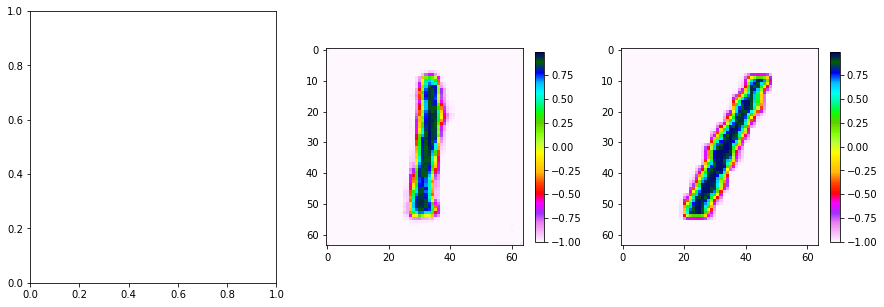

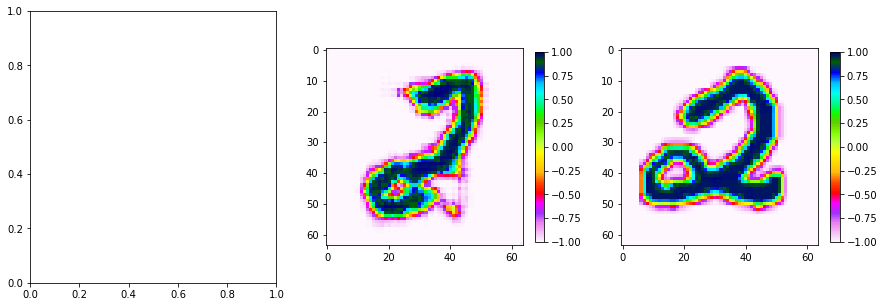

Epoch [5/30] Batch 0/938                   Loss D: -4.7753, loss G: 40.3210


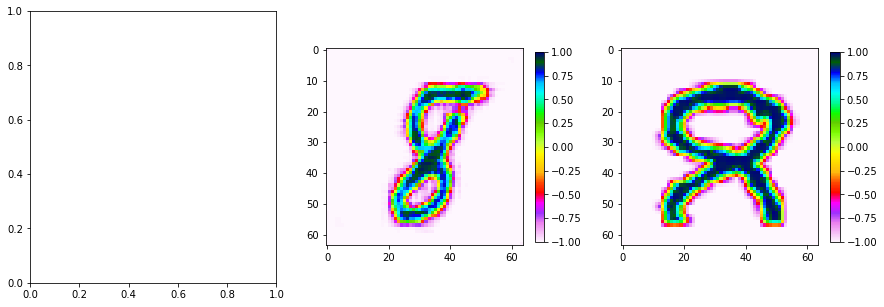

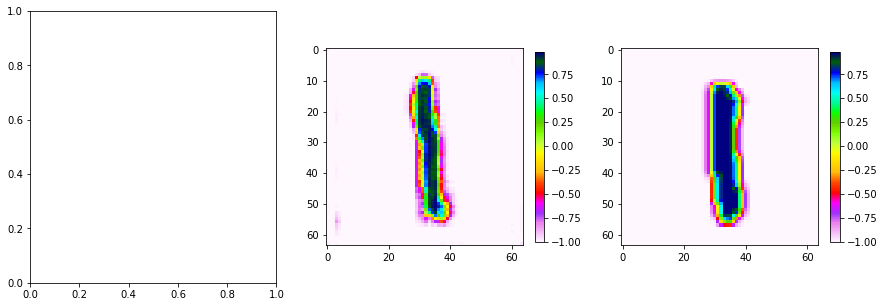

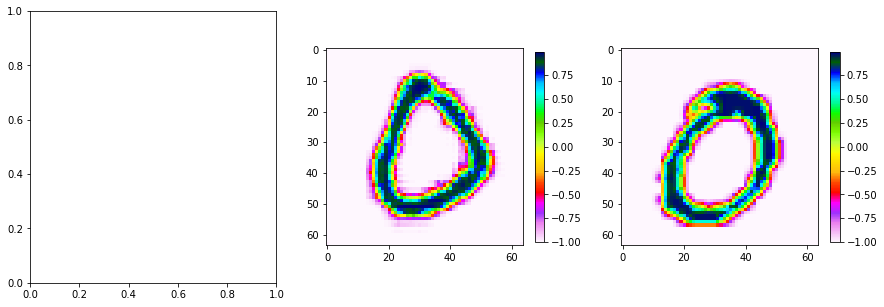

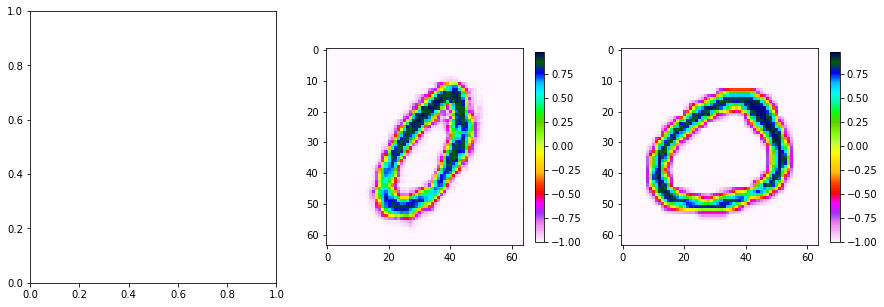

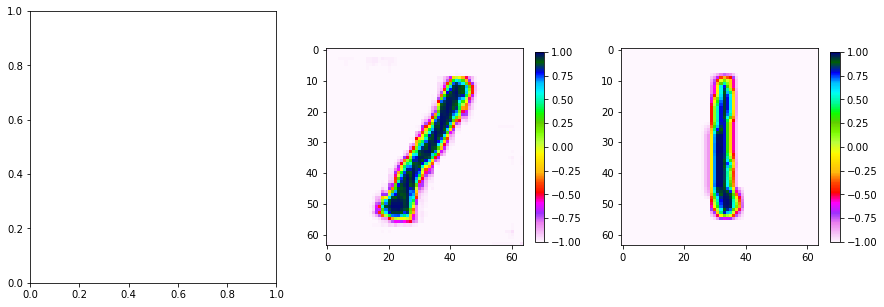

Epoch [5/30] Batch 100/938                   Loss D: -4.3889, loss G: 49.3374


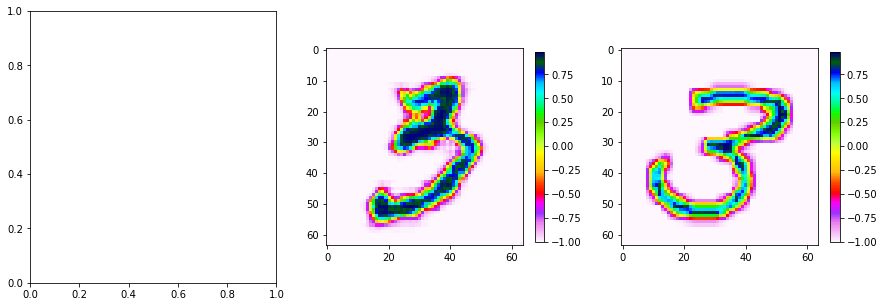

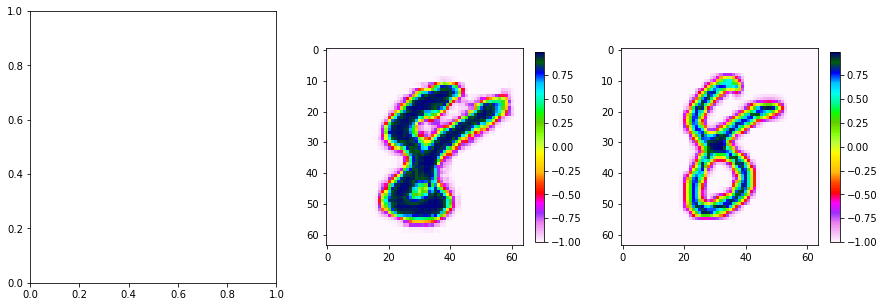

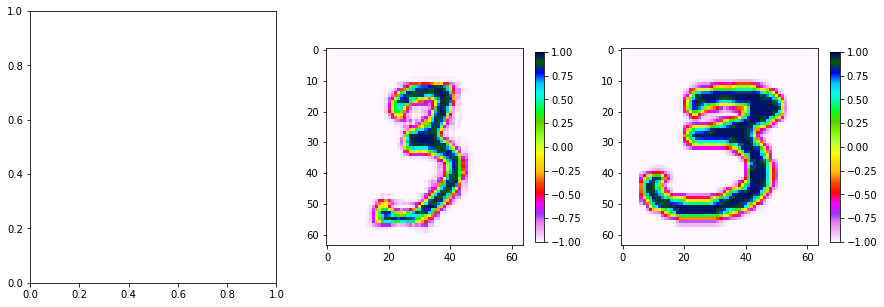

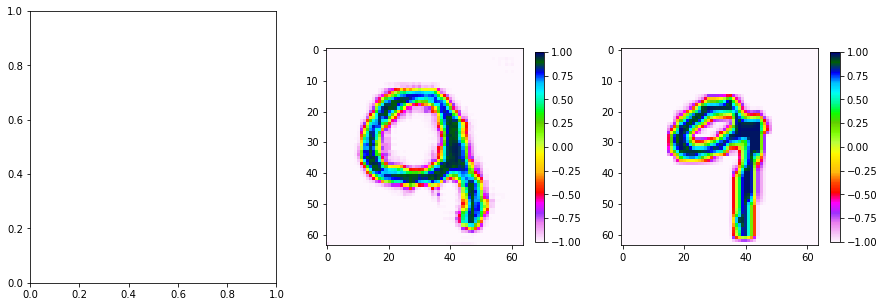

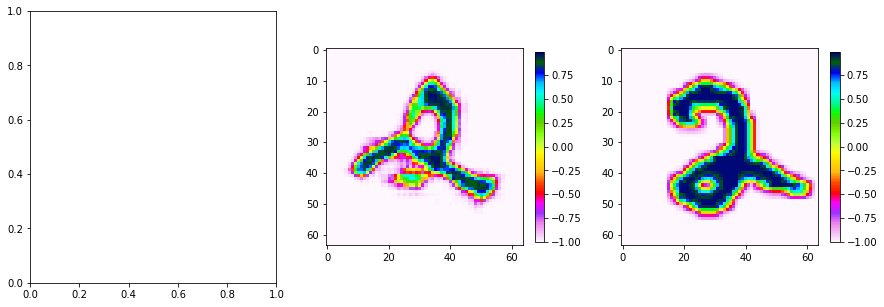

Epoch [5/30] Batch 200/938                   Loss D: -5.2998, loss G: 40.8765


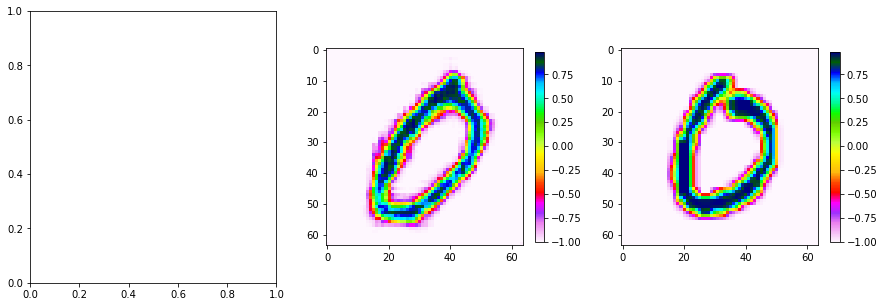

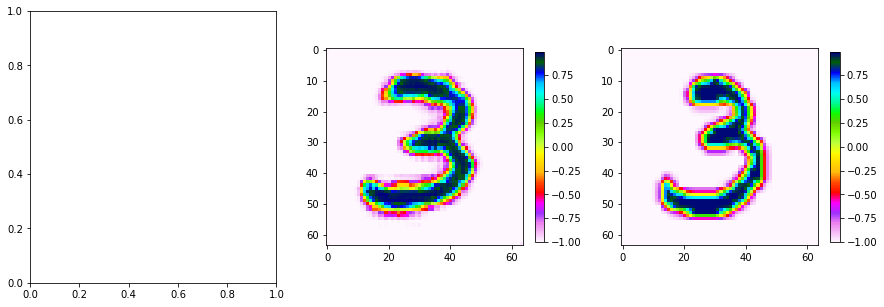

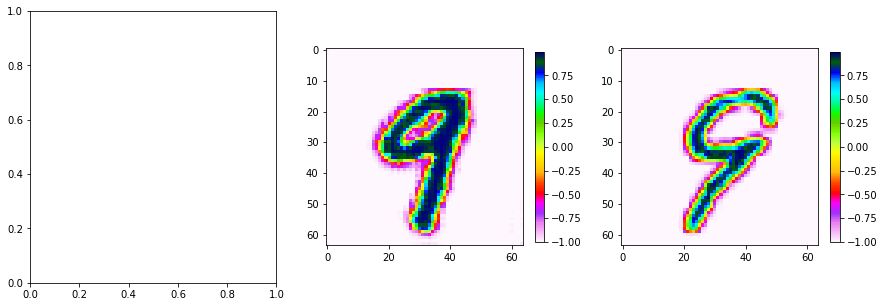

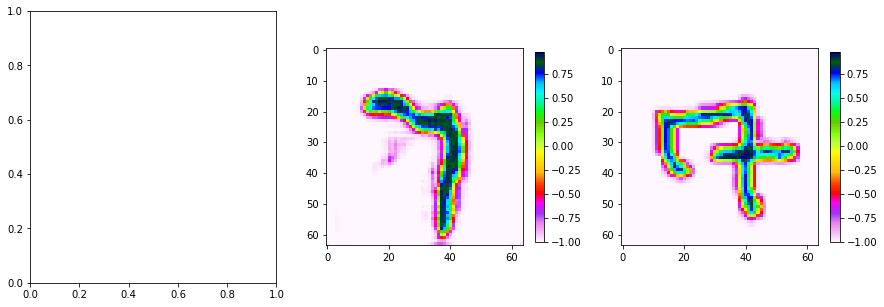

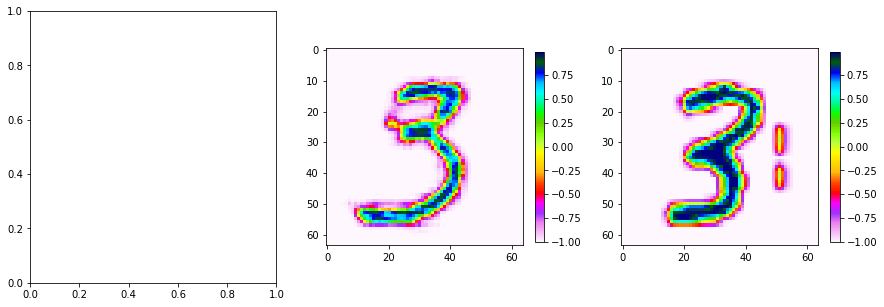

Epoch [5/30] Batch 300/938                   Loss D: -6.3337, loss G: 51.6053


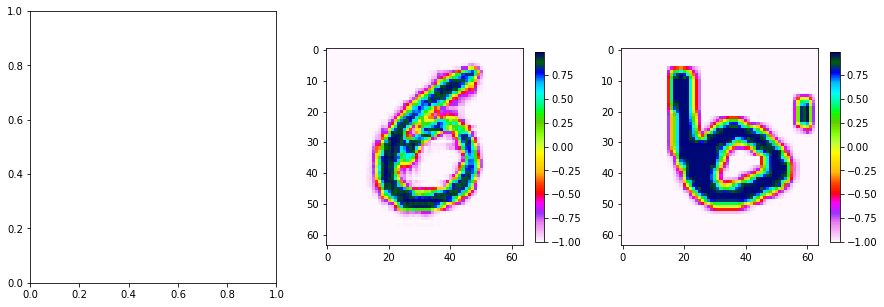

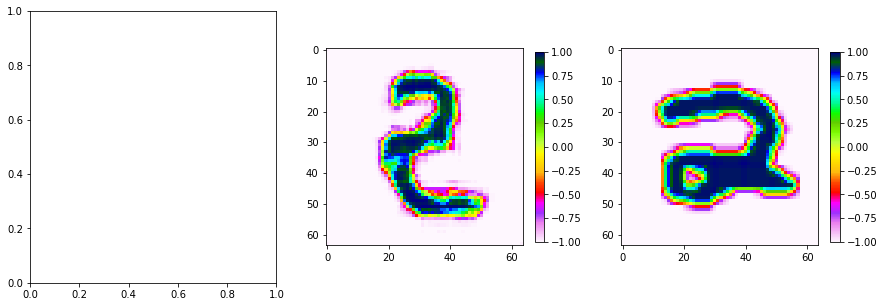

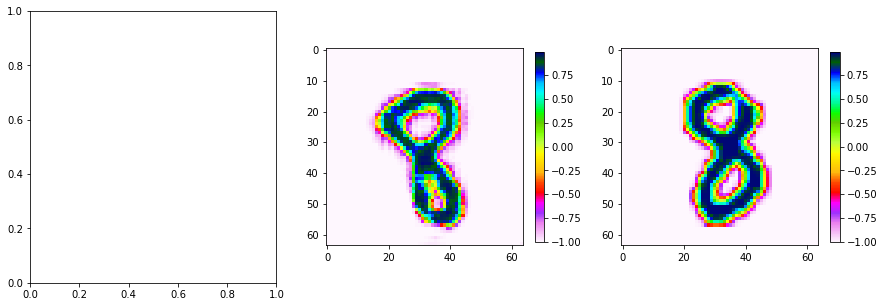

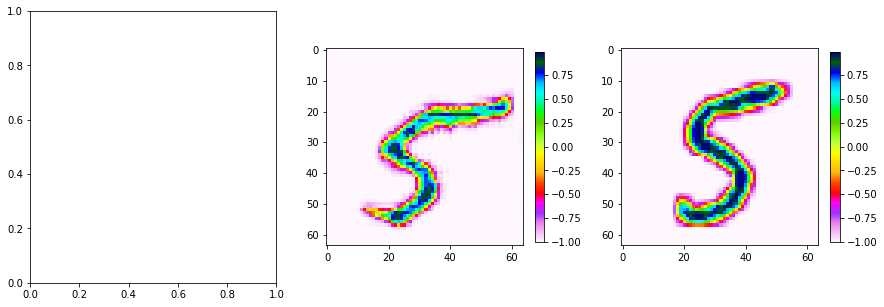

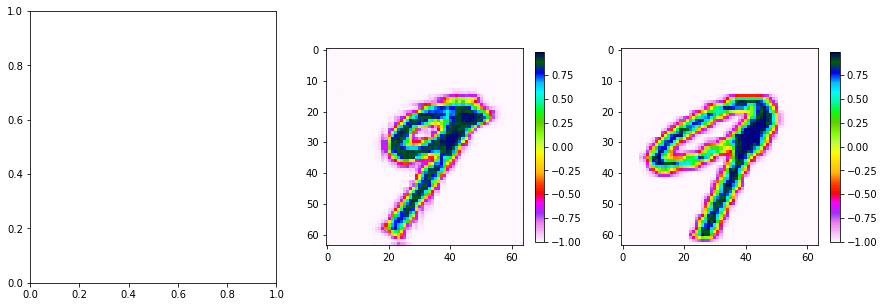

KeyboardInterrupt: 

In [202]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
        


class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d, num_classes, img_size):
        super(Discriminator, self).__init__()
        
        self.img_size = img_size
        self.embed = nn.Embedding(num_classes, img_size*img_size)
        self.disc = nn.Sequential(
            # input: N x channels_img x 64 x 64
            nn.Conv2d(
                channels_img+1, features_d, kernel_size=4, stride=2, padding=1
            ),
            nn.LeakyReLU(0.2),
            # _block(in_channels, out_channels, kernel_size, stride, padding)
            self._block(features_d, features_d * 2, 4, 2, 1),
            self._block(features_d * 2, features_d * 4, 4, 2, 1),
            self._block(features_d * 4, features_d * 8, 4, 2, 1),
            # After all _block img output is 4x4 (Conv2d below makes into 1x1)
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x, labels):
        embedding = self.embed(labels).view(labels.shape[0], 1, self.img_size, self.img_size)
        x = torch.cat([x, embedding], dim=1)
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g, num_classes, img_size, embed_size):
        super(Generator, self).__init__()
        self.img_size = img_size
        self.embed = nn.Embedding(num_classes, embed_size)
        self.net = nn.Sequential(
            # Input: N x channels_noise x 1 x 1
            self._block(channels_noise + embed_size, features_g * 16, 4, 1, 0),  # img: 4x4
            self._block(features_g * 16, features_g * 8, 4, 2, 1),  # img: 8x8
            self._block(features_g * 8, features_g * 4, 4, 2, 1),  # img: 16x16
            self._block(features_g * 4, features_g * 2, 4, 2, 1),  # img: 32x32
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1
            ),
            # Output: N x channels_img x 64 x 64
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x, labels):
        embedding  = self.embed(labels).unsqueeze(2).unsqueeze(3)
        x = torch.cat([x, embedding], dim = 1)
        x = self.net(x)
#         print(x.shape)
        return x


def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

            
            
def gradient_penalty(critic, labels, real, fake, device='cpu'):
    BATCH_SIZE, C, H, W = real.shape
    epsilon = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1,C,H,W).to(device)
    interpolated_images = real*epsilon + fake*(1-epsilon)
    
    mixed_scores = critic(interpolated_images, labels)
    gradient = torch.autograd.grad(
                inputs=interpolated_images,
                outputs=mixed_scores, 
                grad_outputs = torch.ones_like(mixed_scores), 
                create_graph=True, 
                retain_graph = True)[0]
    
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1)**2)
    return gradient_penalty
    
def plot_sample(noise, target, gen, labels, k=1):
    with torch.no_grad():
        preds = gen(noise, labels).reshape(-1, 1, 64, 64).detach().cpu().numpy()
    
    for i in range(k):
#         lr = cond[i, 0].detach().cpu().numpy()
        hr = target[i, 0].detach().cpu().numpy()
        pred = preds[i, 0]
#         print(pred)

        mn = np.min([np.min(lr), np.min(hr), np.min(pred)])
        mx = np.max([np.max(lr), np.max(hr), np.max(pred)])

        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
#         im = ax1.imshow(lr, vmin=mn, vmax=mx, cmap='gist_ncar_r')
#         plt.colorbar(im, ax=ax1, shrink=0.7)
        im = ax2.imshow(pred, vmin=mn, vmax=mx, cmap='gist_ncar_r')
        plt.colorbar(im, ax=ax2, shrink=0.7)
        im = ax3.imshow(hr, vmin=mn, vmax=mx, cmap='gist_ncar_r')
        plt.colorbar(im, ax=ax3, shrink=0.7)
        plt.show()  
        
"""
Training of DCGAN network with WGAN loss
"""

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

# Hyperparameters etc
device = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
IMG_SIZE = 64
CHANNELS_IMG = 1
Z_DIM = 100
NUM_EPOCHS = 30
FEATURES_CRITIC = 32 #64
FEATURES_GEN = 32 # 64
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10
NUM_CLASSES = 10
GEN_EMBEDDING = 100

transforms = transforms.Compose(
    [
        transforms.Resize(IMG_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
        ),
    ]
)

dataset = datasets.MNIST(root="dataset/", transform=transforms, download=True)
#comment mnist and uncomment below if you want to train on CelebA dataset
# dataset = datasets.CelebA(root="dataset/", transform=transforms, download=True)
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

# initialize gen and disc/critic
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN, NUM_CLASSES, IMG_SIZE, GEN_EMBEDDING).to(device)
critic = Discriminator(CHANNELS_IMG, FEATURES_CRITIC, NUM_CLASSES, IMG_SIZE,).to(device)
initialize_weights(gen)
initialize_weights(critic) 

# initializate optimizer
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

# for tensorboard plotting
fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)
writer_real = SummaryWriter(f"logs/real")
writer_fake = SummaryWriter(f"logs/fake")
step = 0

gen.train()
critic.train()

for epoch in range(NUM_EPOCHS):
    for batch_idx, (real, labels) in enumerate(loader):
        real = real.to(device)
        labels = labels.to(device)
        cur_batch_size = real.shape[0]

        # Train Critic: max E[critic(real)] - E[critic(fake)]
        for _ in range(CRITIC_ITERATIONS):
            noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(device)
            fake = gen(noise, labels)
            critic_real = critic(real, labels).reshape(-1)
            critic_fake = critic(fake, labels).reshape(-1)
            gp = gradient_penalty(critic, labels, real, fake, device=device)
            loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP*gp
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        gen_fake = critic(fake, labels).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Print losses occasionally and print to tensorboard
        if batch_idx % 100 == 0 and batch_idx >= 0:
            gen.eval()
            critic.eval()
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(loader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )
            noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(device)
            
            plot_sample(noise, real, gen, labels, k=5)

            step += 1
            gen.train()
            critic.train()